In [168]:
import imutil 

import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
import seaborn as sns
import statannot
import matplotlib
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import matplotlib.patches as patches
import umap.umap_ as umap
import umap.plot
from statannotations.Annotator import Annotator

In [169]:
%matplotlib inline

## experiment D + D.2 + A

In [170]:
current_os = '/'

Awt_alltreg_paths = []
Awt_mjtconv_paths = []
Awt_mjtreg_paths = []
for dp, dn, fn in os.walk(os.path.expanduser("../../data"+current_os+"Experiment A")):
    if "Tconvs" in dp:
        Awt_mjtconv_paths.append(dp)
    elif "MJ23 Treg" in dp:
        Awt_mjtreg_paths.append(dp)
    elif "Polyclonal" in dp:
        Awt_alltreg_paths.append(dp)

In [171]:
DdTEC_alltreg_paths = []
DdTEC_mjtconv_paths = []
Dwt_alltreg_paths = []
Dwt_mjtconv_paths = []
for dp, dn, fn in os.walk(os.path.expanduser("../../data"+current_os+"Experiment D")):
    if "Sample 7" in dp or "Sample 8" in dp:
        if "Tregs" in dp:
            DdTEC_alltreg_paths.append(dp)
        elif "MJ23 Tconv" in dp:
            DdTEC_mjtconv_paths.append(dp)
    else:
        if "Tregs" in dp:
            Dwt_alltreg_paths.append(dp)
        elif "MJ23 Tconv" in dp:
            Dwt_mjtconv_paths.append(dp)

In [172]:
D2dTEC_alltreg_paths = []
D2dTEC_mjtconv_paths = []
#dTEC_mjtreg_paths = []
D2wt_alltreg_paths = []
D2wt_mjtreg_paths = []
D2wt_mjtconv_paths = []
for dp, dn, fn in os.walk(os.path.expanduser("../../data"+current_os+"Experiment D.2")):
    if "dTEC" in dp:
        if "FINAL_Tregs" in dp:
            D2dTEC_alltreg_paths.append(dp)
        elif "FINAL_PD1 Tconv" in dp:
            D2dTEC_mjtconv_paths.append(dp)
        #elif "FINAL_MJ23 Treg" in dp:
        #    dTEC_mjtreg_paths.append(dp)
    else:
        if "FINAL_MJ23 Treg" in dp:
            D2wt_mjtreg_paths.append(dp)
        elif "FINAL_MJ23 Tconv" in dp:
            D2wt_mjtconv_paths.append(dp)
        elif "FINAL_Tregs" in dp:
            D2wt_alltreg_paths.append(dp)

In [173]:
Dmarkers = ["CD45.1", "pSTAT5", "Ki67","Foxp3", "CD25", "PD-1", "CD4"]
D2markers = ["pSTAT5", "Foxp3", "CD25", "CD8", "Ki67", "PD-1", "CD4", "CD45.1", "CD3"]
Amarkers = ["CD4", "pSTAT5", "Ki67", "Foxp3", "PD-1", "CD45.1"]

df = pd.DataFrame()

for i, tpath in enumerate(Dwt_alltreg_paths):
    nind1 = tpath.split('Sample')[-1].split('-')[0].strip()
    nind2 = tpath.split("Portal LN")[-1].split(current_os)[0].strip()
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, Dmarkers, "polyclonal Treg", nind1+"."+nind2, experiment = "D", treatment = "WT", current_os=current_os)])
    
for i, tpath in enumerate(D2wt_alltreg_paths):
    nind = tpath.replace(" ", "").split('n=')[-1].split(current_os)[0]
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, D2markers, "polyclonal Treg", nind, experiment = "D2", treatment = "WT", current_os=current_os)])
    
df = pd.concat([df,imutil.read_in_imaris_folder(Awt_alltreg_paths[0], Amarkers, "polyclonal Treg", "1", experiment = "A", treatment = "WT", current_os=current_os)])

for i, tpath in enumerate(DdTEC_alltreg_paths):
    nind1 = tpath.split('Sample')[-1].split('-')[0].strip()
    nind2 = tpath.split("Portal LN")[-1].split(current_os)[0].strip()    
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, Dmarkers, "polyclonal Treg", nind1+"."+nind2, experiment = "D", treatment = "dTEC", current_os=current_os)])


for i, tpath in enumerate(D2dTEC_alltreg_paths):
    nind = tpath.replace(" ", "").split('n=')[-1].split(current_os)[0]
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, D2markers, "polyclonal Treg", nind, experiment = "D2", treatment = "dTEC", current_os=current_os)])
    

for i, tpath in enumerate(Dwt_mjtconv_paths):
    nind1 = tpath.split('Sample')[-1].split('-')[0].strip()
    nind2 = tpath.split("Portal LN")[-1].split(current_os)[0].strip()
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, Dmarkers, "MJ Tconv", nind1+"."+nind2, experiment = "D", treatment = "WT", current_os=current_os)])

for i, tpath in enumerate(D2wt_mjtconv_paths):
    nind = tpath.replace(" ", "").split('n=')[-1].split(current_os)[0]
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, D2markers, "MJ Tconv", nind, experiment = "D2", treatment = "WT", current_os=current_os)])

df = pd.concat([df,imutil.read_in_imaris_folder(Awt_mjtconv_paths[0], Amarkers, "MJ Tconv", "1", experiment = "A", treatment = "WT", current_os=current_os)])


for i, tpath in enumerate(DdTEC_mjtconv_paths):
    nind1 = tpath.split('Sample')[-1].split('-')[0].strip()
    nind2 = tpath.split("Portal LN")[-1].split(current_os)[0].strip()
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, Dmarkers, "MJ Tconv", nind1+"."+nind2, experiment = "D", treatment = "dTEC", current_os=current_os)])

for i, tpath in enumerate(D2dTEC_mjtconv_paths):
    nind = tpath.replace(" ", "").split('n=')[-1].split(current_os)[0]
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, D2markers, "MJ Tconv", nind, experiment = "D2", treatment = "dTEC", current_os=current_os)])
    

for i, tpath in enumerate(D2wt_mjtreg_paths):
    nind = tpath.replace(" ", "").split('n=')[-1].split(current_os)[0]
    df = pd.concat([df,imutil.read_in_imaris_folder(tpath, D2markers, "MJ Treg", nind, experiment = "D2", treatment = "WT", current_os=current_os)])

df = pd.concat([df,imutil.read_in_imaris_folder(Awt_mjtreg_paths[0], Amarkers, "MJ Treg", "1", experiment = "A", treatment = "WT", current_os=current_os)])

In [174]:
df

,x,y,z,CD45.1 MFI,CD45.1 SFI,pSTAT5 MFI,pSTAT5 SFI,Ki67 MFI,Ki67 SFI,Foxp3 MFI,...,CD4 MFI,CD4 SFI,cell,sample,experiment,treatment,CD8 MFI,CD8 SFI,CD3 MFI,CD3 SFI
0,19635.5,32515.5,12.32050,52.2842,43605.0,214.2760,178706.0,43.81770,36544.0,208.394,...,233.5290,194763.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
1,19680.3,32472.0,8.92259,20.3029,4893.0,148.2900,35738.0,184.01200,44347.0,193.432,...,76.8589,18523.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
2,19792.9,32372.4,7.11150,109.8340,115216.0,181.8240,190733.0,14.00380,14690.0,211.239,...,251.1260,263431.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
3,19639.2,32517.3,14.21860,18.4184,17608.0,150.0410,143439.0,41.81690,39977.0,202.101,...,110.2530,105402.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
4,19785.9,32380.6,7.77885,91.6140,99676.0,327.6160,356446.0,27.76560,30209.0,272.610,...,355.2090,386467.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,38396.3,47319.9,22.41940,208.5050,115095.0,34.8533,19239.0,119.58700,66012.0,254.467,...,85.1920,47026.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN
102,38493.6,47290.8,17.92750,174.5490,244369.0,46.4093,64973.0,211.85100,296591.0,483.649,...,112.6990,157779.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN
103,38509.2,46894.2,20.20360,115.6410,156000.0,31.1394,42007.0,203.12000,274009.0,225.119,...,47.4329,63987.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN
104,38479.0,46835.4,15.12480,91.0659,40069.0,46.1341,20299.0,5.81591,2559.0,373.130,...,71.7273,31560.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN


In [175]:
df = imutil.remove_duplicate_cells(df, "MJ Treg", "polyclonal Treg")

In [176]:
df

,x,y,z,CD45.1 MFI,CD45.1 SFI,pSTAT5 MFI,pSTAT5 SFI,Ki67 MFI,Ki67 SFI,Foxp3 MFI,...,CD4 MFI,CD4 SFI,cell,sample,experiment,treatment,CD8 MFI,CD8 SFI,CD3 MFI,CD3 SFI
0,19635.5,32515.5,12.32050,52.2842,43605.0,214.2760,178706.0,43.81770,36544.0,208.394,...,233.5290,194763.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
1,19680.3,32472.0,8.92259,20.3029,4893.0,148.2900,35738.0,184.01200,44347.0,193.432,...,76.8589,18523.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
2,19792.9,32372.4,7.11150,109.8340,115216.0,181.8240,190733.0,14.00380,14690.0,211.239,...,251.1260,263431.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
3,19639.2,32517.3,14.21860,18.4184,17608.0,150.0410,143439.0,41.81690,39977.0,202.101,...,110.2530,105402.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
4,19785.9,32380.6,7.77885,91.6140,99676.0,327.6160,356446.0,27.76560,30209.0,272.610,...,355.2090,386467.0,polyclonal Treg,WT.D.6.1,D,WT,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63411,38396.3,47319.9,22.41940,208.5050,115095.0,34.8533,19239.0,119.58700,66012.0,254.467,...,85.1920,47026.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN
63412,38493.6,47290.8,17.92750,174.5490,244369.0,46.4093,64973.0,211.85100,296591.0,483.649,...,112.6990,157779.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN
63413,38509.2,46894.2,20.20360,115.6410,156000.0,31.1394,42007.0,203.12000,274009.0,225.119,...,47.4329,63987.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN
63414,38479.0,46835.4,15.12480,91.0659,40069.0,46.1341,20299.0,5.81591,2559.0,373.130,...,71.7273,31560.0,MJ Treg,WT.A.1,A,WT,NaN,NaN,NaN,NaN


In [177]:
block1 = ["WT.D.5.1", "dTEC.D.7.1"]
block2 = ["WT.D.6.1", "WT.D.6.2", "dTEC.D.8.1", "dTEC.D.8.2"]
block3 = ["WT.D2.1", "dTEC.D2.1", "dTEC.D2.2"]
block4 = ["WT.D2.2", "WT.D2.3", "dTEC.D2.2-2"]
block5 = ["WT.A.1"]
blocks = [block1, block2, block3, block4, block5]

df = imutil.define_blocks(df, blocks)

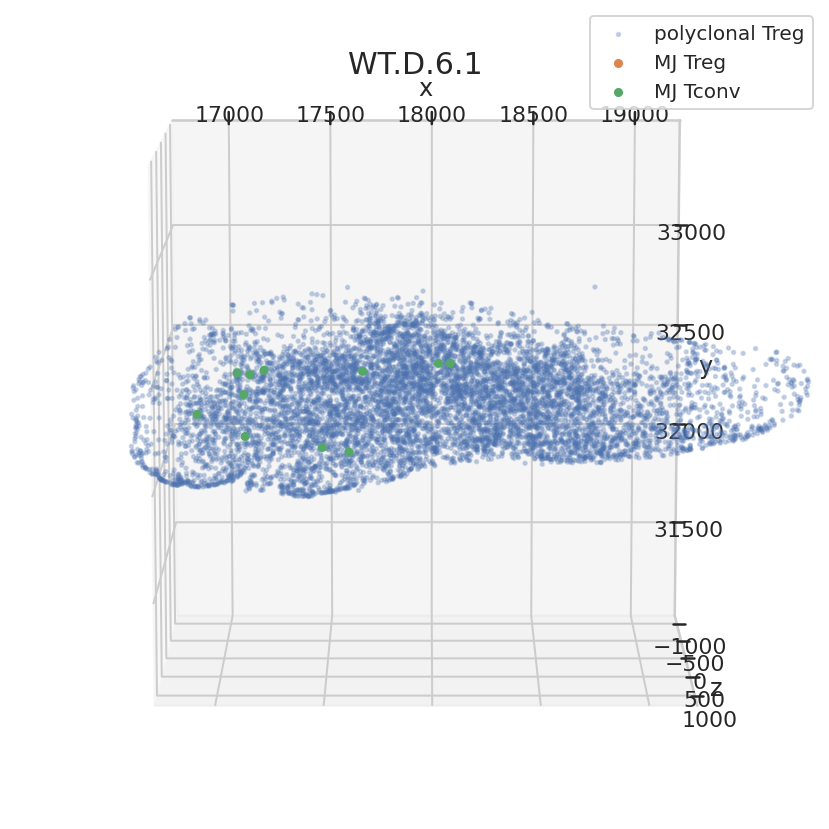

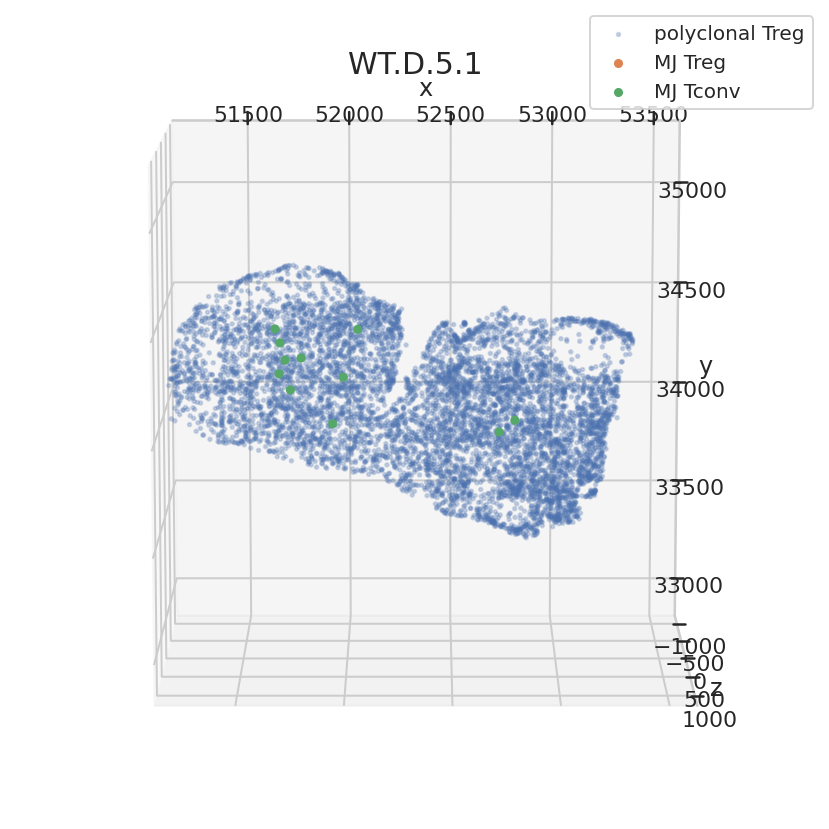

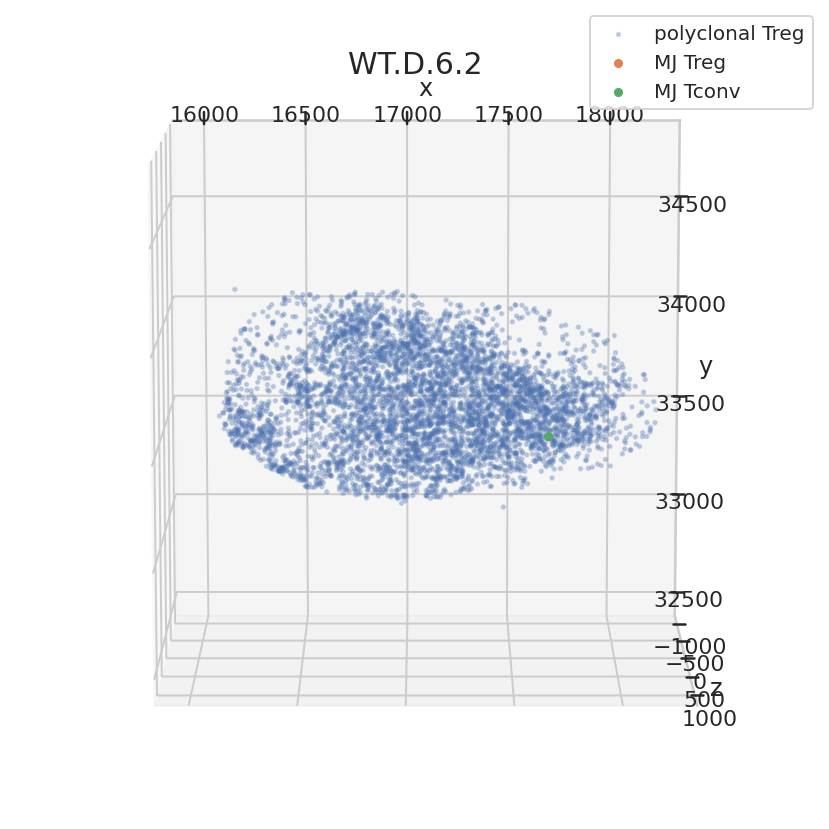

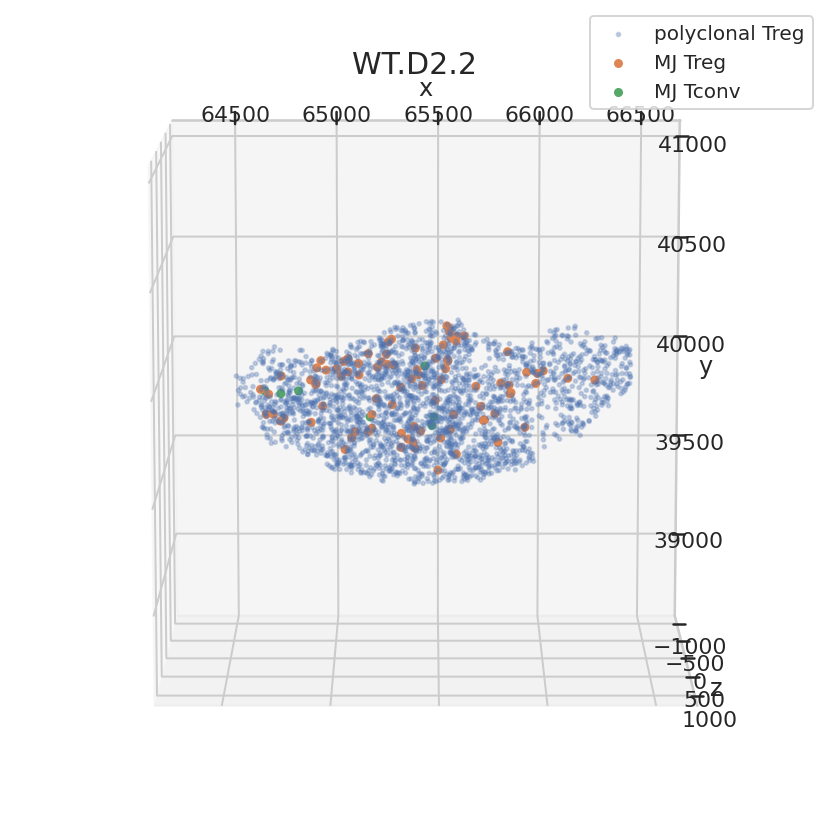

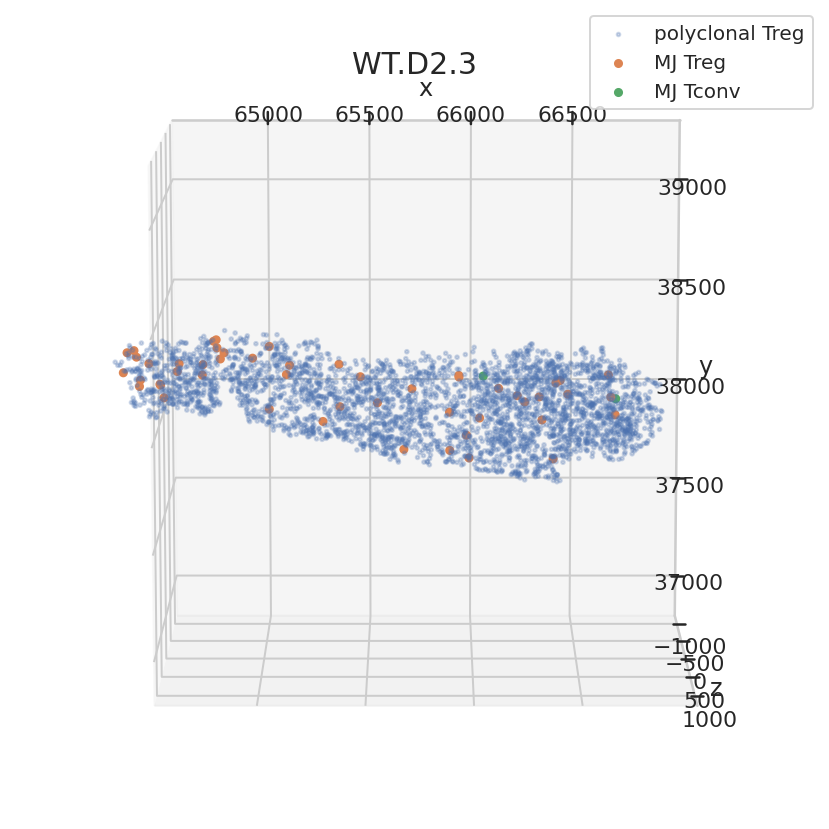

...

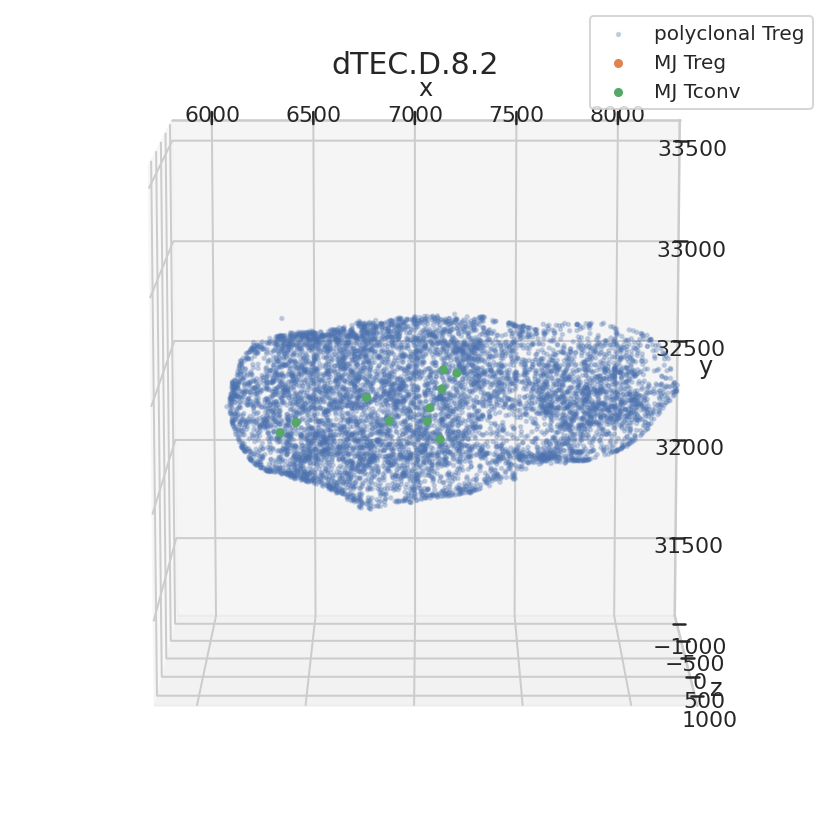

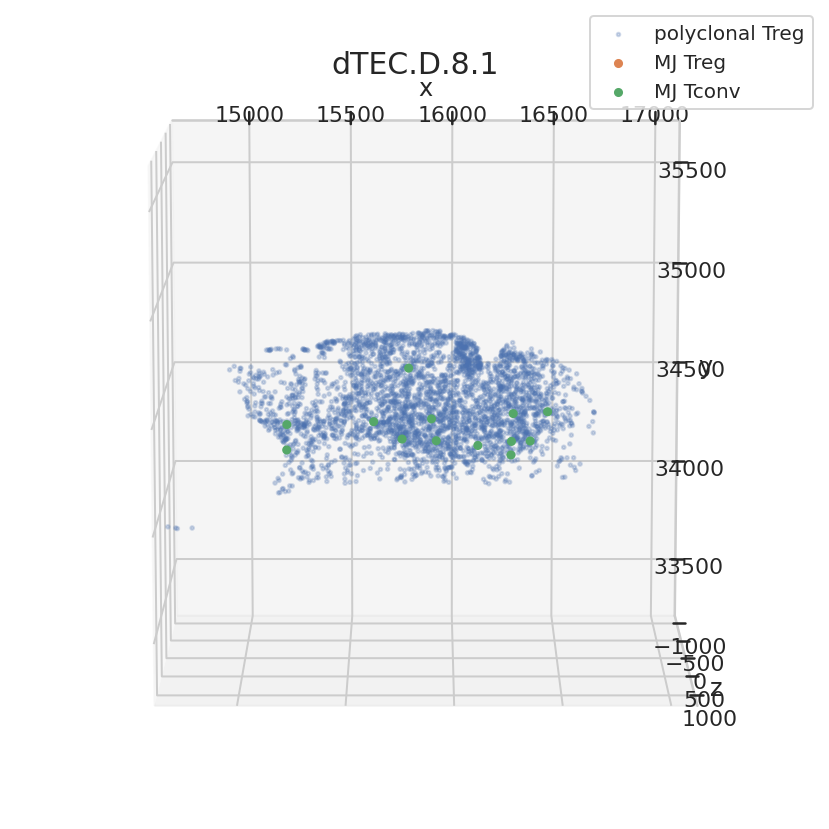

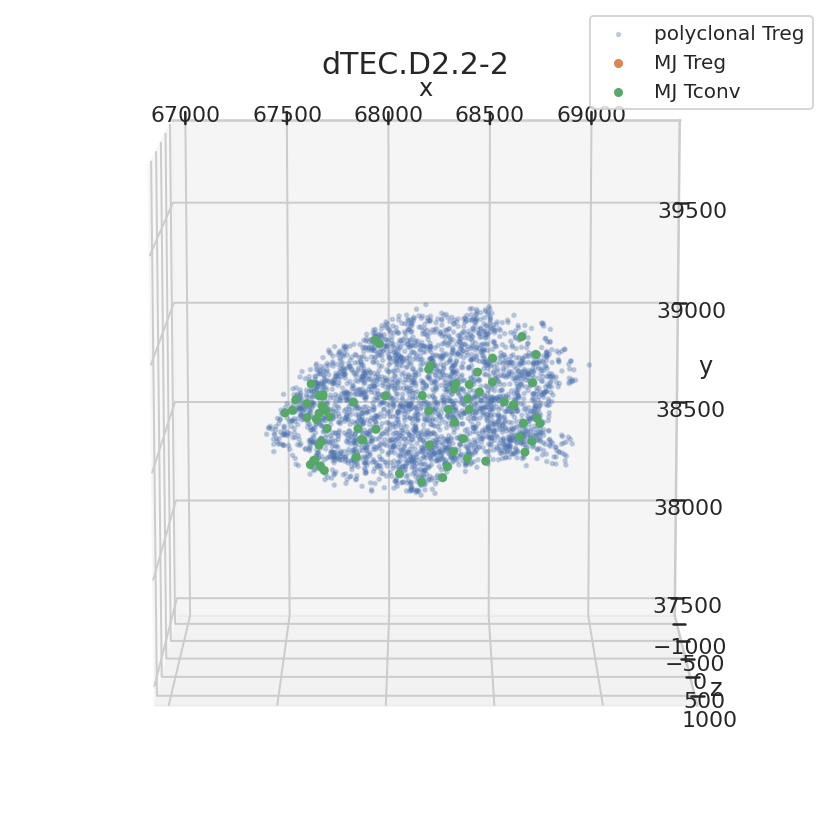

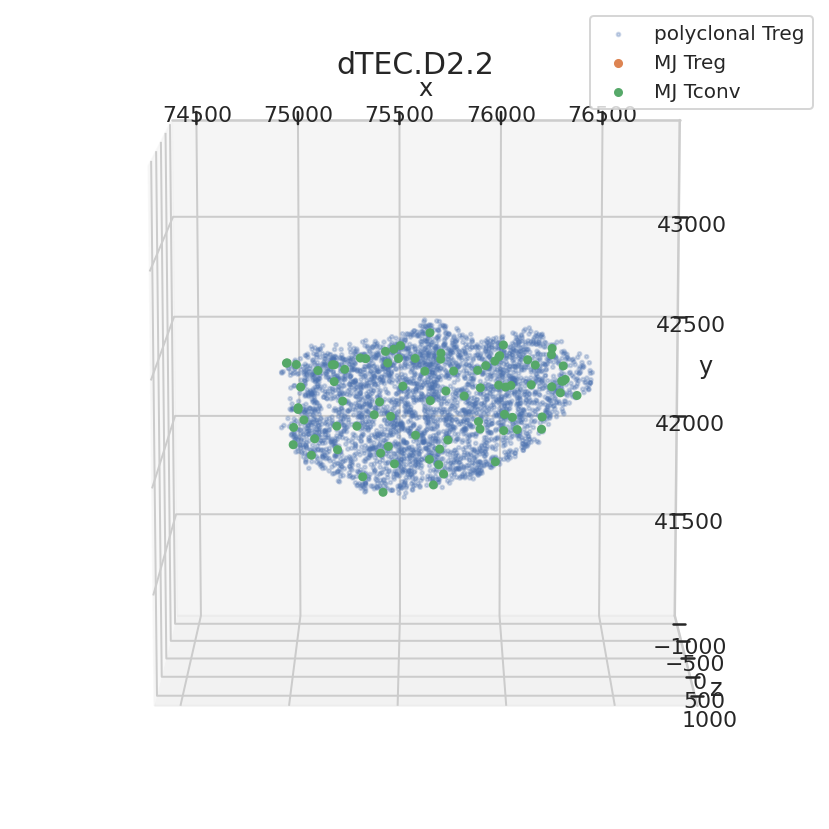

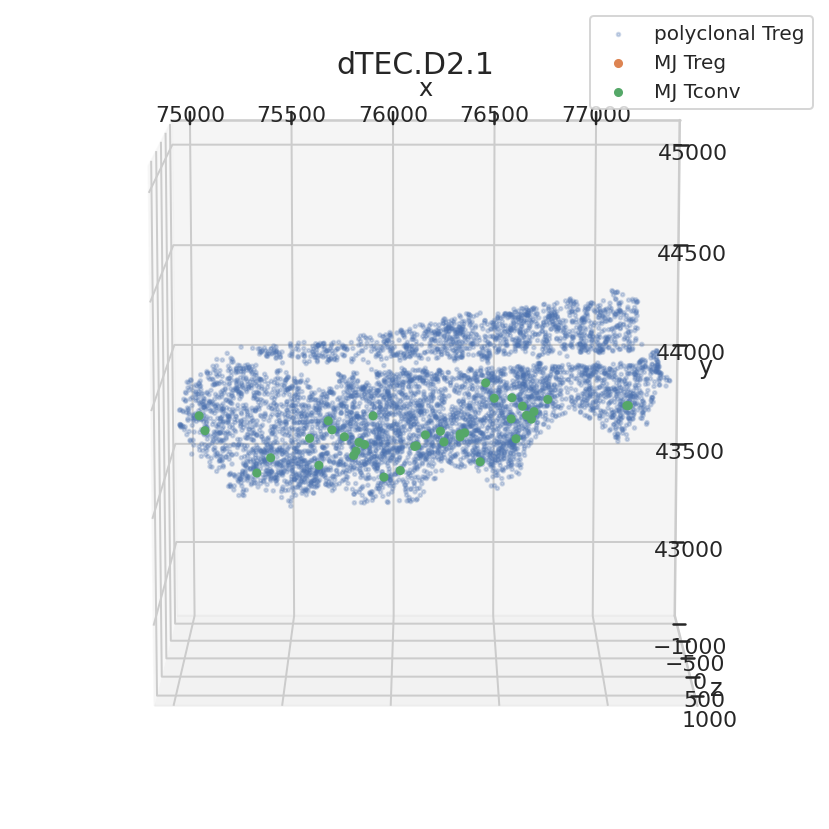

In [178]:
for s in df['sample'].unique():
    imutil.plot_LN(df, s, ['polyclonal Treg', "MJ Treg", "MJ Tconv"])


/home/nicolepagane/Dropbox (MIT)/wong/projects/external_collabs/dave/published/treg_specificity/imutil.py:112: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(xticks)
/home/nicolepagane/Dropbox (MIT)/wong/projects/external_collabs/dave/published/treg_specificity/imutil.py:114: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(yticks)
/home/nicolepagane/Dropbox (MIT)/wong/projects/external_collabs/dave/published/treg_specificity/imutil.py:112: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(xticks)
/home/nicolepagane/Dropbox (MIT)/wong/projects/external_collabs/dave/published/treg_specificity/imutil.py:114: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(yticks)
/home/nicolepagane/Dropbox (MIT)/wong/projects/external_collabs/dave/published/treg_specificity/imutil.py:112: U

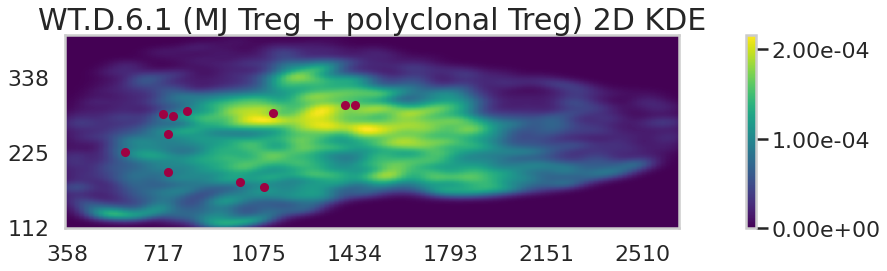

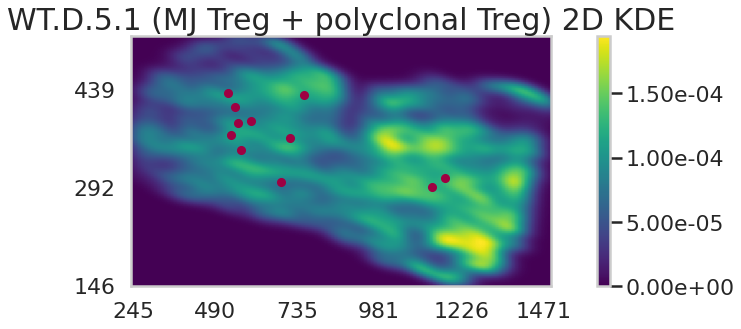

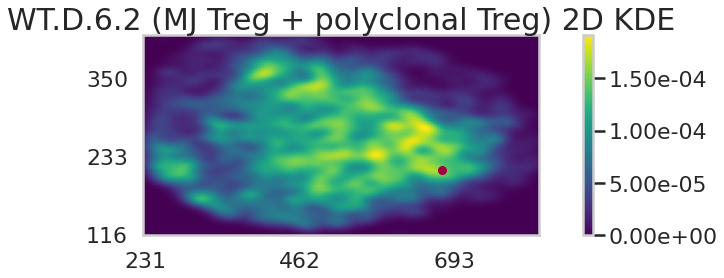

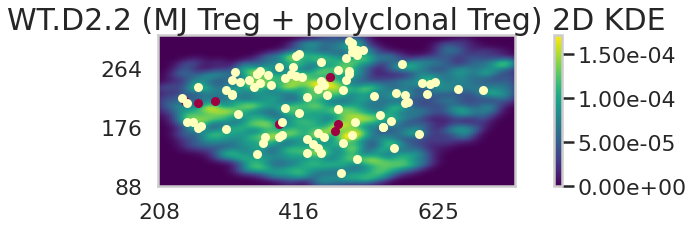

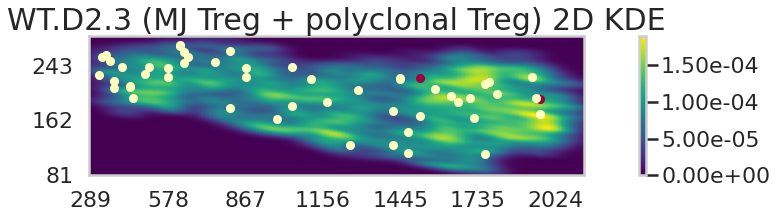

...

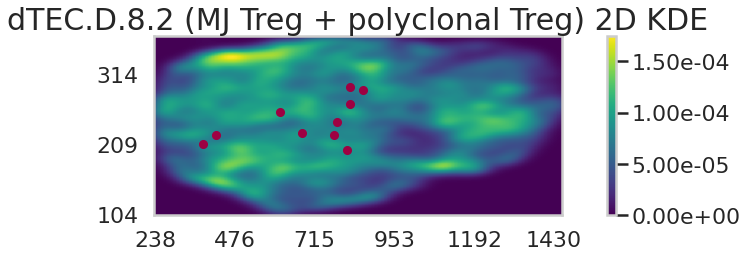

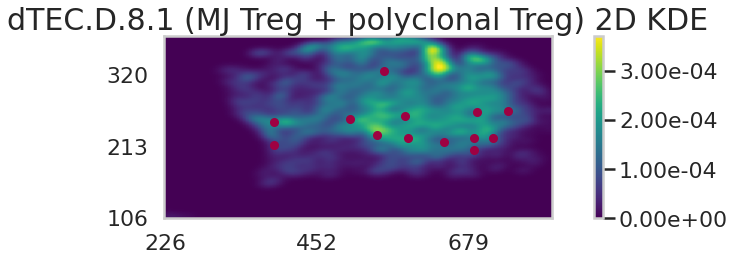

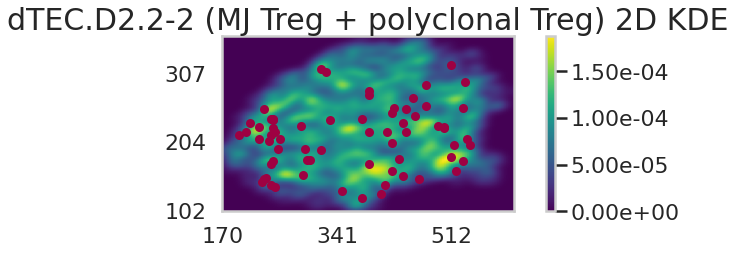

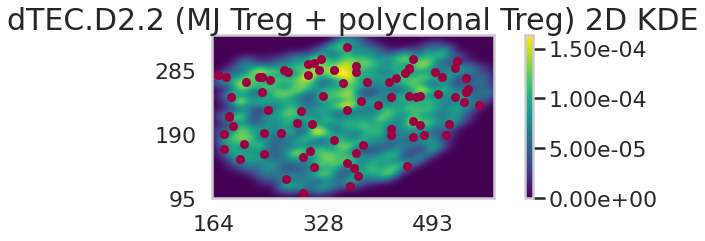

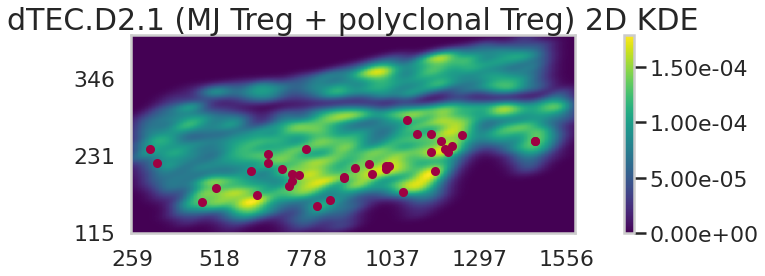

In [179]:
for s in df['sample'].unique():
    df = imutil.plot_KDE(df, s, ["MJ Treg", "polyclonal Treg"], scatter_cell_list = ["MJ Tconv", "MJ Treg"])

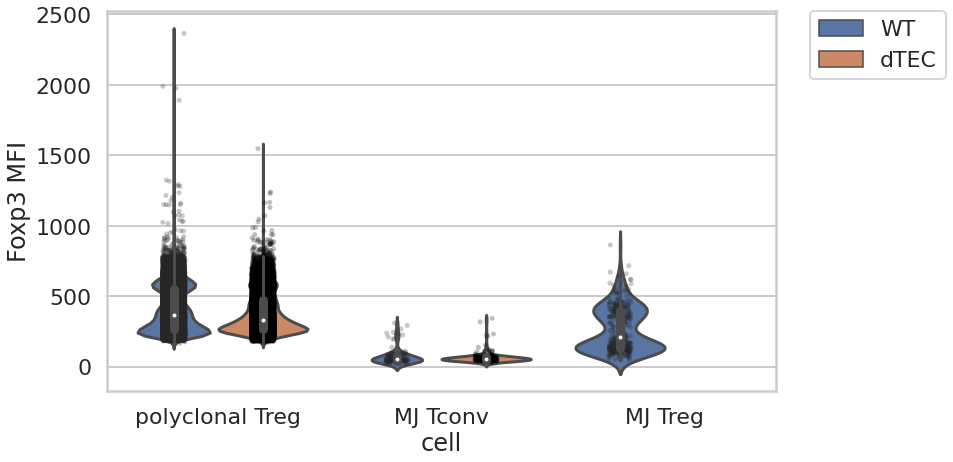

In [180]:
fig = plt.figure(figsize=(12,7))

sns.set(font_scale = 2)
sns.set_style('whitegrid')
sns.set_context('poster')


ax = sns.violinplot(data = df, x="cell", y="Foxp3 MFI", hue="treatment")
sns.stripplot(data = df, x="cell", y="Foxp3 MFI", hue="treatment", jitter=True, zorder=1, ax = ax, hue_order = ["WT","dTEC"], dodge = True, alpha = 0.25, color = "black")

handles, labels = ax.get_legend_handles_labels()


# When creating the legend, only use the first two elements
# to effectively remove the last two.
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
 
#ax.set_yscale('log')

In [181]:
print(len(df))
# normalize across MJ Tconvs
df = imutil.normalize_FI(df, Dmarkers, ["MJ Tconv"])
print(len(df))
# normalize across Tregs
df = imutil.normalize_FI(df, Dmarkers, ["polyclonal Treg", "MJ Treg"])
print(len(df))
# normalize across MJ cells
df = imutil.normalize_FI(df, Dmarkers, ["MJ Tconv", "MJ Treg"]) 
print(len(df))
# normalize across all cell types
df = imutil.normalize_FI(df, Dmarkers)
print(len(df))

63278
63211
63176
63176
63176


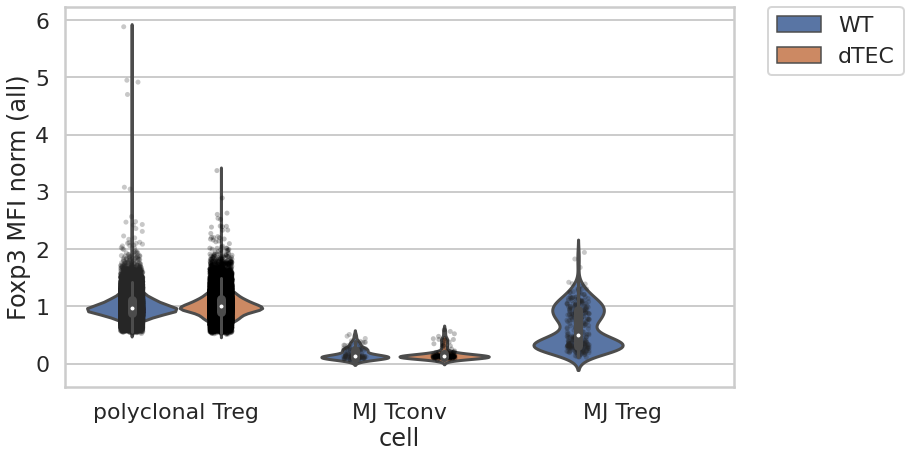

In [182]:
fig = plt.figure(figsize=(12,7))
marker = "Foxp3 MFI norm (all)"

ax = sns.violinplot(data = df, x="cell", y=marker, hue="treatment")
sns.stripplot(data = df, x="cell", y=marker, hue="treatment", jitter=True, zorder=1, ax = ax, hue_order = ["WT","dTEC"], dodge = True, alpha = 0.25, color = "black")

handles, labels = ax.get_legend_handles_labels()

#plt.yscale('log')
# When creating the legend, only use the first two elements
# to effectively remove the last two.
l = plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
 
#ax.set_yscale('log')

In [183]:
df = imutil.determine_tissue_geometry(df, ["MJ Treg", "polyclonal Treg"])

In [184]:
df = imutil.determine_local_cell_density(df, "MJ Tconv", ["MJ Treg", "polyclonal Treg"])
df = imutil.determine_local_cell_density(df, "MJ Tconv", ["MJ Treg"])

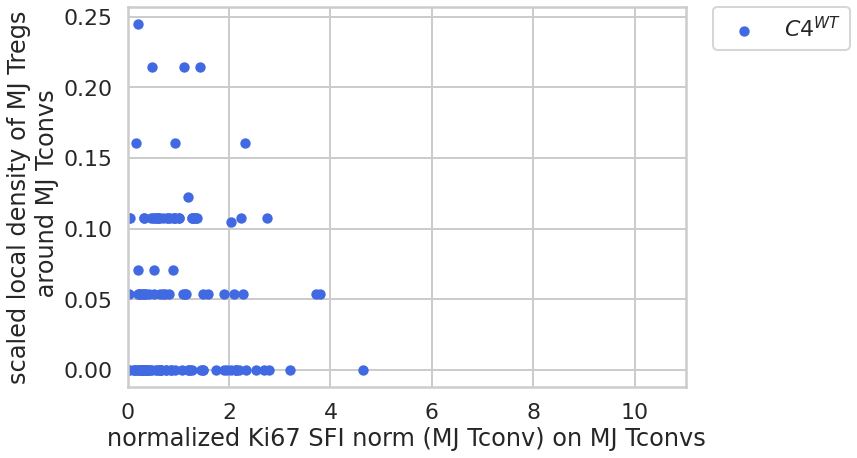

In [185]:
plt.figure(figsize=(10,7))

marker = "Ki67 SFI norm (MJ Tconv)"
plt.scatter(df.loc[df["treatment"]=="WT"][marker], df.loc[df["treatment"]=="WT"]["local MJ Treg density scaled"], c = "royalblue", label=r'$C4^{WT}$', s = 70)

#plt.ylim([0,7e-4])
plt.xlim([0,11])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("scaled local density of MJ Tregs\n" + r" around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

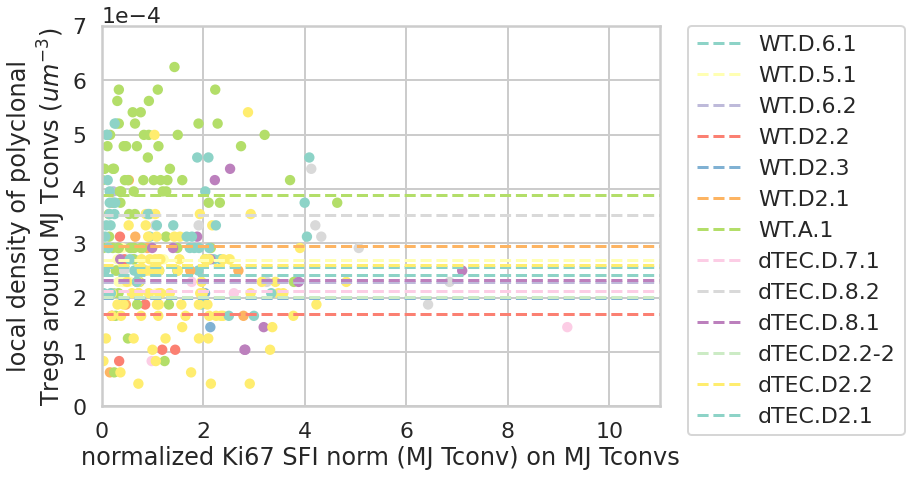

In [186]:
plt.figure(figsize=(10,7))

# make color map
color_labels = df['sample'].unique()
# List of RGB triplets
rgb_values = sns.color_palette("Set3", len(df['sample'].unique()))
# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))

marker = "Ki67 SFI norm (MJ Tconv)"
plt.scatter(df.loc[df["treatment"]=="WT",marker], df.loc[df["treatment"]=="WT","local MJ Treg + polyclonal Treg density"], c = df.loc[df["treatment"]=="WT"]['sample'].map(color_map), s = 70)
plt.scatter(df.loc[df["treatment"]=="dTEC",marker], df.loc[df["treatment"]=="dTEC","local MJ Treg + polyclonal Treg density"], c = df.loc[df["treatment"]=="dTEC"]['sample'].map(color_map),s = 70)

plt.ylim([0,7e-4])
plt.xlim([0,11])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))

for ind,n in enumerate(color_labels):
    plt.axhline(df['tissue_density'].unique()[ind], linestyle="--", c=rgb_values[ind], label = n)

#plt.axvline(2, linestyle="--", c = "grey")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("local density of polyclonal\n" + r"Tregs around MJ Tconvs ($um^{-3}$)")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/2982049149.py:18: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(sm, ticks = [0.5, 1.5])


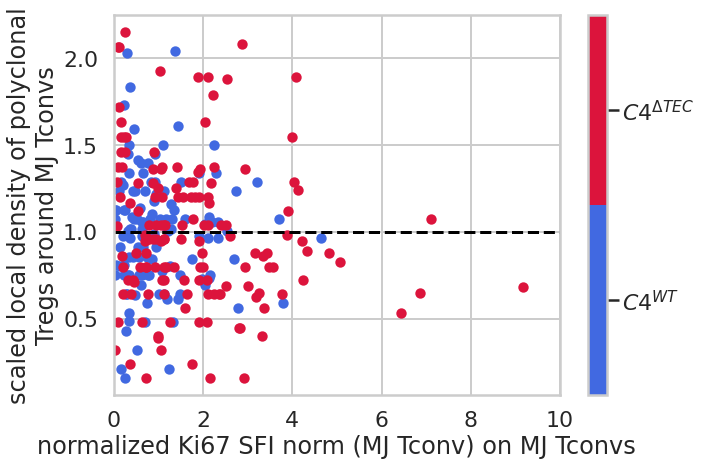

In [187]:
plt.figure(figsize=(10,7))

marker = "Ki67 SFI norm (MJ Tconv)"
plt.scatter(df.loc[df["treatment"]=="WT",marker], df.loc[df["treatment"]=="WT","local MJ Treg + polyclonal Treg density scaled"], c = "royalblue", s = 70)
plt.scatter(df.loc[df["treatment"]=="dTEC",marker], df.loc[df["treatment"]=="dTEC","local MJ Treg + polyclonal Treg density scaled"], c = "crimson",s = 70)

plt.xlim([-0.01,10])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))


plt.axhline(1, linestyle="--",c = 'black')
#plt.axvline(3, linestyle="--", c = "grey")

#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
cmap, norm = mcolors.from_levels_and_colors(range(3), ["royalblue", "crimson"])
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks = [0.5, 1.5])
cbar.ax.set_yticklabels([r'$C4^{WT}$', r'$C4^{\Delta TEC}$'])
plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/1166966568.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(label="% of MJ Tregs in local Treg population")


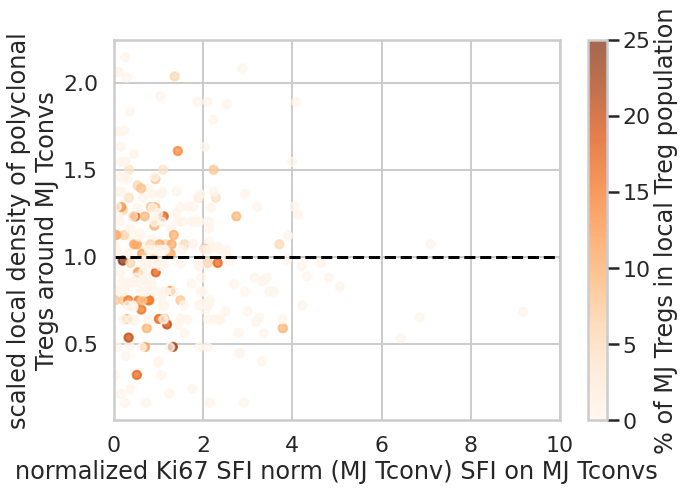

In [188]:
plt.figure(figsize=(10,7))

marker = "Ki67 SFI norm (MJ Tconv)"
plt.scatter(df[marker], df["local MJ Treg + polyclonal Treg density scaled"], c = 100*df['local MJ Treg #']/df['local MJ Treg + polyclonal Treg #'], s = 70, vmax = 25, vmin = 0, cmap = "Oranges", alpha = 0.7)
plt.colorbar(label="% of MJ Tregs in local Treg population")
plt.xlim([-0.01,10])
#plt.ylim([0,2.1])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))


plt.axhline(1, linestyle="--",c = 'black')
#plt.axvline(4, linestyle="--", c = "grey")



plt.xlabel("normalized " + marker +  " SFI on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/267216226.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(label="normalized PD-1 SFI on MJ Tconvs")


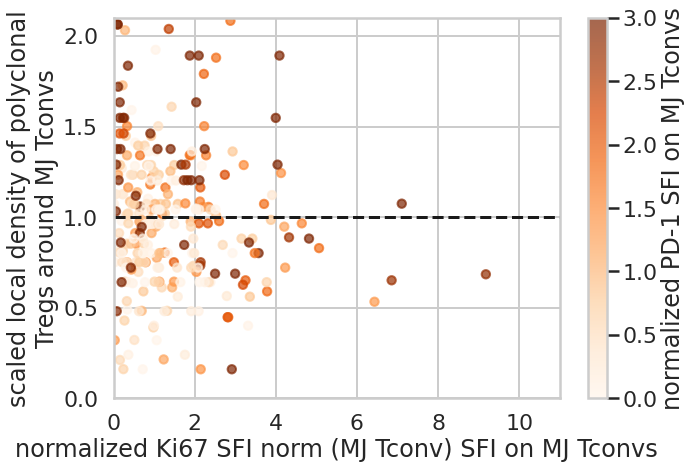

In [189]:
plt.figure(figsize=(10,7))

marker = "Ki67 SFI norm (MJ Tconv)"
plt.scatter(df[marker], df["local MJ Treg + polyclonal Treg density scaled"], c = df['PD-1 SFI norm (MJ Tconv)'], s = 70, vmax = 3, vmin = 0, cmap = "Oranges", alpha = 0.7)
plt.colorbar(label="normalized PD-1 SFI on MJ Tconvs")
plt.xlim([0,11])
plt.ylim([0,2.1])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))

plt.axhline(1, linestyle="--", label = r"$\langle$Treg density$\rangle$", c = 'k')
#plt.axvline(3, linestyle="--", c = "grey")


plt.xlabel("normalized " + marker +  " SFI on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/1568525013.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(label="normalized pSTAT5 SFI on MJ Tconvs")


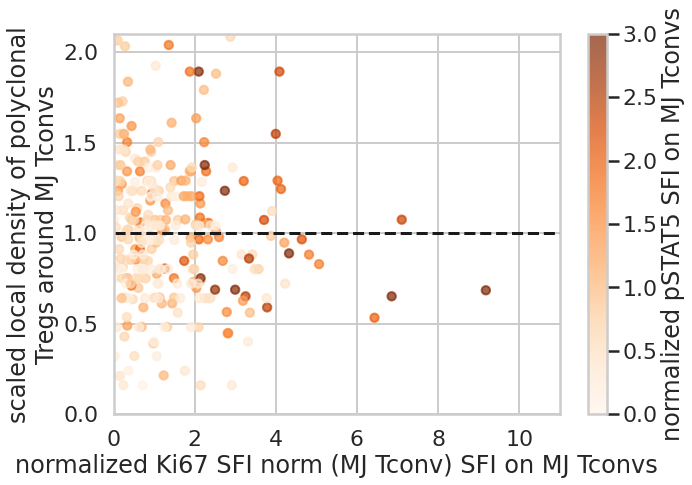

In [190]:
plt.figure(figsize=(10,7))

marker = "Ki67 SFI norm (MJ Tconv)"
plt.scatter(df[marker], df["local MJ Treg + polyclonal Treg density scaled"], c = df['pSTAT5 SFI norm (MJ Tconv)'], s = 70, vmax = 3, vmin = 0, cmap = "Oranges", alpha = 0.7)
plt.colorbar(label="normalized pSTAT5 SFI on MJ Tconvs")
plt.xlim([0,11])
plt.ylim([0,2.1])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))

plt.axhline(1, linestyle="--", label = r"$\langle$Treg density$\rangle$", c = 'k')
#plt.axvline(3, linestyle="--", c = "grey")


plt.xlabel("normalized " + marker +  " SFI on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/694100452.py:19: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(sm, ticks = [0.5, 1.5])


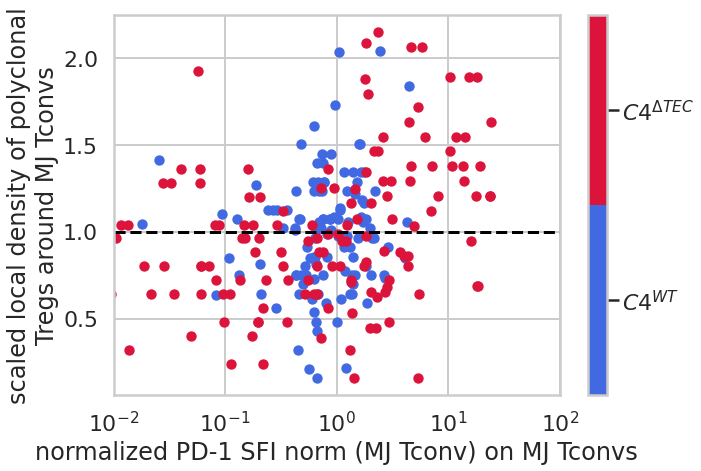

In [191]:
plt.figure(figsize=(10,7))

marker = "PD-1 SFI norm (MJ Tconv)"
plt.scatter(df.loc[df["treatment"]=="WT",marker], df.loc[df["treatment"]=="WT","local MJ Treg + polyclonal Treg density scaled"], c = "royalblue", s = 70)
plt.scatter(df.loc[df["treatment"]=="dTEC",marker], df.loc[df["treatment"]=="dTEC","local MJ Treg + polyclonal Treg density scaled"], c = "crimson",s = 70)

#plt.xlim([-0.01,10])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))


plt.axhline(1, linestyle="--",c = 'black')
#plt.axvline(3, linestyle="--", c = "grey")
plt.xlim([1e-2,100])
plt.xscale('log')
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
cmap, norm = mcolors.from_levels_and_colors(range(3), ["royalblue", "crimson"])
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks = [0.5, 1.5])
cbar.ax.set_yticklabels([r'$C4^{WT}$', r'$C4^{\Delta TEC}$'])
plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/4050410852.py:19: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(sm, ticks = [0.5, 1.5])


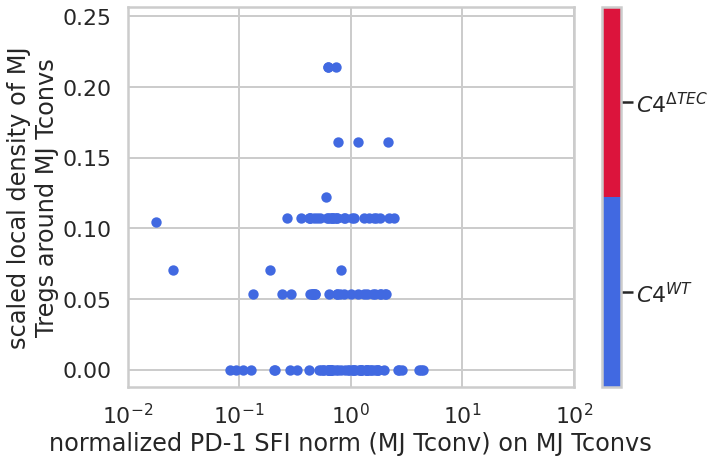

In [192]:
plt.figure(figsize=(10,7))

marker = "PD-1 SFI norm (MJ Tconv)"
plt.scatter(df.loc[df["treatment"]=="WT",marker], df.loc[df["treatment"]=="WT","local MJ Treg density scaled"], c = "royalblue", s = 70)
#plt.scatter(df.loc[df["treatment"]=="dTEC",marker], df.loc[df["treatment"]=="dTEC","local MJ Treg density scaled"], c = "crimson",s = 70)

#plt.xlim([-0.01,10])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))


#plt.axhline(1, linestyle="--",c = 'black')
#plt.axvline(3, linestyle="--", c = "grey")
plt.xlim([1e-2,100])
plt.xscale('log')
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
cmap, norm = mcolors.from_levels_and_colors(range(3), ["royalblue", "crimson"])
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks = [0.5, 1.5])
cbar.ax.set_yticklabels([r'$C4^{WT}$', r'$C4^{\Delta TEC}$'])
plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("scaled local density of MJ\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/1133364442.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(label="normalized Ki67 SFI on MJ Tconvs")


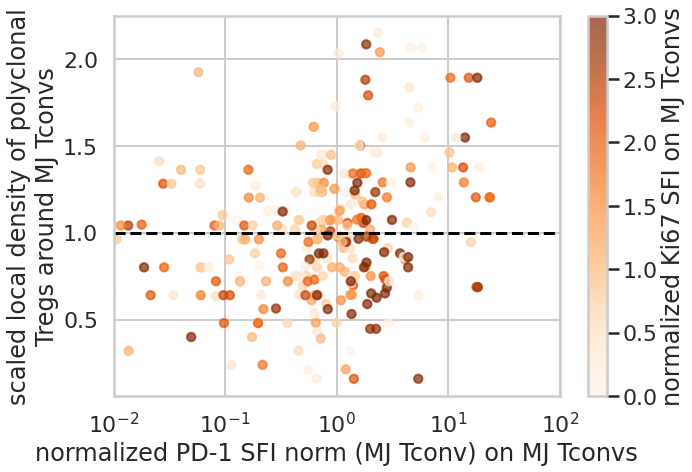

In [193]:
plt.figure(figsize=(10,7))

marker = "PD-1 SFI norm (MJ Tconv)"
plt.scatter(df[marker], df["local MJ Treg + polyclonal Treg density scaled"], c = df['Ki67 SFI norm (MJ Tconv)'], s = 70, vmax = 3, vmin = 0, cmap = "Oranges", alpha = 0.7)

plt.colorbar(label="normalized Ki67 SFI on MJ Tconvs")
#plt.xlim([-0.01,10])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))


plt.axhline(1, linestyle="--",c = 'black')
#plt.axvline(3, linestyle="--", c = "grey")
plt.xlim([1e-2,100])
plt.xscale('log')

plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/3138514999.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(label="normalized pSTAT5 SFI on MJ Tconvs")


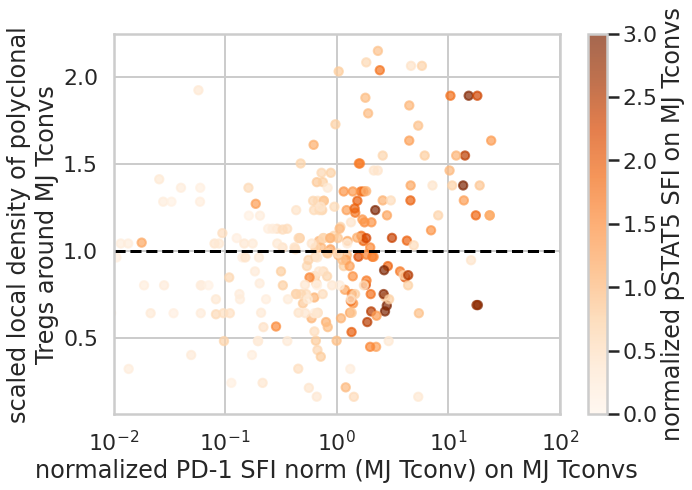

In [194]:
plt.figure(figsize=(10,7))

marker = "PD-1 SFI norm (MJ Tconv)"
plt.scatter(df[marker], df["local MJ Treg + polyclonal Treg density scaled"], c = df['pSTAT5 SFI norm (MJ Tconv)'], s = 70, vmax = 3, vmin = 0, cmap = "Oranges", alpha = 0.7)

plt.colorbar(label="normalized pSTAT5 SFI on MJ Tconvs")
#plt.xlim([-0.01,10])
plt.ticklabel_format(axis='y', style='sci', scilimits= (-2,2))


plt.axhline(1, linestyle="--",c = 'black')
#plt.axvline(3, linestyle="--", c = "grey")
plt.xlim([1e-2,100])
plt.xscale('log')

plt.xlabel("normalized " + marker +  " on MJ Tconvs")
plt.ylabel("scaled local density of polyclonal\n" + r"Tregs around MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

In [195]:
df = imutil.determine_cell_association(df, "MJ Tconv", ['MJ Treg', 'polyclonal Treg'], inverse=True)

In [196]:
df['PD-1 SFI norm (MJ Tconv + MJ Treg) log2'] = np.log2(df['PD-1 SFI norm (MJ Tconv + MJ Treg)'])
df.loc[df['PD-1 SFI norm (MJ Tconv + MJ Treg) log2']  == - np.inf, 'PD-1 SFI norm (MJ Tconv + MJ Treg) log2'] = np.min(df["PD-1 SFI norm (MJ Tconv + MJ Treg) log2"][np.isfinite(df['PD-1 SFI norm (MJ Tconv + MJ Treg) log2'])])

df['Ki67 SFI norm (MJ Tconv + MJ Treg) log2'] = np.log2(df['Ki67 SFI norm (MJ Tconv + MJ Treg)'])
df.loc[df['Ki67 SFI norm (MJ Tconv + MJ Treg) log2']  == - np.inf, 'Ki67 SFI norm (MJ Tconv + MJ Treg) log2'] = np.min(df["Ki67 SFI norm (MJ Tconv + MJ Treg) log2"][np.isfinite(df['Ki67 SFI norm (MJ Tconv + MJ Treg) log2'])])

df['pSTAT5 SFI norm (MJ Tconv + MJ Treg) log2'] = np.log2(df['pSTAT5 SFI norm (MJ Tconv + MJ Treg)'])
df.loc[df['pSTAT5 SFI norm (MJ Tconv + MJ Treg) log2']  == - np.inf, 'pSTAT5 SFI norm (MJ Tconv + MJ Treg) log2'] = np.min(df["pSTAT5 SFI norm (MJ Tconv + MJ Treg) log2"][np.isfinite(df['pSTAT5 SFI norm (MJ Tconv + MJ Treg) log2'])])


df['PD-1 MFI norm (MJ Tconv + MJ Treg) log2'] = np.log2(df['PD-1 MFI norm (MJ Tconv + MJ Treg)'])
df.loc[df['PD-1 MFI norm (MJ Tconv + MJ Treg) log2']  == - np.inf, 'PD-1 MFI norm (MJ Tconv + MJ Treg) log2'] = np.min(df["PD-1 MFI norm (MJ Tconv + MJ Treg) log2"][np.isfinite(df['PD-1 MFI norm (MJ Tconv + MJ Treg) log2'])])

df['Ki67 MFI norm (MJ Tconv + MJ Treg) log2'] = np.log2(df['Ki67 MFI norm (MJ Tconv + MJ Treg)'])
df.loc[df['Ki67 MFI norm (MJ Tconv + MJ Treg) log2']  == - np.inf, 'Ki67 MFI norm (MJ Tconv + MJ Treg) log2'] = np.min(df["Ki67 MFI norm (MJ Tconv + MJ Treg) log2"][np.isfinite(df['Ki67 MFI norm (MJ Tconv + MJ Treg) log2'])])

tempdf = df.loc[np.asarray(df['cell']=='MJ Tconv'),]# + np.asarray(df['cell']=='MJ Treg'),]
#tempdf.loc[np.asarray(tempdf['cell']=='MJ Treg') * ~np.asarray(tempdf['MJ Tconv index'].isnull()), "cell"] = "local MJ Treg"
#tempdf.loc[np.asarray(tempdf['cell']=='MJ Treg') * np.asarray(tempdf['MJ Tconv index'].isnull()), "cell"] = "distal MJ Treg"
tempdf.loc[np.asarray(tempdf['cell']=='MJ Tconv') * np.asarray(tempdf["local MJ Treg #"]>=1), "cell"] = "MJ Tconv near MJ Treg"
tempdf.loc[np.asarray(tempdf['cell']=='MJ Tconv') * np.asarray(tempdf["local MJ Treg #"]<1) * np.asarray(tempdf['treatment']=="WT"), "cell"] = "MJ Tconv NOT near MJ Treg"
#tempdf.loc[np.asarray(tempdf['cell']=='MJ Tconv') * np.asaray(tempdf['treatment']=="WT"), "cell"] = "MJ Tconv not near MJ Treg"

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [197]:
cols = ["treatment", "Ki67 SFI norm (MJ Tconv + MJ Treg)", "PD-1 SFI norm (MJ Tconv + MJ Treg)", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]

# make new dataframe with of MJ Tconvs near MJ Tregs
tempdf_mjtconv = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="MJ Tconv") * np.asarray(df['treatment']=="WT") * np.asarray(df['local MJ Treg #']>0),cols])
tempdf_mjtconv['condition'] = "WT MJ Tconvs near MJ Tregs"

# MJ Tconvs not near MJ tregs
temp = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="MJ Tconv") * np.asarray(df['treatment']=="WT")  * np.asarray(df['local MJ Treg #']==0),cols])
temp['condition'] = "WT MJ Tconvs NOT near MJ Tregs"
tempdf_mjtconv = tempdf_mjtconv.append(temp, ignore_index=True)

# dTEC MJ Tconvs
temp = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="MJ Tconv") * np.asarray(df['treatment']=="dTEC"),cols])
temp['condition'] = 'dTEC MJ Tconvs'
subsamp = np.random.randint(len(temp),size=np.sum(df['cell']=="MJ Treg"))
tempdf_mjtconv = tempdf_mjtconv.append(temp, ignore_index=True)


/tmp/ipykernel_23715/1979731428.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tempdf_mjtconv = tempdf_mjtconv.append(temp, ignore_index=True)
/tmp/ipykernel_23715/1979731428.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tempdf_mjtconv = tempdf_mjtconv.append(temp, ignore_index=True)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

WT MJ Tconvs near MJ Tregs vs. WT MJ Tconvs NOT near MJ Tregs: Mann-Whitney-Wilcoxon test two-sided, P_val:1.160e-01 U_stat=1.577e+03
WT MJ Tconvs NOT near MJ Tregs vs. dTEC MJ Tconvs: Mann-Whitney-Wilcoxon test two-sided, P_val:2.194e-01 U_stat=4.812e+03
WT MJ Tconvs near MJ Tregs vs. dTEC MJ Tconvs: Mann-Whitney-Wilcoxon test two-sided, P_val:9.131e-01 U_stat=4.749e+03


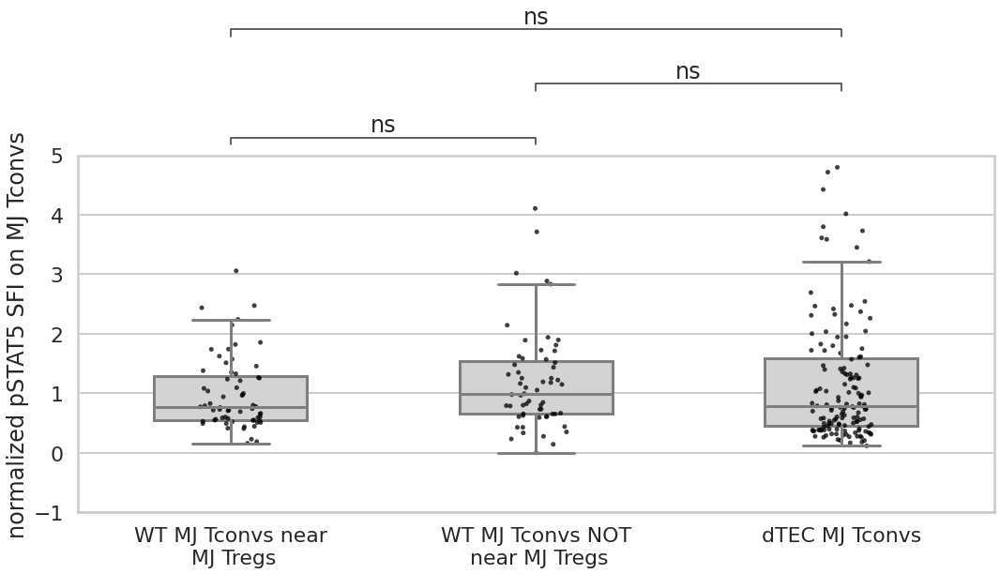

In [198]:
sns.set_context('poster')
plt.figure(figsize=(17.5,7))

temp_data = tempdf_mjtconv
x = "condition"
y = "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"
order = ('WT MJ Tconvs near MJ Tregs','WT MJ Tconvs NOT near MJ Tregs','dTEC MJ Tconvs')

#temp_data[y + ' log2'] = np.log2(temp_data[y])
#y += ' log2'

ax = sns.boxplot(data = temp_data, x=x, y=y, color = "lightgrey", showfliers = False, order = order, width=0.5)
sns.stripplot(data = temp_data, x=x, y=y, jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order = order, alpha = 0.75)
plt.ylim([-1,5])

annotator = Annotator(
    ax,
    (('WT MJ Tconvs near MJ Tregs','WT MJ Tconvs NOT near MJ Tregs'),('WT MJ Tconvs near MJ Tregs','dTEC MJ Tconvs'), 
      ('WT MJ Tconvs NOT near MJ Tregs','dTEC MJ Tconvs')),
    order = order,
    data=temp_data,
    x=x,
    y=y)

annotator.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="outside",
)
annotator.apply_test(nan_policy='omit')
annotator.annotate()
plt.xlabel('')
plt.ylabel("normalized pSTAT5 SFI on MJ Tconvs")
plt.gca().set_xticklabels(('WT MJ Tconvs near\n MJ Tregs','WT MJ Tconvs NOT\n near MJ Tregs','dTEC MJ Tconvs')
)

pass #plt.savefig("",bbox_inches='tight')

In [199]:
import scipy
# determine chi-square statistics of MJ Tconv pSTAT5 values above threshold
table = np.array([[np.sum(temp_data.loc[temp_data["treatment"]=="WT", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]>=2), 
                   np.sum(temp_data.loc[temp_data["treatment"]=="dTEC", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]>=2)], 
                   [np.sum(temp_data.loc[temp_data["treatment"]=="WT", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]<2), 
                    np.sum(temp_data.loc[temp_data["treatment"]=="dTEC", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]<2)]])
print(table)
res = scipy.stats.chi2_contingency(table)

[[ 11  27]
 [112 120]]


In [200]:
table[0][0]/np.sum(temp_data["treatment"]=="WT")

0.08943089430894309

In [201]:
table[0][1]/np.sum(temp_data["treatment"]=="dTEC")

0.1836734693877551

In [202]:
res

(4.1698038274226965,
 0.04115056399182526,
 1,
 array([[ 17.31111111,  20.68888889],
        [105.68888889, 126.31111111]]))

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

WT MJ Tconvs near MJ Tregs vs. WT MJ Tconvs NOT near MJ Tregs: Mann-Whitney-Wilcoxon test smaller, P_val:2.307e-01 U_stat=1.742e+03
WT MJ Tconvs NOT near MJ Tregs vs. dTEC MJ Tconvs: Mann-Whitney-Wilcoxon test smaller, P_val:7.124e-03 U_stat=3.388e+03
WT MJ Tconvs near MJ Tregs vs. dTEC MJ Tconvs: Mann-Whitney-Wilcoxon test smaller, P_val:2.498e-03 U_stat=3.559e+03


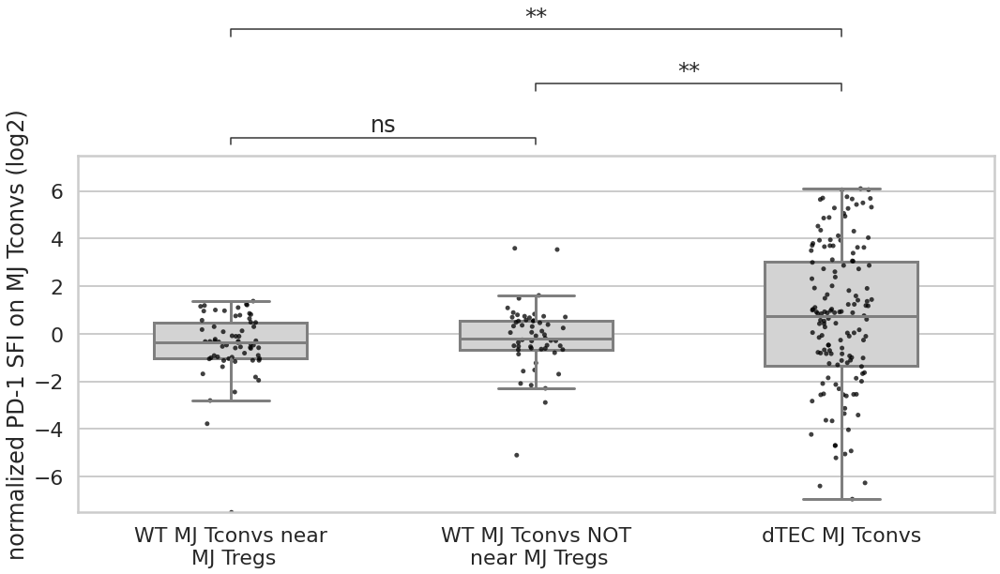

In [203]:
sns.set_context('poster')
plt.figure(figsize=(17.5,7))

temp_data = tempdf_mjtconv
x = "condition"
y = "PD-1 SFI norm (MJ Tconv + MJ Treg)"
order = ('WT MJ Tconvs near MJ Tregs','WT MJ Tconvs NOT near MJ Tregs','dTEC MJ Tconvs')

temp_data[y + ' log2'] = np.log2(temp_data[y])
y += ' log2'

ax = sns.boxplot(data = temp_data, x=x, y=y, color = "lightgrey", showfliers = False, order = order, width=0.5)
sns.stripplot(data = temp_data, x=x, y=y, jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order = order, alpha = 0.75)
plt.ylim([-7.5,7.5])

annotator = Annotator(
    ax,
    (('WT MJ Tconvs near MJ Tregs','WT MJ Tconvs NOT near MJ Tregs'),('WT MJ Tconvs near MJ Tregs','dTEC MJ Tconvs'), 
      ('WT MJ Tconvs NOT near MJ Tregs','dTEC MJ Tconvs')),
    order = order,
    data=temp_data,
    x=x,
    y=y)

annotator.configure(
    test="Mann-Whitney-ls",
    text_format="star",
    loc="outside",
)
annotator.apply_test(nan_policy='omit')
annotator.annotate()
plt.xlabel('')
plt.ylabel("normalized PD-1 SFI on MJ Tconvs (log2)")
plt.gca().set_xticklabels(('WT MJ Tconvs near\n MJ Tregs','WT MJ Tconvs NOT\n near MJ Tregs','dTEC MJ Tconvs')
)

pass #plt.savefig("",bbox_inches='tight')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

WT MJ Tconvs near MJ Tregs vs. WT MJ Tconvs NOT near MJ Tregs: Mann-Whitney-Wilcoxon test smaller, P_val:6.184e-01 U_stat=1.947e+03
WT MJ Tconvs NOT near MJ Tregs vs. dTEC MJ Tconvs: Mann-Whitney-Wilcoxon test smaller, P_val:1.065e-03 U_stat=3.148e+03
WT MJ Tconvs near MJ Tregs vs. dTEC MJ Tconvs: Mann-Whitney-Wilcoxon test smaller, P_val:4.662e-04 U_stat=3.354e+03


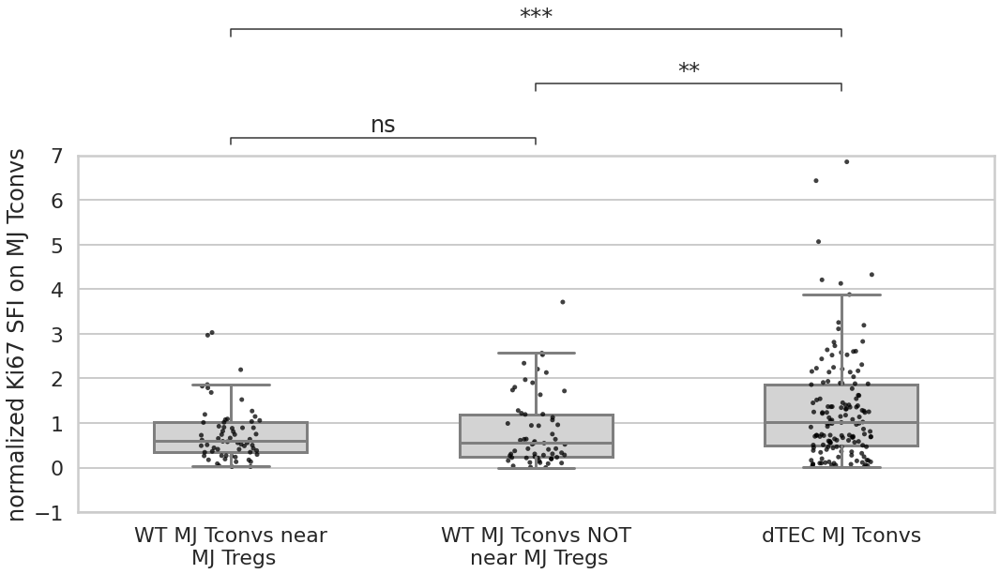

In [204]:
sns.set_context('poster')
plt.figure(figsize=(17.5,7))

temp_data = tempdf_mjtconv
x = "condition"
y = "Ki67 SFI norm (MJ Tconv + MJ Treg)"
order = ('WT MJ Tconvs near MJ Tregs','WT MJ Tconvs NOT near MJ Tregs','dTEC MJ Tconvs')

temp_data[y + ' log2'] = np.log2(temp_data[y])
#y += ' log2'

ax = sns.boxplot(data = temp_data, x=x, y=y, color = "lightgrey", showfliers = False, order = order, width=0.5)
sns.stripplot(data = temp_data, x=x, y=y, jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order = order, alpha = 0.75)
plt.ylim([-1,7])

annotator = Annotator(
    ax,
    (('WT MJ Tconvs near MJ Tregs','WT MJ Tconvs NOT near MJ Tregs'),('WT MJ Tconvs near MJ Tregs','dTEC MJ Tconvs'), 
      ('WT MJ Tconvs NOT near MJ Tregs','dTEC MJ Tconvs')),
    order = order,
    data=temp_data,
    x=x,
    y=y)

annotator.configure(
    test="Mann-Whitney-ls",
    text_format="star",
    loc="outside",
)
annotator.apply_test(nan_policy='omit')
annotator.annotate()
plt.xlabel('')
plt.ylabel("normalized Ki67 SFI on MJ Tconvs")
plt.gca().set_xticklabels(('WT MJ Tconvs near\n MJ Tregs','WT MJ Tconvs NOT\n near MJ Tregs','dTEC MJ Tconvs')
)

pass #plt.savefig("",bbox_inches='tight')

In [205]:
tconvs = df.loc[np.asarray(df['treatment']=='WT')*np.asarray(df['cell']=='MJ Tconv')]
tconvs['local MJ Treg'] = tconvs['local MJ Treg #'] > 0

/tmp/ipykernel_23715/3002627641.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tconvs['local MJ Treg'] = tconvs['local MJ Treg #'] > 0


6.764227642276423


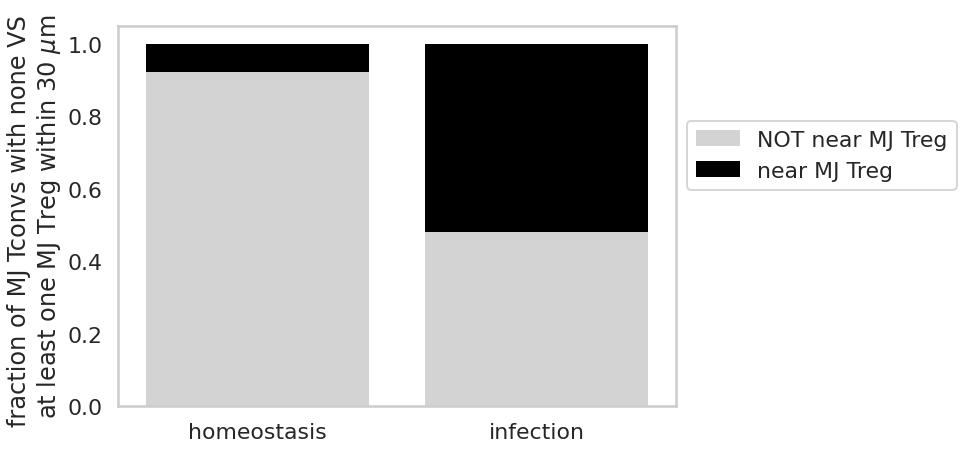

In [206]:
frac_MJ = np.sum(tconvs['local MJ Treg'])/len(tconvs['local MJ Treg'])
y_MJ = [1-frac_MJ,frac_MJ]

frac_poly = 0.07692307692307693 # this is from the homeostatic chimera 
y_poly = [1-frac_poly,frac_poly]

print(frac_MJ/frac_poly)

temp_colors = ['lightgrey', 'black']
temp_markers = ['NOT near MJ Treg', 'near MJ Treg']
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)

ax.bar(2,y_MJ[0], color=temp_colors[0], edgecolor='None')
ax.bar(1,y_poly[0], label=temp_markers[0], color=temp_colors[0], edgecolor='None')

for i in range(1,len(y_poly)):
       bottom_MJ = 0
       bottom_poly = 0
       for j in range(0,i):
              bottom_MJ += y_MJ[j]
              bottom_poly += y_poly[j]
       ax.bar(2,y_MJ[i], bottom=bottom_MJ,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None')
       ax.bar(1,y_poly[i], bottom=bottom_poly,
              color = temp_colors[i], edgecolor='None' )
       
ax.set_xlim([0.5,2.5])

ax.set_xticks([1,2])
ax.set_xticklabels(['homeostasis','infection'])
ax.set_ylabel("fraction of MJ Tconvs with none VS \n" + r"at least one MJ Treg within 30 $\mu$m")

ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)

pass #plt.savefig("",bbox_inches='tight')

In [207]:
shuffles = imutil.null_permutation_MC(df, "MJ Treg", "polyclonal Treg", ['MJ Tconv'], ["MJ Treg", "polyclonal Treg"])

In [208]:
sample_list = df.loc[df['cell']=="MJ Treg"]['sample'].unique()
sample_inds = np.zeros(len(df), dtype='bool')
for sample in sample_list: sample_inds = sample_inds + np.asarray(df['sample'] == sample)

tempinds = np.asarray(sample_inds * np.asarray(df['cell']=="MJ Tconv"))

pvalue_MJ = imutil.null_permutation_pvalue(shuffles, df.loc[tempinds,"local MJ Treg density scaled"])
print(pvalue_MJ)

0.002


/tmp/ipykernel_23715/3743004329.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmpdf['cell'][len(shuffle_plot):] =  'MJ Tconvs with\nactual MJ Tregs'


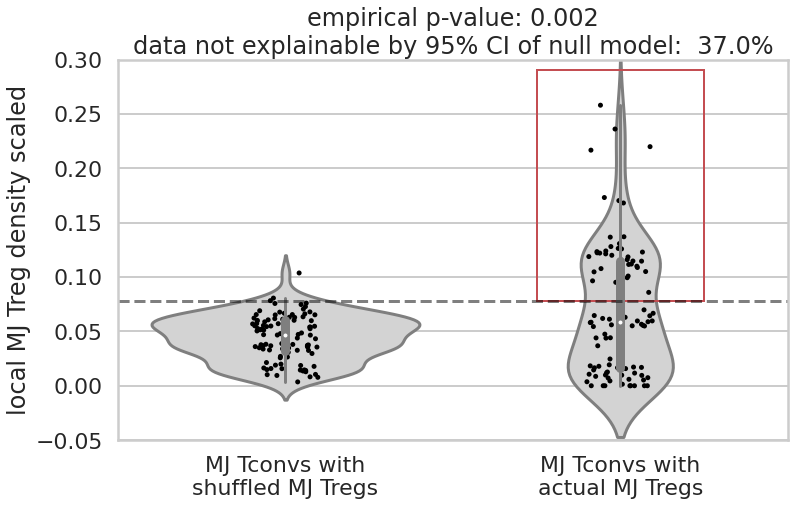

In [209]:
tmpdf = pd.DataFrame({})
sns.set_style('whitegrid')
tp = df.loc[tempinds,'local MJ Treg density scaled'] + np.random.normal(loc=5e-3, scale = 1e-2, size = np.sum(tempinds) )
tp[tp<=0] = 0
den = np.sum(tempinds)

shuffle_plot = np.mean(shuffles, axis=0)

tmpdf['local MJ Treg density scaled'] = np.hstack([shuffle_plot, tp])
tmpdf['cell'] = 'MJ Tconvs with\nshuffled MJ Tregs'
tmpdf['cell'][len(shuffle_plot):] =  'MJ Tconvs with\nactual MJ Tregs'

sns.set_context('poster')
plt.figure(figsize=(12,7))
ax = sns.violinplot(data = tmpdf, x='cell', y='local MJ Treg density scaled', color = "lightgrey")
sns.stripplot(data = tmpdf, x='cell', y='local MJ Treg density scaled', jitter=True, zorder=1, ax = ax, dodge = True, color = "black")
plt.ylim([-0.05, 0.3])

plt.axhline(np.sort(shuffle_plot)[int(0.975*len(shuffle_plot))], linestyle='--', color = 'black', alpha = 0.5)
t = np.sort(shuffle_plot)[int(0.975*len(shuffle_plot))]
rect = patches.Rectangle((0.75, t), 0.5, 0.29-t, linewidth=2, edgecolor='r', facecolor='none')
# Add the patch to the Axes
ax.add_patch(rect)


plt.title('empirical p-value: ' + str( pvalue_MJ) + '\ndata not explainable by 95% CI of null model:  ' + str( np.round(np.sum(df.loc[tempinds,'local MJ Treg density scaled'] >= np.sort(shuffle_plot)[int(0.975*len(shuffle_plot))])/den,2)*100) + '%')
plt.xlabel('')

pass #plt.savefig("",bbox_inches='tight')

In [210]:
df['explained by null model'] = ~( df.loc[tempinds,'local MJ Treg density scaled'] >= np.sort(shuffle_plot)[int(0.975*len(shuffle_plot))])
df.loc[df['explained by null model']==True,'explained by null model'] = 'explained by null model'
df.loc[df['explained by null model']==False,'explained by null model'] = 'NOT explained by null model'
df.loc[~tempinds, 'explained by null model']= np.nan

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

explained by null model v.s. NOT explained by null model: Levene test of variance with Bonferroni correction, P_val=3.615e-02 stat=4.513e+00


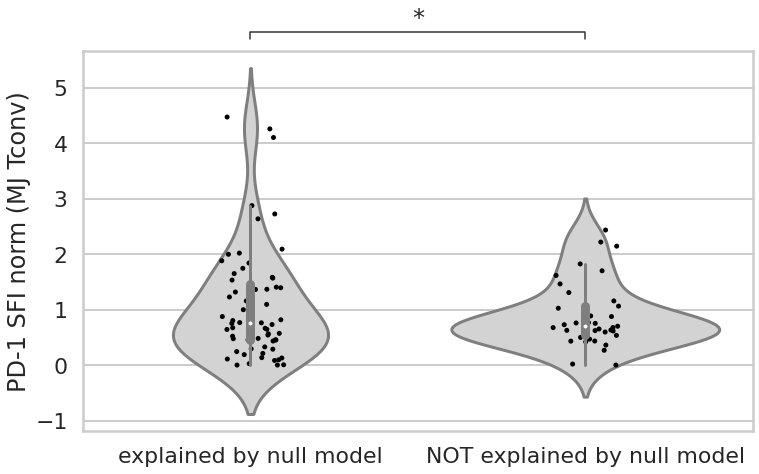

In [211]:

marker = 'PD-1 SFI norm (MJ Tconv)'
sns.set_context('poster')
plt.figure(figsize=(12,7))
ax = sns.violinplot(data = df, x='explained by null model', y=marker, color = "lightgrey")
sns.stripplot(data = df, x='explained by null model', y=marker, jitter=True, zorder=1, ax = ax, dodge = True, color = "black")

statannot.add_stat_annotation(
   ax,
   data=df,
   x = 'explained by null model',
   y=marker,
   box_pairs=[
      ('explained by null model','NOT explained by null model')
   ],
   test="Levene",
   text_format="star",
   loc="outside",
)

plt.xlabel('')

pass #plt.savefig("",bbox_inches='tight')

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

WT v.s. dTEC: Mann-Whitney-Wilcoxon test smaller with Bonferroni correction, P_val=3.498e-06 U_stat=6.070e+02


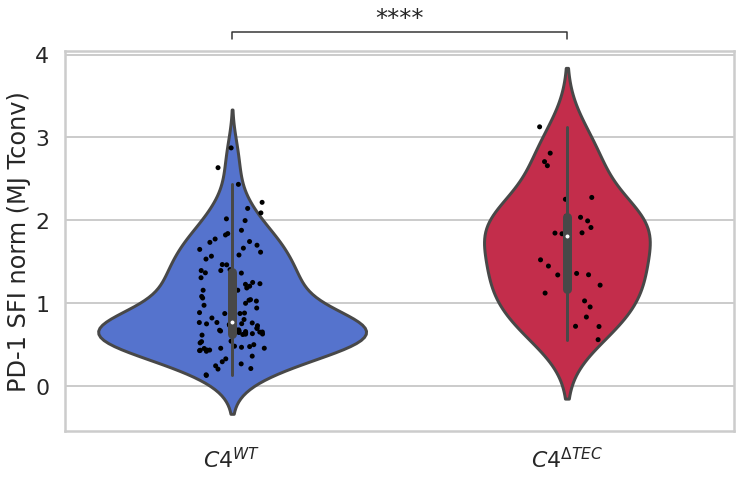

In [212]:
plt.figure(figsize=(12,7))

tempmarker = "PD-1 SFI norm (MJ Tconv)"
color_dict = {'WT': "royalblue", 'dTEC': "crimson"}

ax = sns.violinplot(data = df.loc[df['experiment']!="D2"], x="treatment", y=tempmarker, palette= color_dict)
sns.stripplot(data = df.loc[df['experiment']!="D2"], x="treatment", y=tempmarker, jitter=True, zorder=1, ax = ax, dodge = True, color = "black")


statannot.add_stat_annotation(
    ax,
    data=df.loc[df['experiment']!="D2"],
    x="treatment",
    y=tempmarker,
    box_pairs=[
        ("WT", "dTEC")
    ],
    test="Mann-Whitney-ls",
    text_format="star",
    loc="outside",
)

plt.gca().set_xticklabels([ r'$C4^{WT}$', r'$C4^{\Delta TEC}$'])
plt.xlabel('')

pass #plt.savefig("",bbox_inches='tight')

In [213]:
sns.set_context('poster')

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

WT v.s. dTEC: Mann-Whitney-Wilcoxon test smaller with Bonferroni correction, P_val=6.290e-14 U_stat=2.035e+04


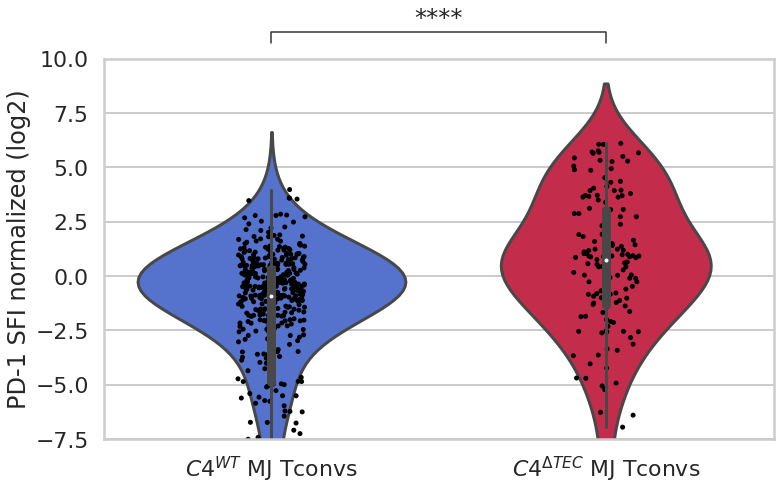

In [214]:
plt.figure(figsize=(12,7))
#sns.set_style("whitegrid")

tempmarker = 'PD-1 SFI norm (MJ Tconv + MJ Treg) log2'
color_dict = {'WT': "royalblue", 'dTEC': "crimson"}

ax = sns.violinplot(data = df, x="treatment", y=tempmarker, palette=color_dict)
sns.stripplot(data = df, x="treatment", y=tempmarker, jitter=True, zorder=1, ax = ax, dodge = True, color = "black")


statannot.add_stat_annotation(
    ax,
    data=df,
    x="treatment",
    y=tempmarker,
    box_pairs=[
        ("WT", "dTEC")
    ],
    test="Mann-Whitney-ls",
    text_format="star",
    loc="outside",
)
plt.ylim([-7.5, 10])
plt.ylabel( "PD-1 SFI normalized (log2)")
plt.gca().set_xticklabels([ r'$C4^{WT}$ MJ Tconvs', r'$C4^{\Delta TEC}$ MJ Tconvs'])
plt.xlabel('')

pass #plt.savefig("",bbox_inches='tight')

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

WT v.s. dTEC: Mann-Whitney-Wilcoxon test smaller with Bonferroni correction, P_val=1.146e-02 U_stat=2.993e+04


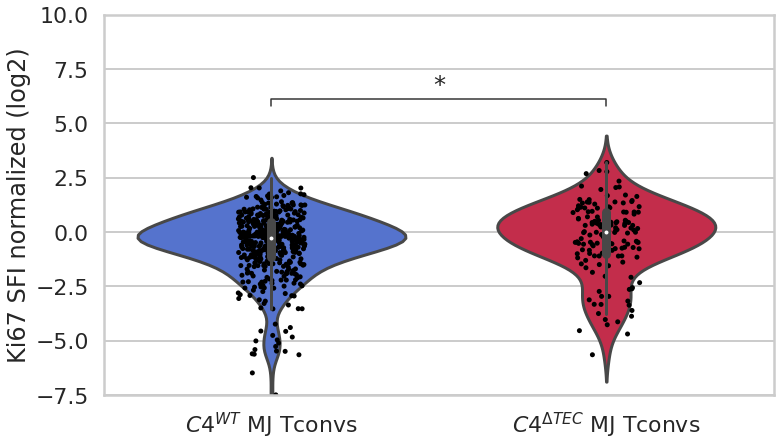

In [215]:
plt.figure(figsize=(12,7))

tempmarker = 'Ki67 SFI norm (MJ Tconv + MJ Treg) log2'
color_dict = {'WT': "royalblue", 'dTEC': "crimson"}

ax = sns.violinplot(data = df, x="treatment", y=tempmarker, palette=color_dict)
sns.stripplot(data = df, x="treatment", y=tempmarker, jitter=True, zorder=1, ax = ax, dodge = True, color = "black")


statannot.add_stat_annotation(
    ax,
    data=df,
    x="treatment",
    y=tempmarker,
    box_pairs=[
        ("WT", "dTEC")
    ],
    test="Mann-Whitney-ls",
    text_format="star",
    loc="outside",
)
plt.ylim([-7.5, 10])
plt.ylabel( "Ki67 SFI normalized (log2)")

plt.gca().set_xticklabels([ r'$C4^{WT}$ MJ Tconvs', r'$C4^{\Delta TEC}$ MJ Tconvs'])
plt.xlabel('')

pass #plt.savefig("",bbox_inches='tight')

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

WT v.s. dTEC: Mann-Whitney-Wilcoxon test smaller with Bonferroni correction, P_val=5.319e-07 U_stat=5.922e+03


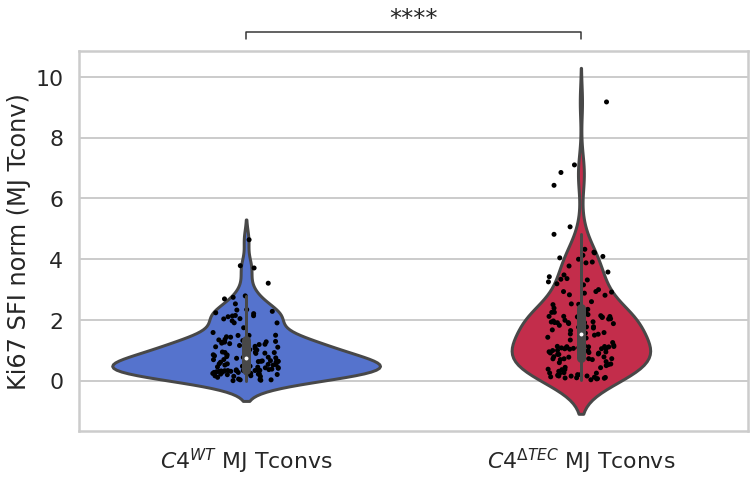

In [216]:
plt.figure(figsize=(12,7))


tempmarker = "Ki67 SFI norm (MJ Tconv)"
color_dict = {'WT': "royalblue", 'dTEC': "crimson"}

ax = sns.violinplot(data = df, x="treatment", y=tempmarker, palette=color_dict)
sns.stripplot(data = df, x="treatment", y=tempmarker, jitter=True, zorder=1, ax = ax, dodge = True, color = "black")


statannot.add_stat_annotation(
    ax,
    data=df,
    x="treatment",
    y=tempmarker,
    box_pairs=[
        ("WT", "dTEC")
    ],
    test="Mann-Whitney-ls",
    text_format="star",
    loc="outside",
)

plt.gca().set_xticklabels([ r'$C4^{WT}$ MJ Tconvs', r'$C4^{\Delta TEC}$ MJ Tconvs'])
plt.xlabel('')
plt.ylabel(tempmarker)

pass #plt.savefig("",bbox_inches='tight')

In [217]:
# percentage of MJ Tregs in polyclonal Treg population
100*np.sum( np.asarray(df['cell']=="MJ Treg") )/np.sum(np.asarray(df['treatment']=="WT") * (np.asarray(df['cell']=="polyclonal Treg") + np.asarray(df['cell']=="MJ Treg") ))

0.9383488352950861

In [218]:
# mean percentage of MJ Tregs within 30um of MJ Tconv
np.mean(df.loc[df['treatment']=="WT",'local MJ Treg density scaled'])*100

4.960071039889616

In [219]:
tempdf_tconv = df.loc[df['cell']=="MJ Tconv"]
# percentage of wt mj tconvs that are around at least 1 mj treg
100*len(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']=="WT") * np.asarray(tempdf_tconv['local MJ Treg #']>0)])/np.sum(np.asarray(tempdf_tconv['treatment']=="WT"))

52.03252032520325

In [220]:
# percentage of dtec mj tconvs with norm pstat5 sfi above 2
np.sum(tempdf_tconv.loc[tempdf_tconv['treatment']=="dTEC", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]>2)/np.sum(tempdf_tconv['treatment']=="dTEC")*100

18.367346938775512

In [221]:
# percentage of wt mj tconvs with norm pstat5 sfi above 2
np.sum(tempdf_tconv.loc[tempdf_tconv['treatment']=="WT", "pSTAT5 SFI norm (MJ Tconv + MJ Treg)"]>2)/np.sum(tempdf_tconv['treatment']=="WT")*100

8.94308943089431

In [222]:
# 90th percentile mj tconv pd-1 sfi divided by 10th percentile mj tconv pd-1 sfi 
np.percentile(tempdf_tconv.loc[tempdf_tconv['treatment']=="WT", "PD-1 SFI norm (MJ Tconv)"], 90)/np.percentile(tempdf_tconv.loc[tempdf_tconv['treatment']=="WT", "PD-1 SFI norm (MJ Tconv)"], 10)

9.1249130776307

In [223]:
# 90th percentile mj tconv ki67 sfi divided by 10th percentile mj tconv ki67 sfi 
np.percentile(tempdf_tconv.loc[tempdf_tconv['treatment']=="WT", "Ki67 SFI norm (MJ Tconv)"], 90)/np.percentile(tempdf_tconv.loc[tempdf_tconv['treatment']=="WT", "Ki67 SFI norm (MJ Tconv)"], 10)

10.654644987284598

In [224]:
# std of percentage of MJ Tregs within 30um of MJ Tconv
np.std(df.loc[df['treatment']=="WT",'local MJ Treg density scaled'])*100

5.739670872982199

In [225]:
temp_markers = ["Ki67 SFI norm (all)", "PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)", 
                "Ki67 SFI norm (MJ Tconv)", "PD-1 SFI norm (MJ Tconv)", "pSTAT5 SFI norm (MJ Tconv)", 
                "Ki67 SFI norm (polyclonal Treg + MJ Treg)", "PD-1 SFI norm (polyclonal Treg + MJ Treg)", "pSTAT5 SFI norm (polyclonal Treg + MJ Treg)", 
                "local MJ Treg + polyclonal Treg density scaled", "local MJ Treg #", 
                ]

df = imutil.set_associated_cell_markers(df, "MJ Tconv", ["MJ Treg", "polyclonal Treg"], temp_markers, inverse=True)

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)


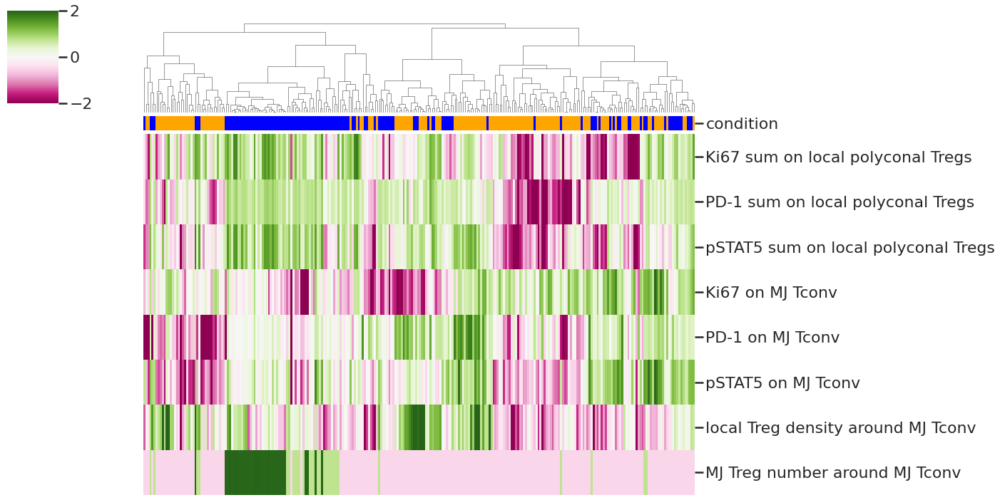

In [226]:
# insetad of this look at local tregs for all tconvs in this cluster
calc = 'sum'

row_order = ['MJ Tconv inverse ' +calc + ' Ki67 SFI norm (polyclonal Treg + MJ Treg)', 'MJ Tconv inverse ' +calc + ' PD-1 SFI norm (polyclonal Treg + MJ Treg)', 'MJ Tconv inverse ' +calc + ' pSTAT5 SFI norm (polyclonal Treg + MJ Treg)',  "Ki67 SFI norm (MJ Tconv)","PD-1 SFI norm (MJ Tconv)", "pSTAT5 SFI norm (MJ Tconv)", "local MJ Treg + polyclonal Treg density scaled", "local MJ Treg #"]

row_names = ["Ki67 " +calc + " on local polyconal Tregs", "PD-1 " + calc + " on local polyconal Tregs", "pSTAT5 "+ calc + " on local polyconal Tregs",  "Ki67 on MJ Tconv","PD-1 on MJ Tconv", "pSTAT5 on MJ Tconv",  "local Treg density around MJ Tconv", "MJ Treg number around MJ Tconv"]
tempdf_tconv = df.loc[df['cell']=="MJ Tconv", row_order]

tempdf_tconv_log2 = np.log2(tempdf_tconv)#/np.mean(tempdf)
nanmin1 = np.min(tempdf_tconv_log2["PD-1 SFI norm (MJ Tconv)"][np.isfinite(tempdf_tconv_log2["PD-1 SFI norm (MJ Tconv)"])])
nanmin2 = np.min(tempdf_tconv_log2['MJ Tconv inverse ' +calc + ' PD-1 SFI norm (polyclonal Treg + MJ Treg)'][np.isfinite(tempdf_tconv_log2['MJ Tconv inverse ' +calc + ' PD-1 SFI norm (polyclonal Treg + MJ Treg)'])])
tempdf_tconv_log2.loc[tempdf_tconv_log2["PD-1 SFI norm (MJ Tconv)"] == -np.inf, "PD-1 SFI norm (MJ Tconv)"] = nanmin1
tempdf_tconv_log2.loc[tempdf_tconv_log2['MJ Tconv inverse ' +calc + ' PD-1 SFI norm (polyclonal Treg + MJ Treg)'] == -np.inf, 'MJ Tconv inverse ' +calc + ' PD-1 SFI norm (polyclonal Treg + MJ Treg)'] = nanmin2
tempdf_tconv_log2 = tempdf_tconv_log2/(np.max(tempdf_tconv_log2)-np.min(tempdf_tconv_log2))
tempdf_tconv_log2["local MJ Treg #"] = tempdf_tconv["local MJ Treg #"]
tempdf_tconv_log2["local MJ Treg + polyclonal Treg density scaled"] = tempdf_tconv["local MJ Treg + polyclonal Treg density scaled"]

tempdf_tconv_log2.index = np.arange(len(tempdf_tconv_log2))

color_dict={"WT": "blue", "dTEC": "orange", "MJ Treg": "black", "Treg": "white"}
target_df = pd.DataFrame({"condition": df.loc[df['cell']=="MJ Tconv", "treatment"]})#, "MJ Treg": df.loc[df['cell']=="MJ Tconv"].loc[cluster==ck, "cell"]})
target_df.index = tempdf_tconv_log2.index
target_df['condition'] = target_df.condition.map(color_dict)
#target_df['MJ Treg'] = target_df["MJ Treg"].map(color_dict)

g = sns.clustermap(np.transpose(tempdf_tconv_log2), metric="correlation",z_score=0,xticklabels=False, cmap = "PiYG", vmax=2, vmin = -2, method='average',
                figsize = (20,10), row_cluster=False,col_colors = target_df, yticklabels = row_names)

#plt.savefig("figs/forDave/forDave/TregPhenotypesSummed_TconvsClustered.pdf",bbox_inches='tight')

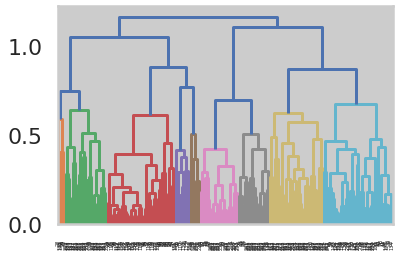

In [227]:
# run g = clustermap with log2 transform above
import scipy
g
den = scipy.cluster.hierarchy.dendrogram(g.dendrogram_col.linkage,
                                         labels = tempdf_tconv_log2.index,
                                         color_threshold=0.68)  
from collections import defaultdict

def get_cluster_classes(den, label='ivl', max_cluster = 10):
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - int(int(max_cluster)/2)) / int(max_cluster)
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    cluster_classes = {}
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes

clusters = get_cluster_classes(den)

cluster = []
for i in tempdf_tconv_log2.index:
    included=False
    for j in clusters.keys():
        if i in clusters[j]:
            cluster.append(j)
            included=True
    if not included:
        cluster.append(None)


In [228]:
cluster = np.array(cluster)
clus_tconv = np.array(["cluster"]*len(cluster))

clus_tconv[cluster == "C1"] = "BA"
clus_tconv[cluster == "C2"] = "BA"
clus_tconv[cluster == "C3"] = "S1"
clus_tconv[cluster == "C4"] = "S1"
clus_tconv[cluster == "C5"] = "S1"
clus_tconv[cluster == "C6"] = "S3"
clus_tconv[cluster == "C7"] = "A1"
clus_tconv[cluster == "C8"] = "BA"
clus_tconv[cluster == "C9"] = "A2"
#clus_tconv[cluster == "C10"] = "S2"



#rename S to C
#clus_tconv[clus_tconv=='S2'] = 'C2'
clus_tconv[clus_tconv=='S1'] = 'C1'
clus_tconv[clus_tconv=='S3'] = 'C2/C3'


In [229]:
tempdf_tcon = pd.DataFrame.copy(tempdf_tconv_log2)
tempdf_tcon['cluster'] = clus_tconv
tempdf_tcon['treatment'] = np.asarray(df.loc[df['cell']=="MJ Tconv", "treatment"])

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


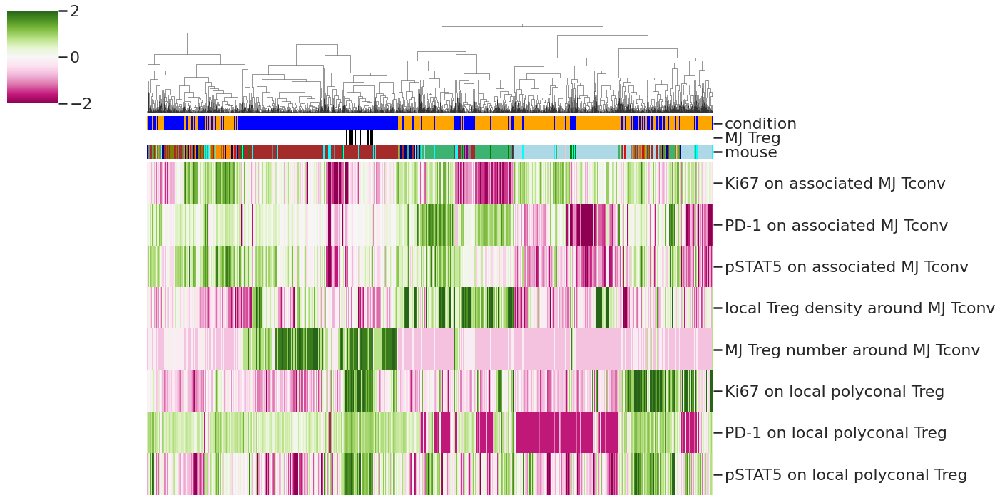

In [230]:
row_order = ["MJ Tconv Ki67 SFI norm (MJ Tconv)","MJ Tconv PD-1 SFI norm (MJ Tconv)", "MJ Tconv pSTAT5 SFI norm (MJ Tconv)", "MJ Tconv local MJ Treg + polyclonal Treg density scaled", "MJ Tconv local MJ Treg #", "Ki67 SFI norm (polyclonal Treg + MJ Treg)", "PD-1 SFI norm (polyclonal Treg + MJ Treg)", "pSTAT5 SFI norm (polyclonal Treg + MJ Treg)"]

row_names = ["Ki67 on associated MJ Tconv","PD-1 on associated MJ Tconv", "pSTAT5 on associated MJ Tconv",  "local Treg density around MJ Tconv", "MJ Treg number around MJ Tconv", "Ki67 on local polyconal Treg", "PD-1 on local polyconal Treg", "pSTAT5 on local polyconal Treg",]

tempdf_treg = df.loc[~df['MJ Tconv index'].isnull(), row_order]

tempdf_treg_log2 = np.log2(tempdf_treg)#/np.mean(tempdf)
nanmin1 = np.min(tempdf_treg_log2["PD-1 SFI norm (polyclonal Treg + MJ Treg)"][np.isfinite(tempdf_treg_log2["PD-1 SFI norm (polyclonal Treg + MJ Treg)"])])
nanmin2 = np.min(tempdf_treg_log2["MJ Tconv PD-1 SFI norm (MJ Tconv)"][np.isfinite(tempdf_treg_log2["MJ Tconv PD-1 SFI norm (MJ Tconv)"])])
tempdf_treg_log2.loc[tempdf_treg_log2["PD-1 SFI norm (polyclonal Treg + MJ Treg)"] == -np.inf, "PD-1 SFI norm (polyclonal Treg + MJ Treg)"] = nanmin1
tempdf_treg_log2.loc[tempdf_treg_log2["MJ Tconv PD-1 SFI norm (MJ Tconv)"] == -np.inf, "MJ Tconv PD-1 SFI norm (MJ Tconv)"] = nanmin2
#tempdf_treg_log2 = tempdf_treg_log2/(np.max(tempdf_treg_log2)-np.min(tempdf_treg_log2))
tempdf_treg_log2["MJ Tconv local MJ Treg #"] = tempdf_treg["MJ Tconv local MJ Treg #"]
tempdf_treg_log2.loc[df.loc[~df['MJ Tconv index'].isnull(),'treatment']=="dTEC", "MJ Tconv local MJ Treg #"]  = -0.5
tempdf_treg_log2["MJ Tconv local MJ Treg + polyclonal Treg density scaled"] = tempdf_treg["MJ Tconv local MJ Treg + polyclonal Treg density scaled"]

tempdf_treg_log2.index = np.arange(len(tempdf_treg_log2))


color_dict={"WT": "blue", "dTEC": "orange", "MJ Treg": "black", "Treg": "white", 
            'WT.D.6.1':"grey", 'WT.D.5.1':"olive", 'WT.D.6.2':"purple", 'WT.D2.2':"green", 'WT.D2.3':"pink",
       'WT.D2.1':"cyan", 'WT.A.1':"brown", 'dTEC.D.7.1':"red", 'dTEC.D.8.2':"darkorange", 'dTEC.D.8.1':"darkblue",
       'dTEC.D2.2-2':"yellow", 'dTEC.D2.2':"lightblue", 'dTEC.D2.1':"mediumseagreen"}
target_df = pd.DataFrame({"condition": df.loc[~df['MJ Tconv index'].isnull(), 'treatment'], "MJ Treg": df.loc[~df['MJ Tconv index'].isnull(), "cell"], "mouse": df.loc[~df['MJ Tconv index'].isnull(), "sample"]})
target_df.index = tempdf_treg_log2.index
target_df['condition'] = target_df.condition.map(color_dict)
target_df['MJ Treg'] = target_df["MJ Treg"].map(color_dict)
target_df['mouse'] = target_df.mouse.map(color_dict)


g = sns.clustermap(np.transpose(tempdf_treg_log2), metric="correlation",z_score=0,xticklabels=False, cmap = "PiYG", vmax=2, vmin = -2, method='average',
                figsize = (20,10), row_cluster=False,col_colors = target_df, yticklabels = row_names)


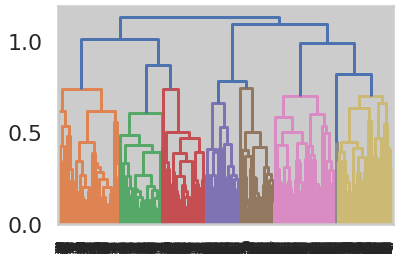

In [231]:
# run g = clustermap with log2 transform above
import scipy
g
den = scipy.cluster.hierarchy.dendrogram(g.dendrogram_col.linkage,
                                         labels = tempdf_treg_log2.index,
                                         color_threshold=0.77)  
from collections import defaultdict

def get_cluster_classes(den, label='ivl', max_cluster = 10):
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - int(int(max_cluster)/2)) / int(max_cluster)
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    cluster_classes = {}
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes

clusters = get_cluster_classes(den)

cluster = []
for i in tempdf_treg_log2.index:
    included=False
    for j in clusters.keys():
        if i in clusters[j]:
            cluster.append(j)
            included=True
    if not included:
        cluster.append(None)


In [232]:
cluster = np.array(cluster)
clus_treg = np.array(["cluster"]*len(cluster))

clus_treg[cluster == "C1"] = "A2"
clus_treg[cluster == "C2"] = "S1"
clus_treg[cluster == "C3"] = "S1"
clus_treg[cluster == "C4"] = "A1"
clus_treg[cluster == "C5"] = "S3"
clus_treg[cluster == "C6"] = "BA"
clus_treg[cluster == "C7"] = "S2"
clus_treg[cluster == "C8"] = "S2"

#rename S to C
clus_treg[clus_treg=='S3'] = 'C3'
clus_treg[clus_treg=='S2'] = 'C2'
clus_treg[clus_treg=='S1'] = 'C1'

In [233]:
tempdf_treg = pd.DataFrame.copy(tempdf_treg_log2)
tempdf_treg['cluster'] = clus_treg
tempdf_treg['cell'] = np.asarray(df.loc[~df['MJ Tconv index'].isnull(), "cell"])
tempdf_treg['treatment'] = np.asarray(df.loc[~df['MJ Tconv index'].isnull(), "treatment"])
tempdf_treg['MJ Tconv index'] = np.asarray(df.loc[~df['MJ Tconv index'].isnull(), 'MJ Tconv index'])
tempdf_treg['mouse'] = np.asarray(df.loc[~df['MJ Tconv index'].isnull(), 'sample'])

In [234]:
row_order = ["MJ Tconv Ki67 SFI norm (all)","MJ Tconv PD-1 SFI norm (all)", "MJ Tconv pSTAT5 SFI norm (all)", "Ki67 SFI norm (all)", "PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)"]

tempdf_treg2 = df.loc[~df['MJ Tconv index'].isnull(), row_order]
tempdf_treg2.index = np.arange(len(tempdf_treg2))

tempdf_treg2["cell"] = tempdf_treg['cell']
tempdf_treg2["cluster"] = tempdf_treg['cluster']
tempdf_treg2['MJ Tconv index'] = tempdf_treg['MJ Tconv index']
tempdf_treg2["treatment"] = tempdf_treg['treatment']

In [235]:
# number of A1 dTEC tregs divided by A1 WT tregs (fold-change in A1 representation)
np.sum(np.asarray(tempdf_treg['cluster']=='A1')* np.asarray(tempdf_treg['treatment']=='dTEC'))/np.sum(np.asarray(tempdf_treg['cluster']=='A1')* np.asarray(tempdf_treg['treatment']=='WT'))

8.529411764705882

In [236]:
clus = "A1"

totlist = []
for temp in np.asarray(tempdf_treg2[tempdf_treg2['cluster']==clus]["MJ Tconv index"]):
    if type(temp)==list:
        totlist.extend(temp)
    else:
        totlist.append(temp)

totlist = set(totlist)

temp_clust = pd.DataFrame.copy(tempdf_treg2.loc[tempdf_treg2['cluster']==clus, ["Ki67 SFI norm (all)","PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)", "cell", "treatment"]])

for ind in totlist:
    temp_clust = temp_clust.append(df.loc[df.index==ind, ["Ki67 SFI norm (all)","PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)", "cell", "treatment"]])


/tmp/ipykernel_23715/24245512.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_clust = temp_clust.append(df.loc[df.index==ind, ["Ki67 SFI norm (all)","PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)", "cell", "treatment"]])
/tmp/ipykernel_23715/24245512.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_clust = temp_clust.append(df.loc[df.index==ind, ["Ki67 SFI norm (all)","PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)", "cell", "treatment"]])
/tmp/ipykernel_23715/24245512.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_clust = temp_clust.append(df.loc[df.index==ind, ["Ki67 SFI norm (all)","PD-1 SFI norm (all)", "pSTAT5 SFI norm (all)", "cell", "treatment"]])
/tmp/ipykernel_23715/24245512.py:15: Future

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

polyclonal Treg_WT v.s. MJ Tconv_WT: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.042e-03 U_stat=1.100e+01
polyclonal Treg_dTEC v.s. MJ Tconv_dTEC: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.670e-21 U_stat=2.800e+02


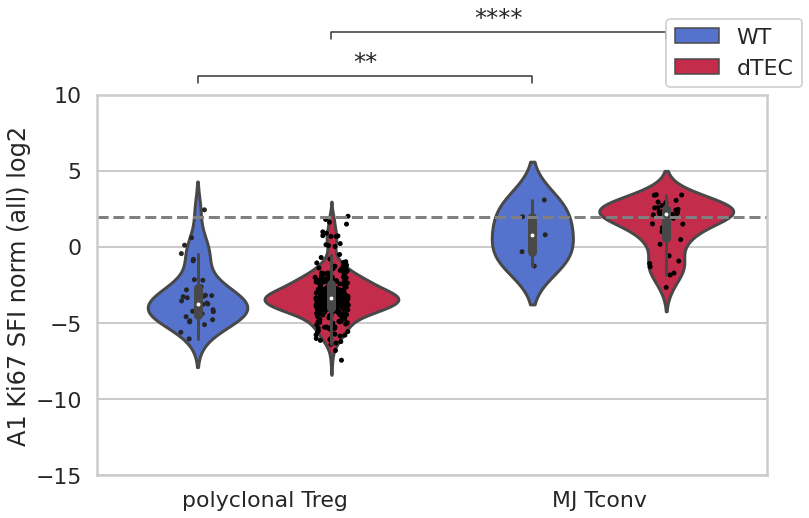

In [237]:

plt.figure(figsize=(12,7))
temp = "Ki67"
tempmarker = temp + " SFI norm (all)"
color_dict = {'WT': "royalblue", 'dTEC': "crimson"}

temp_clust[tempmarker + " log2"] = np.log2(temp_clust[tempmarker])
tempmarker += " log2"
nanmin = np.min(temp_clust[tempmarker][np.isfinite(temp_clust[tempmarker])])
temp_clust.loc[temp_clust[tempmarker] == -np.inf, tempmarker] = nanmin1


ax = sns.violinplot(data = temp_clust, x='cell', hue='treatment', y=tempmarker, palette=color_dict)
sns.stripplot(data = temp_clust, x='cell', hue="treatment", y=tempmarker, jitter=True, zorder=1, ax = ax, dodge = True, color = "black")
plt.ylim([-15,10])

statannot.add_stat_annotation(
   ax,
   data=temp_clust,
   x = 'cell',
   hue="treatment",
   y=tempmarker,
   box_pairs=[
      (("MJ Tconv", "WT"), ("polyclonal Treg", "WT")),
      (("MJ Tconv", "dTEC"), ("polyclonal Treg", "dTEC")),
      #(("MJ Tconv", "WT"), ("MJ Treg", "WT")),
      #(("polyclonal Treg", "WT"), ("MJ Treg", "WT")),
   ],
   test="Mann-Whitney",
   text_format="star",
   loc="outside",
)
plt.axhline(2, linestyle='--', c='grey')
# sns.set(font_scale = 2)
plt.xlabel('')
plt.ylabel(clus + " " + tempmarker)
#plt.gca().set_xticklabels(["polyclonal Treg", "MJ t"])
# Get the handles and labels. For this example it'll be 2 tuples
# of length 4 each.
handles, labels = ax.get_legend_handles_labels()
# When creating the legend, only use the first two elements
# to effectively remove the last two.
plt.legend(handles[0:2], labels[0:2], bbox_to_anchor=(.85, 1.2), loc=2, borderaxespad=0.)

pass #plt.savefig("",bbox_inches='tight')

In [238]:
tempdf_log2_zscore = scipy.stats.zscore(tempdf_treg_log2, axis = 1)
mapper = umap.umap_.UMAP().fit(tempdf_log2_zscore)

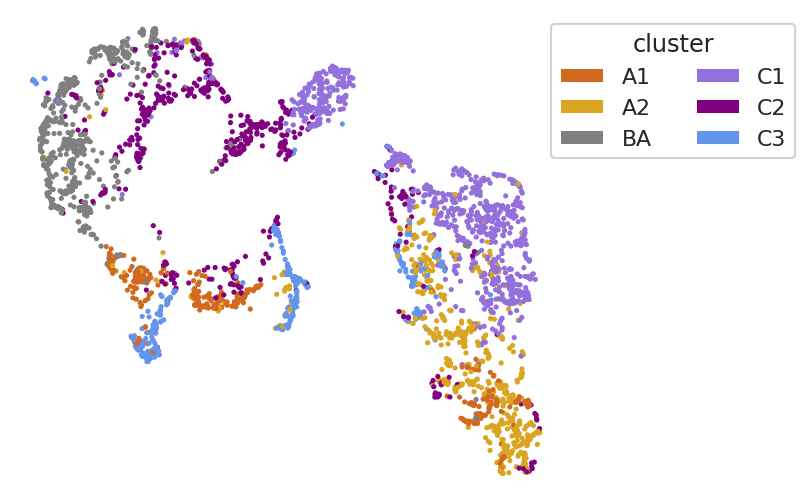

In [239]:
from matplotlib.patches import Patch

sns.set_style("whitegrid", {'axes.grid' : False})

fig, ax = plt.subplots(figsize=(10,9))
ax.grid(False)


# make color map
temp_markers = ['BA', 'C1', 'C2', 'C3', "A1", 'A2']
temp_colors =  ['grey', 'mediumpurple', "purple", "cornflowerblue", "chocolate", "goldenrod"]
# Map label to RGB
color_map = dict(zip(temp_markers, temp_colors))


plt.scatter(mapper.embedding_[:,0],mapper.embedding_[:,1], s = 10,  c = pd.DataFrame(clus_treg)[0].map(color_map))
plt.xticks([]); plt.yticks([])
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)

temp_title = ["cluster"]
temp_col = [2]
color_dict={"WT":'royalblue', "dTEC": "crimson", "A1": "chocolate", "A2": "goldenrod","C1": "mediumpurple", "C2": "purple", "C3":"cornflowerblue", "BA": "grey", "A": "yellow", "D.2":"darkblue", "D":"cyan"}
for i,leg in enumerate([np.unique(clus_treg)]):
    handles = [Patch(facecolor=color_dict[name]) for name in leg]
    legend = plt.legend(handles,  leg, title=temp_title[i],
            bbox_to_anchor=(1.05, 0.75), bbox_transform=plt.gcf().transFigure, ncol = temp_col[i], loc = "center")
    plt.gca().add_artist(legend)
    
    
pass #plt.savefig("",bbox_inches='tight')

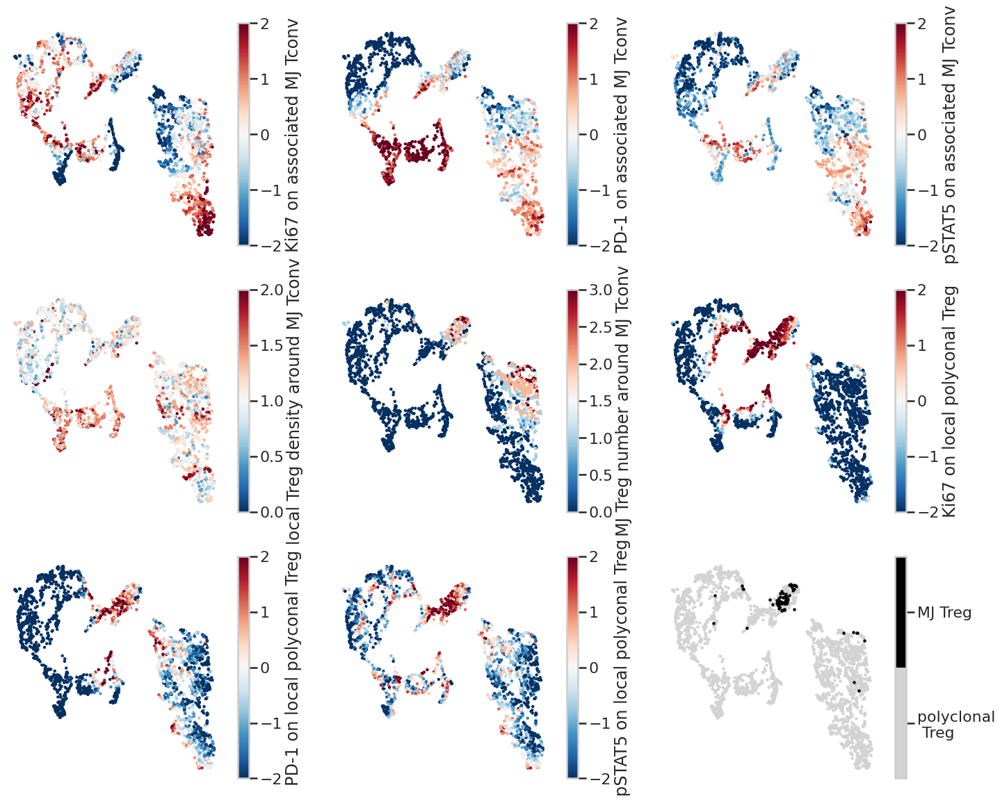

In [240]:
sns.set_style("whitegrid", {'axes.grid' : False})

cmap = "RdBu_r"

fig = plt.figure(figsize=(24,20))
ind = 1
for i in range(len(tempdf_log2_zscore.columns)):
    ax = fig.add_subplot(3,3,ind)
    ax.grid(False)
    values = np.array(tempdf_treg_log2[tempdf_log2_zscore.columns[i]])
    if "density" in tempdf_log2_zscore.columns[i]:
        scatter = plt.scatter(mapper.embedding_[:,0],mapper.embedding_[:,1], s = 6,  c=values, cmap = cmap, vmin = 0, vmax= 2)
    elif "MJ Treg #" in tempdf_log2_zscore.columns[i]:
        scatter = plt.scatter(mapper.embedding_[:,0],mapper.embedding_[:,1], s = 6,  c=values, cmap = cmap, vmin = 0, vmax= 3)
    else:
        scatter = plt.scatter(mapper.embedding_[:,0],mapper.embedding_[:,1], s = 6,  c=values, cmap = cmap, vmin = -2, vmax= 2)
    plt.xticks([]); plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    plt.colorbar(scatter, label = row_names[i], ax = ax)
    ind +=1
    
    
ax = fig.add_subplot(3,3,ind)
temp_treg = df.loc[~df['MJ Tconv index'].isnull(),]
plt.scatter(mapper.embedding_[temp_treg['cell']!="MJ Treg",0],mapper.embedding_[temp_treg['cell']!="MJ Treg",1], s = 6,  c="lightgrey")
plt.scatter(mapper.embedding_[temp_treg['cell']=="MJ Treg",0],mapper.embedding_[temp_treg['cell']=="MJ Treg",1], s = 6,  c="black")
plt.xticks([]); plt.yticks([])
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)

cmap, norm = mcolors.from_levels_and_colors(range(3), ["lightgrey", "black"])
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks = [0.5, 1.5])
cbar.ax.set_yticklabels(['polyclonal\n Treg', 'MJ Treg'])

pass #plt.savefig("",bbox_inches='tight')

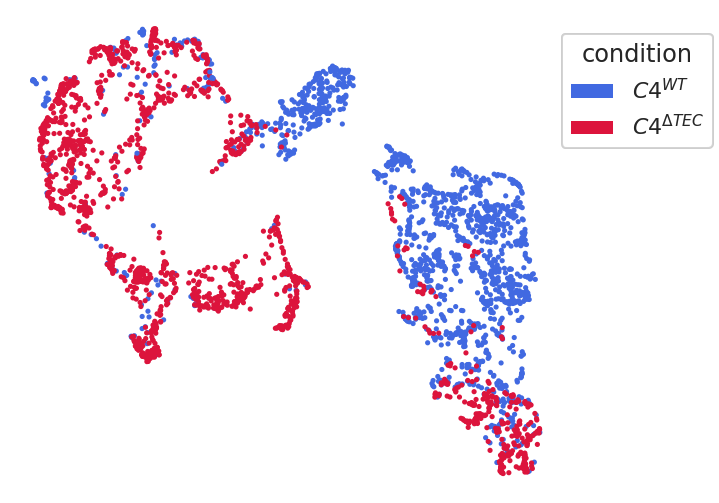

In [241]:
sns.set_style("whitegrid", {'axes.grid' : False})

fig, ax = plt.subplots(figsize=(10,9))
ax.grid(False)


# make color map
color_labels = temp_treg.loc[~np.isnan(temp_treg["MJ Tconv local MJ Treg + polyclonal Treg density scaled"]),"treatment"].unique()
# List of RGB triplets
rgb_values = ["royalblue", "crimson"]
# Map label to RGB
color_map = dict(zip(color_labels, rgb_values))


plt.scatter(mapper.embedding_[:,0],mapper.embedding_[:,1], s = 10,  c = temp_treg.loc[~np.isnan(temp_treg["MJ Tconv local MJ Treg + polyclonal Treg density scaled"]),"treatment"].map(color_map))
plt.xticks([]); plt.yticks([])
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
    

handles = [Patch(facecolor=color_map[name]) for name in ['WT', 'dTEC']]
legend = plt.legend(handles,  [r'$C4^{WT}$', r'$C4^{\Delta TEC}$'], title="condition",
        bbox_to_anchor=(1.0, 0.75), bbox_transform=plt.gcf().transFigure, loc = "center")
plt.gca().add_artist(legend)


pass #plt.savefig("",bbox_inches='tight')

In [242]:
tempdf_tconv = df.loc[~np.isnan(df['local MJ Treg + polyclonal Treg density scaled'])]

In [243]:
temp_markers = ["A1", "A2", "C1", "C2", "C3", "BA"]
for j in range(len(temp_markers)):
        tempdf_tconv["Treg " + temp_markers[j]] = np.nan
         
         
for i in range(len(tempdf_tconv)):
    temp = []
    for j in range(len(tempdf_treg)):
        if np.sum(tempdf_tconv.index[i] == np.asarray(tempdf_treg.iloc[j]['MJ Tconv index'])) > 0:
            temp.append(tempdf_treg.iloc[j]['cluster'])
    temp = np.asarray(temp)
    for j in range(len(temp_markers)):
        tempdf_tconv.loc[tempdf_tconv.index[i],"Treg " + temp_markers[j]] = np.sum(temp==temp_markers[j])/len(temp)

/tmp/ipykernel_23715/2066823931.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tempdf_tconv["Treg " + temp_markers[j]] = np.nan
/tmp/ipykernel_23715/2066823931.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tempdf_tconv["Treg " + temp_markers[j]] = np.nan
/tmp/ipykernel_23715/2066823931.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

In [244]:
tcols = ["Treg A2", "Treg C1", "Treg A1", "Treg C3", "Treg BA",  "Treg C2"]
td= tempdf_tconv[tcols]
max_identity = []
for i in range(len(td)):
    max_identity.append(tcols[np.argmax(np.array(td.iloc[i,:]))].split("Treg ")[1])   

tempdf_tconv['cluster'] = max_identity

/tmp/ipykernel_23715/725897333.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tempdf_tconv['cluster'] = max_identity


In [245]:
sns.set_style("whitegrid", {'axes.grid' : True})


In [246]:
tempdf_treg

,MJ Tconv Ki67 SFI norm (MJ Tconv),MJ Tconv PD-1 SFI norm (MJ Tconv),MJ Tconv pSTAT5 SFI norm (MJ Tconv),MJ Tconv local MJ Treg + polyclonal Treg density scaled,MJ Tconv local MJ Treg #,Ki67 SFI norm (polyclonal Treg + MJ Treg),PD-1 SFI norm (polyclonal Treg + MJ Treg),pSTAT5 SFI norm (polyclonal Treg + MJ Treg),cluster,cell,treatment,MJ Tconv index,mouse
0,-1.819532,0.059396,-0.337575,2.031221,0.000000,-3.872199,-1.152856,-0.890314,C3,polyclonal Treg,WT,62574,WT.D.6.1
1,-1.819532,0.059396,-0.337575,2.031221,0.000000,-2.566027,0.686184,-0.397280,C3,polyclonal Treg,WT,62574,WT.D.6.1
2,-1.819532,0.059396,-0.337575,2.031221,0.000000,-4.940641,-1.444625,-1.849983,C3,polyclonal Treg,WT,62574,WT.D.6.1
3,-1.819532,0.059396,-0.337575,2.031221,0.000000,-3.673975,-1.970095,-2.673445,C3,polyclonal Treg,WT,62574,WT.D.6.1
4,-1.819532,0.059396,-0.337575,2.031221,0.000000,-3.297454,0.201644,-1.132762,C3,polyclonal Treg,WT,62574,WT.D.6.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3190,-0.523008,-0.002953,-0.063926,0.482741,1.000000,-0.443270,-0.501946,-0.010555,C1,MJ Treg,WT,62633,WT.A.1
3191,-0.225182,-0.242503,-0.655006,0.831388,2.500000,0.340908,-0.463511,-0.332234,C1,MJ Treg,WT,"[62612, 62653]",WT.A.1
3192,0.368074,0.263838,0.181014,1.144276,1.333333,-0.981501,-1.905541,-1.486653,C1,MJ Treg,WT,"[62625, 62662, 62680]",WT.A.1
3193,-0.238321,0.843812,0.665688,1.689595,1.500000,-5.670577,-2.033021,-1.409278,C1,MJ Treg,WT,"[62639, 62640]",WT.A.1


/tmp/ipykernel_23715/392900378.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_data = temp_data.append(temp_data2)
/tmp/ipykernel_23715/392900378.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_data = temp_data.append(temp_data2)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_23715/392900378.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  temp_data = temp_data.append(temp_data2)
/tmp/ipykernel_23715/392900378.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use panda

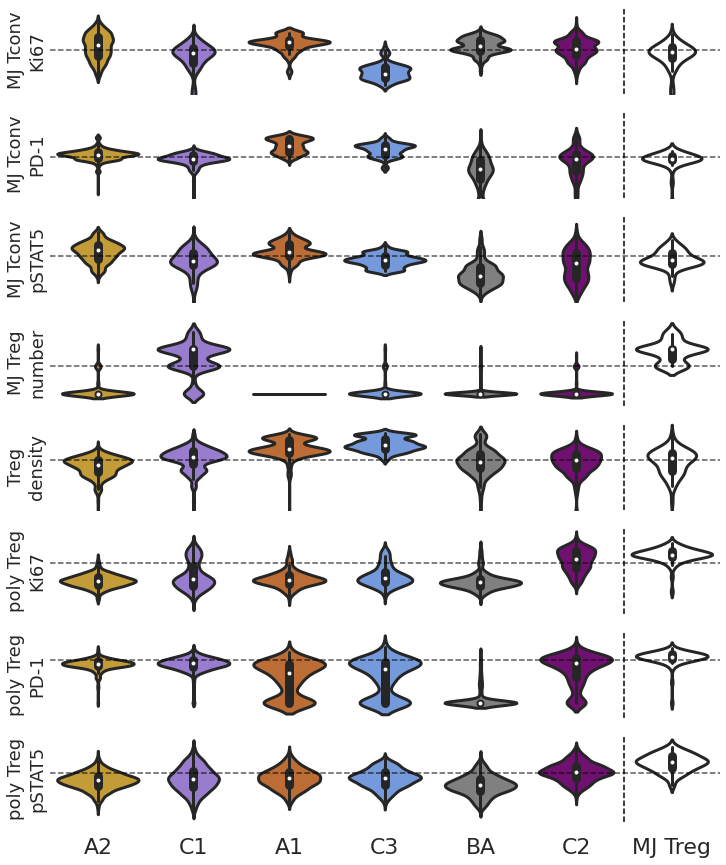

In [247]:
sns.set_context('poster')

temp_treg_data = pd.DataFrame.copy(df.loc[~df['MJ Tconv index'].isnull()])
temp_treg_data['cluster'] = clus_treg

temp_markers = ["A2", "C1", "A1",  "C3", "BA", "C2", "MJ Treg" ]
temp_colors =  ["goldenrod", "mediumpurple", "chocolate", "cornflowerblue", "grey","purple", "white"]

order = temp_markers
my_colors = {}
for i in range(len(temp_markers)):
    my_colors[temp_markers[i]] = temp_colors[i]
    
    
temp_cols = ["MJ Tconv Ki67 SFI norm (MJ Tconv)","MJ Tconv PD-1 SFI norm (MJ Tconv)", "MJ Tconv pSTAT5 SFI norm (MJ Tconv)", "MJ Tconv local MJ Treg #",'MJ Tconv local MJ Treg + polyclonal Treg density scaled',"Ki67 SFI norm (polyclonal Treg + MJ Treg)", "PD-1 SFI norm (polyclonal Treg + MJ Treg)", "pSTAT5 SFI norm (polyclonal Treg + MJ Treg)"]
temp_names = [ "MJ Tconv\nKi67","MJ Tconv\nPD-1", "MJ Tconv\npSTAT5", "MJ Treg\nnumber", "Treg\ndensity", "poly Treg\nKi67", "poly Treg\nPD-1", "poly Treg\npSTAT5"]
fig = plt.figure(figsize=(12,15))
for i in range(len(temp_names)):
    if i >=0:
        temp_data = pd.DataFrame.copy(temp_treg_data)
        temp_data2 =  pd.DataFrame.copy(temp_data.loc[temp_data['cell']=="MJ Treg"])
        temp_data2['cluster'] = "MJ Treg"
        temp_data = temp_data.append(temp_data2)
        temp_data[temp_cols[i]+ ' log2'] = np.log2(temp_data[temp_cols[i]])
        temp_data.loc[temp_data[temp_cols[i]+ ' log2'] == -np.inf, temp_cols[i]+ ' log2'] = np.min(temp_data[temp_cols[i]+ ' log2'][np.isfinite(temp_data[temp_cols[i]+ ' log2'])])
        temp_data.loc[np.isnan(temp_data[temp_cols[i]+ ' log2']), temp_cols[i]+ ' log2']  = np.min(temp_data[temp_cols[i]+ ' log2'][np.isfinite(temp_data[temp_cols[i]+ ' log2'])])
    else:
        temp_data = pd.DataFrame(tempdf_tconv)
        temp_data[temp_cols[i]+ ' log2'] = np.log2(tempdf_tconv[temp_cols[i]])
        temp_data.loc[temp_data[temp_cols[i]+ ' log2'] == -np.inf, temp_cols[i]+ ' log2'] = np.min(temp_data[temp_cols[i]+ ' log2'][np.isfinite(temp_data[temp_cols[i]+ ' log2'])])
        temp_data.loc[np.isnan(temp_data[temp_cols[i]+ ' log2']), temp_cols[i]+ ' log2']  = np.min(temp_data[temp_cols[i]+ ' log2'][np.isfinite(temp_data[temp_cols[i]+ ' log2'])])
    ax = fig.add_subplot(len(temp_names),1,i+1)
    if temp_names[i] == "poly Treg\nPD-1":
        ax = sns.violinplot(data = temp_data, x='cluster', y=temp_cols[i]+ ' log2', palette=my_colors, showfliers = False, order=order, width=0.75, scale='width')
    elif temp_names[i] == "MJ Treg\nnumber":
        ax = sns.violinplot(data = temp_data, x='cluster', y=temp_cols[i]+ ' log2', palette=my_colors, showfliers = False, order=order, width=0.75, scale='width')
    else:
        ax = sns.violinplot(data = temp_data, x='cluster', y=temp_cols[i]+ ' log2', palette=my_colors, showfliers = False, order=order, width=0.85)
    #sns.stripplot(data = temp_data, x='cluster', y=temp_cols[i] + ' log2', jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order=order, alpha = 0.15)
    plt.ylabel(temp_names[i], fontsize=18)
    if i < len(temp_names)-1:
        plt.gca().set_xticklabels('')
    else:
        plt.gca().set_xticklabels(temp_markers)
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    plt.xlabel('')
    if "Ki67" in temp_cols[i] and i < 5:
        plt.ylim([-5,5])
    if "PD-1" in temp_cols[i] and i < 5:
        plt.ylim([-9,10])
    if "pSTAT5" in temp_cols[i]  and i < 5:
        plt.ylim([-4,3.5])
    if "density" in temp_cols[i]:
        plt.ylim([-2,1.5])
    plt.axhline(np.log2(1), linestyle='--', color='black', alpha = 0.65, linewidth=1.5)
    plt.axvline(5.5, linestyle='--', color='black', linewidth=1.5)

pass #plt.savefig("",bbox_inches='tight')

In [248]:
# perform statistics comparing treg marker sfi values of one cluster to all other clusters' average 
t_test_treg = np.zeros([len(tempdf_treg['cluster'].unique()), 3, 2])
for iter, clus in enumerate(tempdf_treg['cluster'].unique()):
    for i, mark in enumerate(["PD-1", "Ki67", "pSTAT5"]):
        tempx = tempdf_treg.loc[np.asarray(tempdf_treg['cluster']==clus), mark + " SFI norm (polyclonal Treg + MJ Treg)"]
        tempy = tempdf_treg.loc[np.asarray(tempdf_treg['cluster']!=clus), mark + " SFI norm (polyclonal Treg + MJ Treg)"]
        t_test_treg[iter, i, 0] = scipy.stats.ttest_ind(tempx, tempy,  equal_var=False)[1]
        #t_test_treg[iter, i, 0] = scipy.stats.mannwhitneyu(tempx, tempy)[1]
        t_test_treg[iter, i, 1] = np.mean(tempx) - np.mean(tempy)

print(tempdf_treg['cluster'].unique())
for i, mark in enumerate(["PD-1", "Ki67", "pSTAT5"]):
    print(mark)
    for iter, clus in enumerate(tempdf_treg['cluster'].unique()):
        if t_test_treg[iter,i,0] <= 0.05/(3*2*len(tempdf_treg['cluster'].unique())):
            print('\t',clus, np.round(t_test_treg[iter,i,-1],3))

['C3' 'A2' 'C1' 'C2' 'BA' 'A1']
PD-1
	 A2 3.611
	 C1 4.167
	 C2 1.848
	 BA -9.163
	 A1 -1.443
Ki67
	 A2 -1.309
	 C2 3.62
	 BA -1.502
	 A1 -0.833
pSTAT5
	 A2 -0.236
	 C2 1.115
	 BA -0.931


In [249]:
t_test_treg[0,:,:]

array([[ 0.00150976, -1.00488629],
       [ 0.2793709 , -0.12879023],
       [ 0.12211851,  0.10580728]])

In [250]:
# perform statistics comparing tconv marker sfi values of one cluster to all other clusters' average 
t_test_tconv = np.zeros([len(tempdf_tconv['cluster'].unique()), 3, 2])
for iter, clus in enumerate(tempdf_tconv['cluster'].unique()):
    for i, mark in enumerate(["PD-1", "Ki67", "pSTAT5"]):
        tempx = tempdf_tconv.loc[tempdf_tconv['cluster']==clus, mark + " SFI norm (MJ Tconv)"]
        tempy = tempdf_tconv.loc[tempdf_tconv['cluster']!=clus, mark + " SFI norm (MJ Tconv)"]
        t_test_tconv[iter, i, 0] = scipy.stats.ttest_ind(tempx, tempy,  equal_var=False)[1]
        t_test_tconv[iter, i, 1] = np.mean(tempx)-np.mean(tempy)

print(tempdf_tconv['cluster'].unique())
for i, mark in enumerate(["PD-1", "Ki67", "pSTAT5"]):
    print(mark)
    for iter, clus in enumerate(tempdf_tconv['cluster'].unique()):
        if t_test_tconv[iter,i,0] <= 0.05/(3*2*len(tempdf_tconv['cluster'].unique())):
            print('\t', clus, np.round(t_test_tconv[iter,i,-1],3))

['C1' 'A2' 'C2' 'C3' 'BA' 'A1']
PD-1
	 C1 -1.763
	 BA -2.146
	 A1 8.0
Ki67
	 C1 -0.772
	 C3 -1.344
pSTAT5
	 A2 0.673
	 C2 -0.401
	 BA -0.651
	 A1 0.687


In [251]:
t_test_tconv[0,:,:]

array([[ 1.74658000e-07, -1.76306192e+00],
       [ 3.34166074e-08, -7.72418192e-01],
       [ 6.82635296e-01, -3.69794304e-02]])

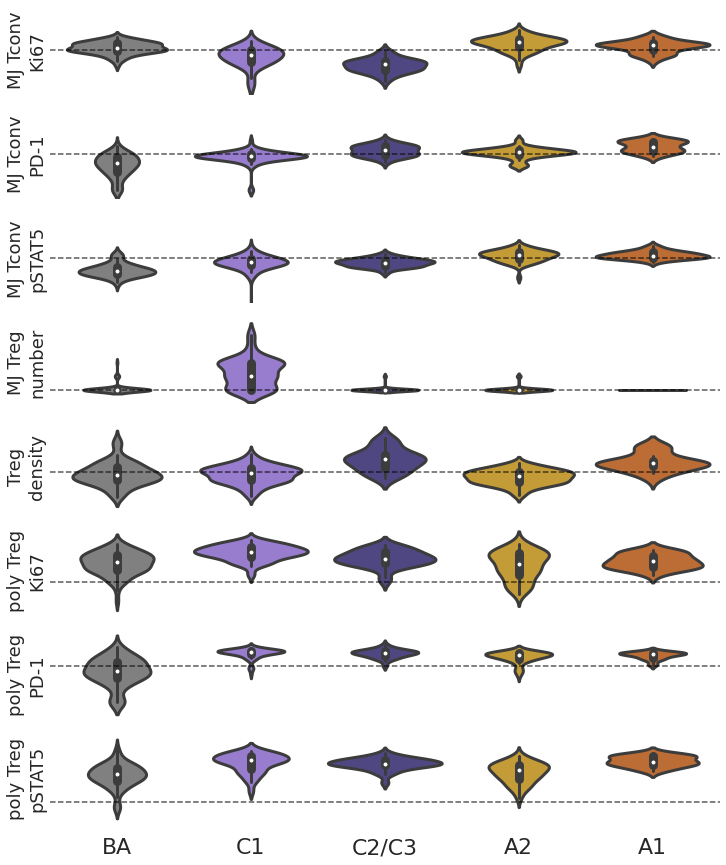

In [252]:
# for the summed treg profiles, visualize the marker sfi values for each cluster like above for indiviual tregs
temp_markers = ["BA", "C1", "C2/C3", "A2", "A1"]
temp_colors =  ["grey","mediumpurple", "darkslateblue", "goldenrod", "chocolate"]

order = temp_markers
my_colors = {}
for i in range(len(temp_markers)):
    my_colors[temp_markers[i]] = temp_colors[i]
    
    
temp_cols = ["Ki67 SFI norm (MJ Tconv)","PD-1 SFI norm (MJ Tconv)", "pSTAT5 SFI norm (MJ Tconv)", "local MJ Treg #",'local MJ Treg + polyclonal Treg density scaled','MJ Tconv inverse sum Ki67 SFI norm (polyclonal Treg + MJ Treg)', 'MJ Tconv inverse sum PD-1 SFI norm (polyclonal Treg + MJ Treg)', 'MJ Tconv inverse sum pSTAT5 SFI norm (polyclonal Treg + MJ Treg)']
temp_names = [ "MJ Tconv\nKi67","MJ Tconv\nPD-1", "MJ Tconv\npSTAT5", "MJ Treg\nnumber", "Treg\ndensity", "poly Treg\nKi67", "poly Treg\nPD-1", "poly Treg\npSTAT5"]
fig = plt.figure(figsize=(12,15))
for i in range(len(temp_names)):
    ax = fig.add_subplot(len(temp_names),1,i+1)
    if temp_names[i] == "poly Treg\nPD-1":
        ax = sns.violinplot(data = tempdf_tcon, x='cluster', y=temp_cols[i], palette=my_colors, showfliers = False, order=order, width=0.5, scale='width')
    elif temp_names[i] == "MJ Treg\nnumber":
        ax = sns.violinplot(data = tempdf_tcon, x='cluster', y=temp_cols[i], palette=my_colors, showfliers = False, order=order, width=0.5, scale='width')
    else:
        ax = sns.violinplot(data = tempdf_tcon, x='cluster', y=temp_cols[i], palette=my_colors, showfliers = False, order=order, width=0.85)
    #sns.stripplot(data = temp_data, x='cluster', y=temp_cols[i] + ' log2', jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order=order, alpha = 0.15)
    plt.ylabel(temp_names[i], fontsize=18)
    if i < len(temp_names)-1:
        plt.gca().set_xticklabels('')
    else:
        plt.gca().set_xticklabels(temp_markers)
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    plt.xlabel('')
    if "Ki67" in temp_cols[i] and i < 5:
        plt.ylim([-0.5,0.5])
    if "PD-1" in temp_cols[i] and i < 5:
        plt.ylim([-0.85,0.85])
    if "pSTAT5" in temp_cols[i]  and i < 5:
        plt.ylim([-0.5,0.5])
    #if "density" in temp_cols[i]:
     #   plt.ylim([0,2.15])
    if "density" in temp_cols[i]:
        plt.axhline(1, linestyle='--', color='black', alpha = 0.65, linewidth=1.5)
    else:
        plt.axhline(np.log2(1), linestyle='--', color='black', alpha = 0.65, linewidth=1.5)

pass #plt.savefig("",bbox_inches='tight')

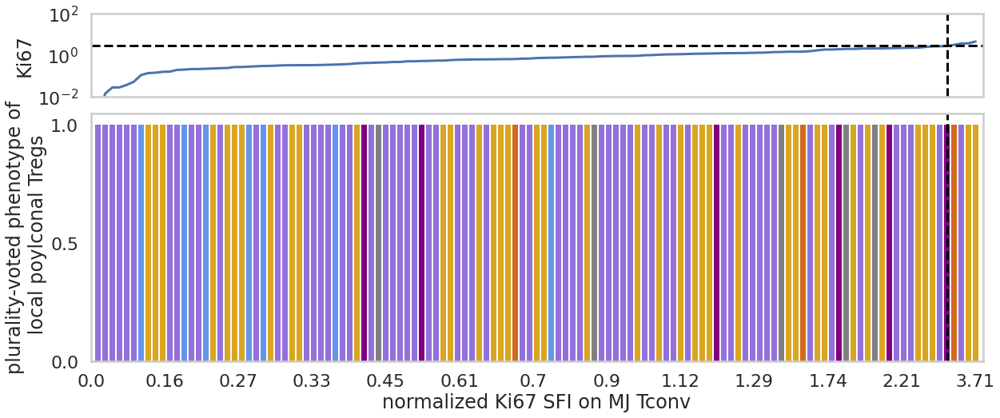

In [253]:
# for the indiviual treg profiles, determine the treg cluster majority vote around each wt mj tconv aranged by increasing mj tconv ki67

fig, (ax1,ax) = plt.subplots(2,figsize=(20,8),gridspec_kw={'height_ratios': [1, 3]})
plt.grid(False)

tempWT_tconv = tempdf_tconv.loc[tempdf_tconv["treatment"]=="WT",]
tempWT_tconv = tempWT_tconv.sort_values(by = "Ki67 SFI norm (MJ Tconv)")
tempWT_tconv.index = np.arange(len(tempWT_tconv))

temp_markers = ["C3","C2", "C1", "BA", "A1", "A2",]
temp_colors =  ["cornflowerblue", "purple", "mediumpurple","grey", "chocolate","goldenrod"]
color_dict={"A1": "chocolate", "A2": "goldenrod","C1": "mediumpurple", "C2": "purple", "C3":"cornflowerblue", "BA": "grey", "A": "yellow", "D.2":"darkblue", "D":"cyan"}

ax.bar(tempWT_tconv.index, [1]*len(tempWT_tconv), color=tempWT_tconv['cluster'].map(color_dict), edgecolor='None')


ax.set_xlim([-1,len(tempWT_tconv)])

ax.set_xticks(np.linspace(-1,len(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"])+1,len(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"]))[0::10])
ax.set_xticklabels(np.round(np.array(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"])[0::10],2))
ax.set_xlabel("normalized Ki67 SFI on MJ Tconv")
ax.set_ylabel("plurality-voted phenotype of\n local poylconal Tregs")
ax.axvline(np.argsort(np.abs(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")


ax.set_yticks([0,0.5,1])

ax1.grid(False)
ax1.plot(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"])
#plt.xlabel("normalized Ki67 SFI on MJ Tconv index")
#plt.ylabel("normalized Ki67 SFI on MJ Tconv")
ax1.set_ylabel("Ki67")
ax1.set_ylim([1e-2,100])
ax1.set_yscale('log')
ax1.axvline(np.argsort(np.abs(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")
ax1.axhline([3], c="black", linestyle="--")


ax1.set_xlim([-1,len(tempWT_tconv)])
ax1.set_xticks([])

plt.subplots_adjust(wspace=0, hspace=0.1)

pass #plt.savefig("",bbox_inches='tight')

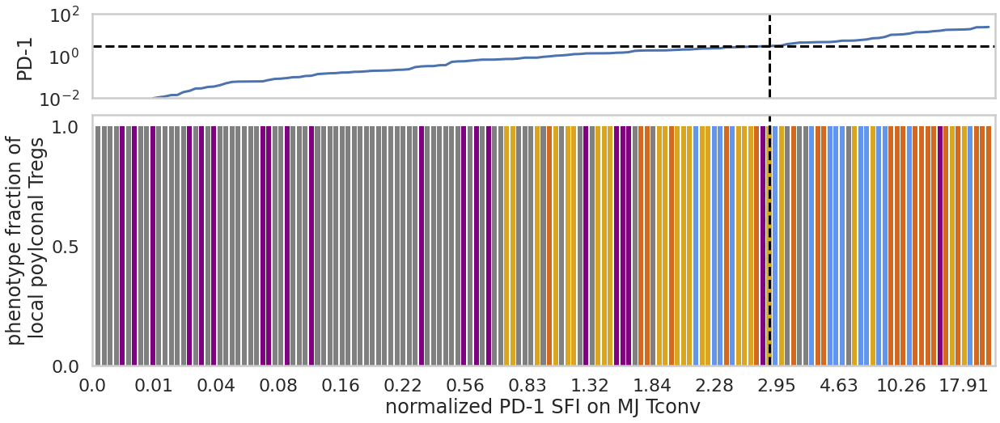

In [254]:
# for the individual treg profiles, determine the treg cluster majority vote around each wt mj tconv aranged by increasing mj tconv pd1

fig, (ax1,ax) = plt.subplots(2,figsize=(20,8),gridspec_kw={'height_ratios': [1, 3]})
plt.grid(False)

tempWT_tconv = tempdf_tconv.loc[tempdf_tconv["treatment"]=="dTEC",]
tempWT_tconv = tempWT_tconv.sort_values(by = "PD-1 SFI norm (MJ Tconv)")
tempWT_tconv.index = np.arange(len(tempWT_tconv))

temp_markers = ["C3","C2", "C1", "BA", "A1", "A2",]
temp_colors =  ["cornflowerblue", "purple", "mediumpurple","grey", "chocolate","goldenrod"]

ax.bar(tempWT_tconv.index, [1]*len(tempWT_tconv), color=tempWT_tconv['cluster'].map(color_dict), edgecolor='None')


ax.set_xlim([-1,len(tempWT_tconv)])

ax.set_xticks(np.linspace(-1,len(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])+1,len(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"]))[0::10])
ax.set_xticklabels(np.round(np.array(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])[0::10],2))
ax.set_xlabel("normalized PD-1 SFI on MJ Tconv")
ax.set_ylabel("phenotype fraction of\n local poylconal Tregs")
ax.axvline(np.argsort(np.abs(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")


ax.set_yticks([0,0.5,1])

ax1.grid(False)
ax1.plot(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])
#plt.xlabel("normalized Ki67 SFI on MJ Tconv index")
#plt.ylabel("normalized Ki67 SFI on MJ Tconv")
ax1.set_ylabel("PD-1")
ax1.set_ylim([1e-2,100])
ax1.set_yscale('log')
ax1.axvline(np.argsort(np.abs(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")
ax1.axhline([3], c="black", linestyle="--")


ax1.set_xlim([-1,len(tempWT_tconv)])
ax1.set_xticks([])

plt.subplots_adjust(wspace=0, hspace=0.1)

pass #plt.savefig("",bbox_inches='tight')

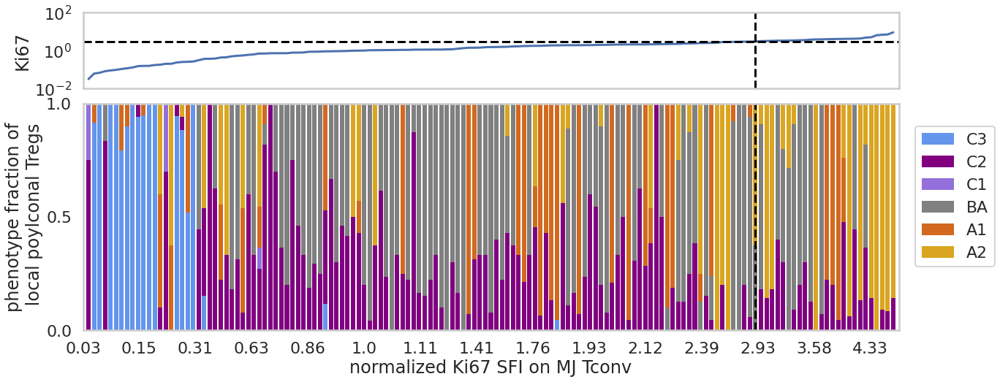

In [255]:
# for the individual treg profiles, determine the treg cluster majority vote around each dtec mj tconv aranged by increasing mj tconv ki67

fig, (ax1,ax) = plt.subplots(2,figsize=(20,8),gridspec_kw={'height_ratios': [1, 3]})
plt.grid(False)

tempWT_tconv = tempdf_tconv.loc[tempdf_tconv["treatment"]=="dTEC",]
tempWT_tconv = tempWT_tconv.sort_values(by = "Ki67 SFI norm (MJ Tconv)")
tempWT_tconv.index = np.arange(len(tempWT_tconv))

temp_markers = ["C3","C2", "C1", "BA", "A1", "A2",]
temp_colors =  ["cornflowerblue", "purple", "mediumpurple","grey", "chocolate","goldenrod"]

ax.bar(tempWT_tconv.index, tempWT_tconv["Treg " +temp_markers[0]], label=temp_markers[0], color=temp_colors[0], edgecolor='None')
for i in range(1,len(temp_markers)):
       bottom = np.zeros(len(tempWT_tconv))
       for j in range(0,i):
              bottom += np.array(tempWT_tconv["Treg " +temp_markers[j]])
       ax.bar(tempWT_tconv.index, tempWT_tconv["Treg " +temp_markers[i]], bottom=bottom,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None' )

ax.set_xlim([-1,len(tempWT_tconv)])

ax.set_xticks(np.linspace(-1,len(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"])+1,len(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"]))[0::10])
ax.set_xticklabels(np.round(np.array(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"])[0::10],2))
ax.set_xlabel("normalized Ki67 SFI on MJ Tconv")
ax.set_ylabel("phenotype fraction of\n local poylconal Tregs")
ax.axvline(np.argsort(np.abs(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")

ax.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)

ax.set_yticks([0,0.5,1])

ax1.grid(False)
ax1.plot(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"])
#plt.xlabel("normalized Ki67 SFI on MJ Tconv index")
#plt.ylabel("normalized Ki67 SFI on MJ Tconv")
ax1.set_ylabel("Ki67")
ax1.set_ylim([1e-2,100])
ax1.set_yscale('log')
ax1.axvline(np.argsort(np.abs(tempWT_tconv["Ki67 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")
ax1.axhline([3], c="black", linestyle="--")


ax1.set_xlim([-1,len(tempWT_tconv)])
ax1.set_xticks([])

plt.subplots_adjust(wspace=0, hspace=0.1)

pass #plt.savefig("",bbox_inches='tight')

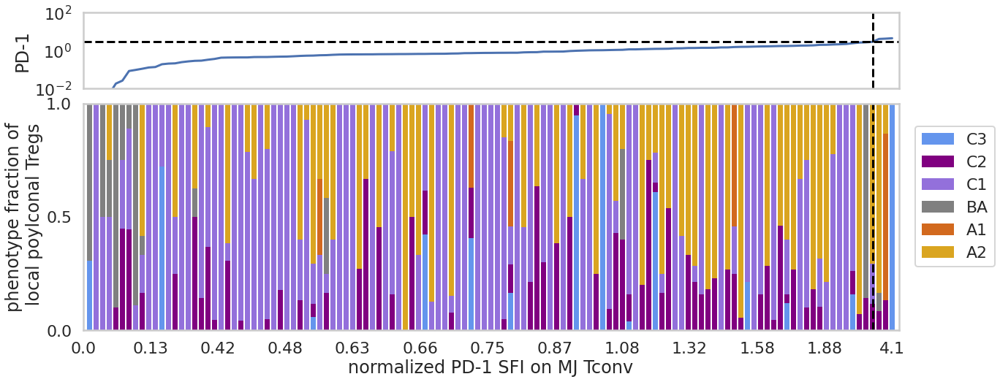

In [152]:
# for the individual treg profiles, determine the treg cluster majority vote around each wt mj tconv aranged by increasing mj tconv pd1

fig, (ax1,ax) = plt.subplots(2,figsize=(20,8),gridspec_kw={'height_ratios': [1, 3]})
plt.grid(False)

tempWT_tconv = tempdf_tconv.loc[tempdf_tconv["treatment"]=="WT",]
tempWT_tconv = tempWT_tconv.sort_values(by = "PD-1 SFI norm (MJ Tconv)")
tempWT_tconv.index = np.arange(len(tempWT_tconv))

temp_markers = ["C3","C2", "C1", "BA", "A1", "A2",]
temp_colors =  ["cornflowerblue", "purple", "mediumpurple","grey", "chocolate","goldenrod"]

ax.bar(tempWT_tconv.index, tempWT_tconv["Treg " +temp_markers[0]], label=temp_markers[0], color=temp_colors[0], edgecolor='None')
for i in range(1,len(temp_markers)):
       bottom = np.zeros(len(tempWT_tconv))
       for j in range(0,i):
              bottom += np.array(tempWT_tconv["Treg " +temp_markers[j]])
       ax.bar(tempWT_tconv.index, tempWT_tconv["Treg " +temp_markers[i]], bottom=bottom,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None' )

ax.set_xlim([-1,len(tempWT_tconv)])

ax.set_xticks(np.linspace(-1,len(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])+1,len(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"]))[0::10])
ax.set_xticklabels(np.round(np.array(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])[0::10],2))
ax.set_xlabel("normalized PD-1 SFI on MJ Tconv")
ax.set_ylabel("phenotype fraction of\n local poylconal Tregs")
ax.axvline(np.argsort(np.abs(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")

ax.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)

ax.set_yticks([0,0.5,1])

ax1.grid(False)
ax1.plot(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])
#plt.xlabel("normalized Ki67 SFI on MJ Tconv index")
#plt.ylabel("normalized Ki67 SFI on MJ Tconv")
ax1.set_ylabel("PD-1")
ax1.set_ylim([1e-2,100])
ax1.set_yscale('log')
ax1.axvline(np.argsort(np.abs(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")
ax1.axhline([3], c="black", linestyle="--")


ax1.set_xlim([-1,len(tempWT_tconv)])
ax1.set_xticks([])

plt.subplots_adjust(wspace=0, hspace=0.1)

pass #plt.savefig("",bbox_inches='tight')

In [153]:
temp_markers = ["A2", "C1", "A1", "C3", "BA", "C2"]
temp_mouse = tempdf_treg.mouse.unique()
temp_mat = np.zeros([len(temp_markers), len(temp_mouse)])

#temp_markers = ["BA", "C1", "C2/C3", "A2", "A1"][::-1]
#temp_colors =  ["grey","mediumpurple", "darkslateblue", "goldenrod", "chocolate"]

for j in range(len(temp_markers)):
    for i in range(len(temp_mouse)):
        temp_mat[j,i] = np.sum(np.array(tempdf_treg['cluster']==temp_markers[j])*np.array(tempdf_treg['mouse']==temp_mouse[i]))/np.sum(np.array(tempdf_treg['cluster']==temp_markers[j]))


temp_df = pd.DataFrame(columns=["mouse", "proportion", "cluster", "treatment"])


for i in range(len(temp_mouse)):
    for j in range(len(temp_markers)):
        temp_df=pd.concat([temp_df,pd.DataFrame({"mouse": [temp_mouse[i]], "treatment": [r'$C4^{WT}$', r'$C4^{\Delta TEC}$'][i >= 7], 'proportion':[temp_mat[j,i]], 'cluster': [temp_markers[j]]})])
    
temp_df.index = np.arange(len(temp_mouse)*len(temp_markers))
temp_df=temp_df.astype({'proportion': 'float'})

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/seaborn/categorical.py:2805: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/seaborn/categorical.py:2805: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

C1_$C4^{WT}$ v.s. C1_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=1.098e+00
A2_$C4^{WT}$ v.s. A2_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=2.648e-01
A1_$C4^{WT}$ v.s. A1_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.356e+00
C2_$C4^{WT}$ v.s. C2_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.121e+00
C3_$C4^{WT}$ v.s. C3_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-6.015e-01
BA_$C4^{WT}$ v.s. BA_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-9.659e-01


Text(48.125, 0.5, 'proportion of mouse sample in cluster')

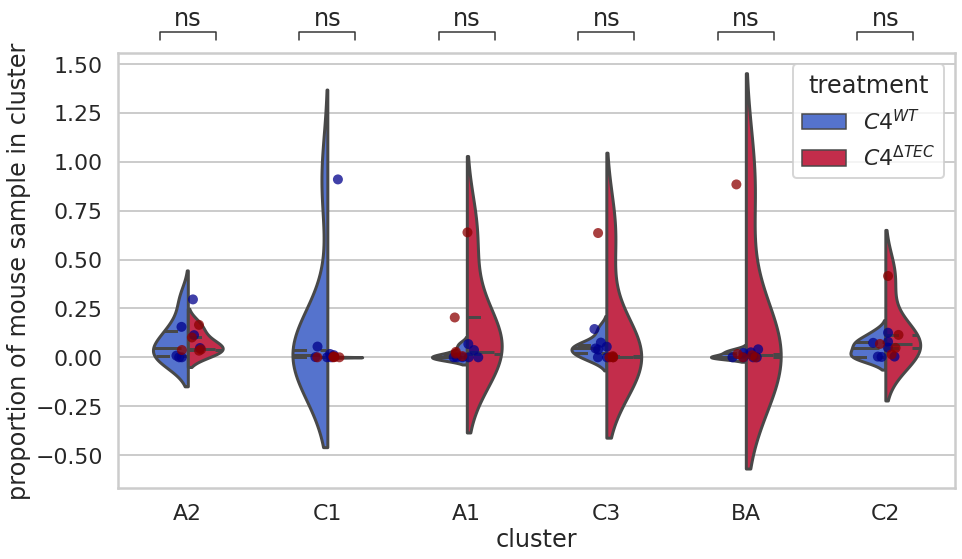

In [154]:
plt.figure(figsize=(15,8))
sns.set_style("whitegrid")

color_dict = {r'$C4^{WT}$': "royalblue", r'$C4^{\Delta TEC}$': "crimson"}

ax = sns.violinplot(data=temp_df, y="proportion", x="cluster", hue="treatment",split = True, hue_order=[r'$C4^{WT}$', r'$C4^{\Delta TEC}$'], width = 0.5, scale="width", inner="quartile", palette=color_dict, alpha = 0.7)
sns.stripplot(data = temp_df.loc[temp_df['treatment']==r'$C4^{WT}$'], x="cluster", y="proportion", jitter=True, zorder=2, ax = ax, dodge = True, alpha = 0.75, split=True, color="darkblue", size=10)
sns.stripplot(data = temp_df.loc[temp_df['treatment']==r'$C4^{\Delta TEC}$'], x="cluster", y="proportion", jitter=True, zorder=2, ax = ax, dodge = True, alpha = 0.75, split=True, color="darkred", size=10)


statannot.add_stat_annotation(
    ax,
    data=temp_df,
    x="cluster",
    y="proportion", 
    hue = "treatment",
    hue_order = [ r'$C4^{WT}$', r'$C4^{\Delta TEC}$'],
    box_pairs=[
        (("C1", r'$C4^{WT}$'),("C1", r'$C4^{\Delta TEC}$')),
        (("C2", r'$C4^{WT}$'),("C2", r'$C4^{\Delta TEC}$')),
        (("C3", r'$C4^{WT}$'),("C3", r'$C4^{\Delta TEC}$')),
        (("BA", r'$C4^{WT}$'),("BA", r'$C4^{\Delta TEC}$')),
        (("A1", r'$C4^{WT}$'),("A1", r'$C4^{\Delta TEC}$')),
        (("A2", r'$C4^{WT}$'),("A2", r'$C4^{\Delta TEC}$'))
    ],
    test="t-test_welch",
    text_format="star",
    loc="outside",
    #comparisons_correction = None,
)
plt.ylabel('proportion of mouse sample in cluster')

In [155]:
temp_markers = ["A2", "C1", "A1", "C3", "BA", "C2"]
temp_mouse = tempdf_treg.mouse.unique()
temp_mat = np.zeros([len(temp_markers), len(temp_mouse)])

#temp_markers = ["BA", "C1", "C2/C3", "A2", "A1"][::-1]
#temp_colors =  ["grey","mediumpurple", "darkslateblue", "goldenrod", "chocolate"]

for j in range(len(temp_markers)):
    for i in range(len(temp_mouse)):
        temp_mat[j,i] = np.sum(np.array(tempdf_treg['cluster']==temp_markers[j])*np.array(tempdf_treg['mouse']==temp_mouse[i]))/np.sum(np.array(tempdf_treg['mouse']==temp_mouse[i]))


temp_df = pd.DataFrame(columns=["mouse", "proportion", "cluster", "treatment"])


for i in range(len(temp_mouse)):
    for j in range(len(temp_markers)):
        temp_df=pd.concat([temp_df,pd.DataFrame({"mouse": [temp_mouse[i]], "treatment": [r'$C4^{WT}$', r'$C4^{\Delta TEC}$'][i >= 7], 'proportion':[temp_mat[j,i]], 'cluster': [temp_markers[j]]})])
    
temp_df.index = np.arange(len(temp_mouse)*len(temp_markers))
temp_df=temp_df.astype({'proportion': 'float'})

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/seaborn/categorical.py:2805: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)
/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/seaborn/categorical.py:2805: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

C1_$C4^{WT}$ v.s. C1_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=6.547e-01 stat=1.880e+00
A2_$C4^{WT}$ v.s. A2_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-7.880e-01
A1_$C4^{WT}$ v.s. A1_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=7.946e-01 stat=-1.869e+00
C2_$C4^{WT}$ v.s. C2_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.235e+00
C3_$C4^{WT}$ v.s. C3_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=8.887e-01
BA_$C4^{WT}$ v.s. BA_$C4^{\Delta TEC}$: Welch's t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=3.103e-01


Text(48.125, 0.5, 'proportion of cluster in mouse sample')

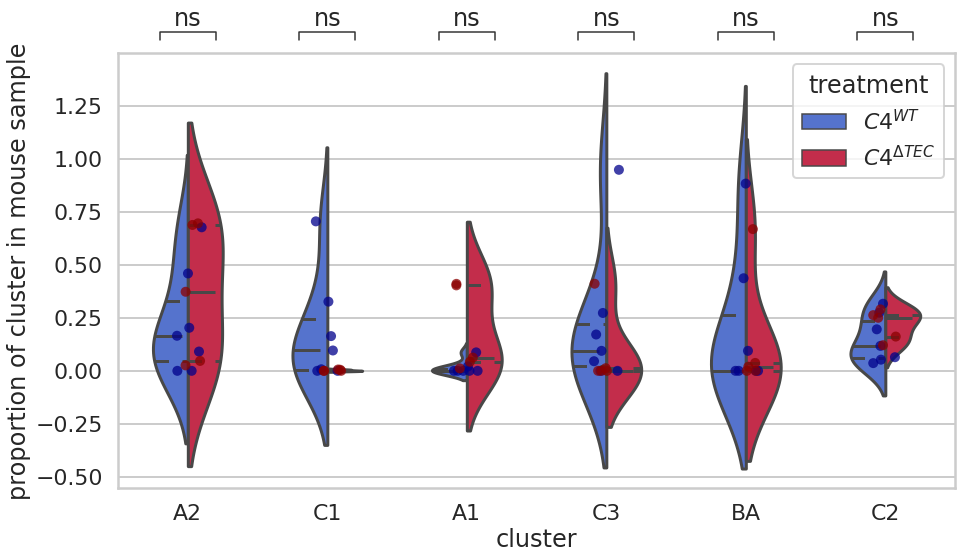

In [156]:
plt.figure(figsize=(15,8))
sns.set_style("whitegrid")

color_dict = {r'$C4^{WT}$': "royalblue", r'$C4^{\Delta TEC}$': "crimson"}

ax = sns.violinplot(data=temp_df, y="proportion", x="cluster", hue="treatment",split = True, hue_order=[r'$C4^{WT}$', r'$C4^{\Delta TEC}$'], width = 0.5, scale="width", inner="quartile", palette=color_dict, alpha = 0.7)
sns.stripplot(data = temp_df.loc[temp_df['treatment']==r'$C4^{WT}$'], x="cluster", y="proportion", jitter=True, zorder=2, ax = ax, dodge = True, alpha = 0.75, split=True, color="darkblue", size=10)
sns.stripplot(data = temp_df.loc[temp_df['treatment']==r'$C4^{\Delta TEC}$'], x="cluster", y="proportion", jitter=True, zorder=2, ax = ax, dodge = True, alpha = 0.75, split=True, color="darkred", size=10)


statannot.add_stat_annotation(
    ax,
    data=temp_df,
    x="cluster",
    y="proportion", 
    hue = "treatment",
    hue_order = [ r'$C4^{WT}$', r'$C4^{\Delta TEC}$'],
    box_pairs=[
        (("C1", r'$C4^{WT}$'),("C1", r'$C4^{\Delta TEC}$')),
        (("C2", r'$C4^{WT}$'),("C2", r'$C4^{\Delta TEC}$')),
        (("C3", r'$C4^{WT}$'),("C3", r'$C4^{\Delta TEC}$')),
        (("BA", r'$C4^{WT}$'),("BA", r'$C4^{\Delta TEC}$')),
        (("A1", r'$C4^{WT}$'),("A1", r'$C4^{\Delta TEC}$')),
        (("A2", r'$C4^{WT}$'),("A2", r'$C4^{\Delta TEC}$'))
    ],
    test="t-test_welch",
    text_format="star",
    loc="outside",
    #comparisons_correction = None,
)
plt.ylabel('proportion of cluster in mouse sample')

In [157]:
# shuffle labels on indivual tregs to create null model for cluster proportions to then statistically compare observed proportions
niter = 499
temp_markers = ["A2", "C1", "A1", "C3", "BA", "C2"]
temp_colors =  ["goldenrod", "mediumpurple", "chocolate", "cornflowerblue", "grey","purple"]
null_shuffles1 = np.zeros([niter, len(temp_markers)])
null_shuffles2 = np.zeros([niter, len(temp_markers),2])

sind = 0
for iter in range(niter):
    old_labels = np.asarray(tempdf_treg['treatment'])
    idx = np.random.permutation(len(tempdf_treg))
    new_labels = old_labels[idx]
    # shuffle 
    for j in range(len(temp_markers)):
        null_shuffles1[iter, j] = np.sum(np.array(new_labels=="WT")*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['cluster']==temp_markers[j]))
        null_shuffles2[iter, j, 0] = np.sum(np.array(new_labels=="WT")*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(new_labels=="WT"))
        null_shuffles2[iter, j, 1] = np.sum(np.array(new_labels=="dTEC")*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(new_labels=="dTEC"))

[0.49224337 0.4910064  0.49139019 0.49278678 0.4907464  0.49089677]
[0.50775663 0.5089936  0.50860981 0.50721322 0.5092536  0.50910323]
0.49139280125195617
3195
[0.6209813874788495, 0.9939024390243902, 0.10493827160493827, 0.35843373493975905, 0.08858603066439523, 0.33826247689463956]
alpha =  0.008333333333333333
A2 0.002 1.0 0.3351782529118961 -0.421868475808083
C1 0.002 1.0 1.0173624061350268 -6.383271417295759
A1 1.0 0.002 -2.227328116595598 0.8154278869179014
C3 1.0 0.002 -0.45925712174282607 0.3390059307914789
BA 1.0 0.002 -2.469826561899269 0.8397222066372898
C2 1.0 0.002 -0.5372765124251657 0.37830085764349836


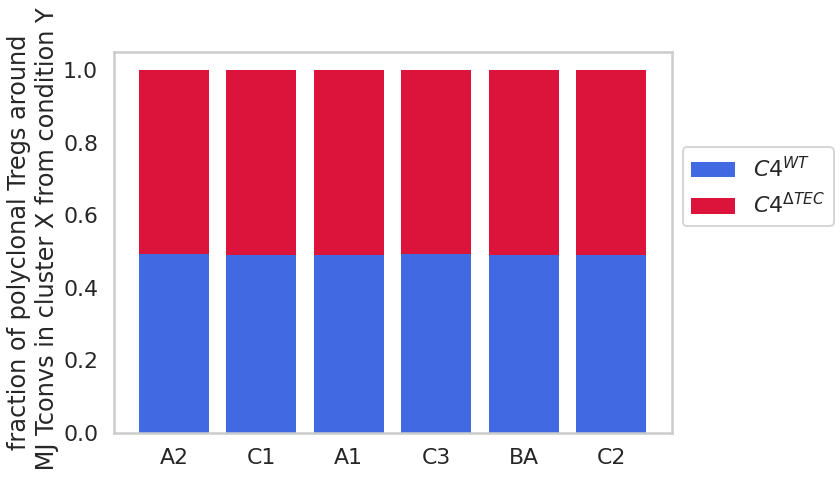

In [159]:
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)
print(np.mean(null_shuffles1,0))
print(1-np.mean(null_shuffles1,0))
ax.bar(np.arange(0,len(temp_markers)),np.mean(null_shuffles1,0), color = 'royalblue', label = r'$C4^{WT}$', edgecolor='None')
ax.bar(np.arange(0,len(temp_markers)),1-np.mean(null_shuffles1,0), color='crimson', label=r'$C4^{\Delta TEC}$',edgecolor='None', bottom = np.mean(null_shuffles1,0))

ax.set_xticks(np.arange(0,len(temp_markers)))
ax.set_xticklabels(temp_markers)

ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)
ax.set_ylabel("fraction of polyclonal Tregs around\n MJ Tconvs in cluster X from condition Y")

print(np.sum(tempdf_treg['treatment']=='WT')/len(tempdf_treg))

actual1 = []

for j in range(len(temp_markers)):
    actual1.append(np.sum(np.array(tempdf_treg['treatment']=="WT")*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['cluster']==temp_markers[j])))

print(len(tempdf_treg))
print(actual1)
print('alpha = ', 0.05/6)
for i in range(len(temp_markers)):
    r1 = np.sum(null_shuffles1[:,i] >= actual1[i])
    r2 = np.sum(1-null_shuffles1[:,i] >= 1-actual1[i])
    print(temp_markers[i], (r1+1)/(niter+1), (r2+1)/(niter+1),np.log2(actual1[i]/np.mean(null_shuffles1[:,i])),np.log2((1-actual1[i])/(1-np.mean(null_shuffles1[:,i]))))

pass #plt.savefig("",bbox_inches='tight')

[0.2337579617834395, 0.5191082802547771, 0.02165605095541401, 0.07579617834394904, 0.033121019108280254, 0.11656050955414013]
[0.13784615384615384, 0.003076923076923077, 0.17846153846153845, 0.13107692307692306, 0.3292307692307692, 0.22030769230769232]
3195
alpha =  0.004166666666666667
A2 WT over enrichment 0.002 under enrichment 1.0 0.3351782529118961 -0.42186847580808234
C1 WT over enrichment 0.002 under enrichment 1.0 1.0173624061350273 -6.383271417295761
A1 WT over enrichment 1.0 under enrichment 0.002 -2.227328116595598 0.8154278869179011
C3 WT over enrichment 1.0 under enrichment 0.002 -0.4592571217428263 0.3390059307914786
BA WT over enrichment 1.0 under enrichment 0.002 -2.469826561899269 0.8397222066372896
C2 WT over enrichment 1.0 under enrichment 0.002 -0.5372765124251659 0.37830085764349836


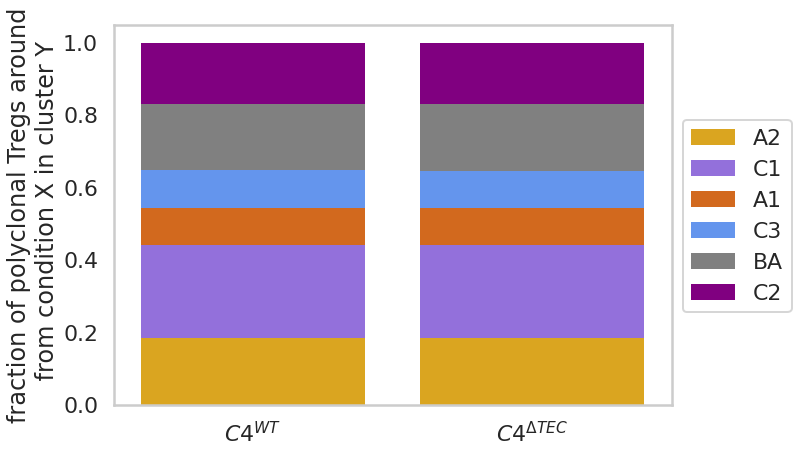

In [160]:
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)

tempWT_list = np.mean(null_shuffles2[:,:,0],0)
tempdTEC_list = np.mean(null_shuffles2[:,:,1],0)

ax.bar(1,tempWT_list[0], color=temp_colors[0], edgecolor='None')
ax.bar(2,tempdTEC_list[0], label=temp_markers[0], color=temp_colors[0], edgecolor='None')

for i in range(1,len(temp_markers)):
       bottomWT = 0
       bottomdTEC = 0
       for j in range(0,i):
              bottomWT += tempWT_list[j]
              bottomdTEC += tempdTEC_list[j]
       ax.bar(1,tempWT_list[i], bottom=bottomWT,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None' )
       ax.bar(2,tempdTEC_list[i], bottom=bottomdTEC,
              color = temp_colors[i], edgecolor='None' )

ax.set_xlim([0.5,2.5])

ax.set_xticks([1,2])
ax.set_xticklabels([r'$C4^{WT}$', '$C4^{\Delta TEC}$'])
ax.set_ylabel("fraction of polyclonal Tregs around\n from condition X in cluster Y")


ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)

actual2wt = []
actual2dtec = []
for j in range(len(temp_markers)):
       actual2wt.append(np.sum(np.array(tempdf_treg['treatment']=="WT")*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['treatment']=="WT")))
       actual2dtec.append(np.sum(np.array(tempdf_treg['treatment']=="dTEC")*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['treatment']=="dTEC")))

print(actual2wt)
print(actual2dtec)
print(len(tempdf_treg))
print("alpha = ",.05/12)
for i in range(len(temp_markers)):
    rwt1 = np.sum(null_shuffles2[:,i,0] >= actual2wt[i])
    rwt2 = np.sum(null_shuffles2[:,i,0] <= actual2wt[i])
    rdtec1 =  np.sum(null_shuffles2[:,i,1] >= actual2dtec[i])
    rdtec2 =  np.sum(null_shuffles2[:,i,1] <= actual2dtec[i])
    print(temp_markers[i], "WT", "over enrichment", (rwt1+1)/(niter+1),  "under enrichment", (rwt2+1)/(niter+1), np.log2(actual2wt[i]/np.mean(null_shuffles2[:,i,0])), np.log2(actual2dtec[i]/np.mean(null_shuffles2[:,i,1])) )

pass #plt.savefig("",bbox_inches='tight')

In [161]:
# shuffle labels on majority vote tconvs to create null model for cluster proportions to then statistically compare observed proportions

niter = 499
temp_markers = ["A2", "C1", "A1", "C3", "BA", "C2"]
temp_colors =  ["goldenrod", "mediumpurple", "chocolate", "cornflowerblue", "grey","purple"]
null_shuffles1 = np.zeros([niter, len(temp_markers)])
null_shuffles2 = np.zeros([niter, len(temp_markers),2])

sind = 0
for iter in range(niter):
    old_labels = np.asarray(tempdf_tconv['treatment'])
    idx = np.random.permutation(len(tempdf_tconv))
    new_labels = old_labels[idx]
    # shuffle 
    for j in range(len(temp_markers)):
        null_shuffles1[iter, j] = np.sum(np.array(new_labels=="WT")*np.array(tempdf_tconv['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_tconv['cluster']==temp_markers[j]))
        null_shuffles2[iter, j, 0] = np.sum(np.array(new_labels=="WT")*np.array(tempdf_tconv['cluster']==temp_markers[j]))/np.sum(np.array(new_labels=="WT"))
        null_shuffles2[iter, j, 1] = np.sum(np.array(new_labels=="dTEC")*np.array(tempdf_tconv['cluster']==temp_markers[j]))/np.sum(np.array(new_labels=="dTEC"))

270
[0.3170731707317073, 0.5121951219512195, 0.024390243902439025, 0.056910569105691054, 0.04065040650406504, 0.04878048780487805]
[0.17006802721088435, 0.0, 0.14285714285714285, 0.10204081632653061, 0.4489795918367347, 0.1360544217687075]
alpha =  0.004166666666666667
A2 WT over enrichment 0.002 under enrichment 1.0 0.42931668476706536 -0.4869954676736833
C1 WT over enrichment 0.002 under enrichment 1.0 1.125393213775067 -inf
A1 WT over enrichment 1.0 under enrichment 0.004 -1.8686751541411664 0.6869932292271257
C3 WT over enrichment 0.952 under enrichment 0.102 -0.5372345211946118 0.341088317371591
BA WT over enrichment 1.0 under enrichment 0.002 -2.690038573269598 0.768885385370635
C2 WT over enrichment 0.996 under enrichment 0.012 -0.9732511375929157 0.4920338059235592


/tmp/ipykernel_23715/2843626099.py:46: RuntimeWarning: divide by zero encountered in log2
  print(temp_markers[i], "WT", "over enrichment", (rwt1+1)/(niter+1),  "under enrichment", (rwt2+1)/(niter+1), np.log2(actual2wt[i]/np.mean(null_shuffles2[:,i,0])), np.log2(actual2dtec[i]/np.mean(null_shuffles2[:,i,1])) )


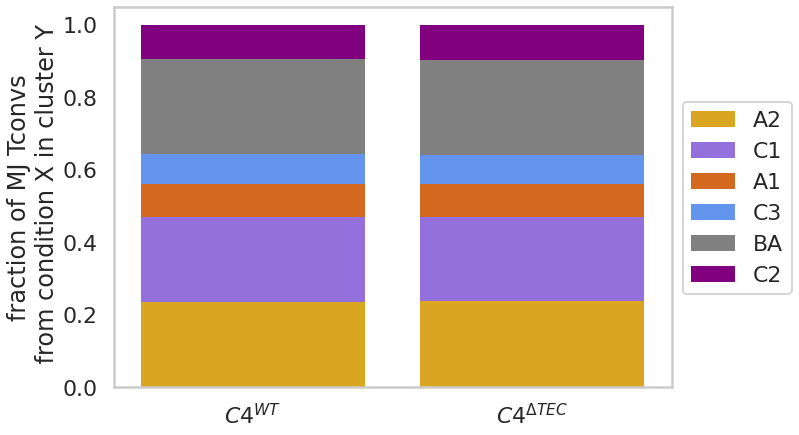

In [162]:
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)


tempWT_list = np.mean(null_shuffles2[:,:,0],0)
tempdTEC_list = np.mean(null_shuffles2[:,:,1],0)

ax.bar(1,tempWT_list[0], color=temp_colors[0], edgecolor='None')
ax.bar(2,tempdTEC_list[0], label=temp_markers[0], color=temp_colors[0], edgecolor='None')

for i in range(1,len(temp_markers)):
       bottomWT = 0
       bottomdTEC = 0
       for j in range(0,i):
              bottomWT += tempWT_list[j]
              bottomdTEC += tempdTEC_list[j]
       ax.bar(1,tempWT_list[i], bottom=bottomWT,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None' )
       ax.bar(2,tempdTEC_list[i], bottom=bottomdTEC,
              color = temp_colors[i], edgecolor='None' )

ax.set_xlim([0.5,2.5])

ax.set_xticks([1,2])
ax.set_xticklabels([r'$C4^{WT}$', '$C4^{\Delta TEC}$'])
ax.set_ylabel("fraction of MJ Tconvs\n from condition X in cluster Y")


ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)

actual2wt = []
actual2dtec = []
for j in range(len(temp_markers)):
       actual2wt.append(np.sum(np.array(tempdf_tconv['treatment']=="WT")*np.array(tempdf_tconv['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_tconv['treatment']=="WT")))
       actual2dtec.append(np.sum(np.array(tempdf_tconv['treatment']=="dTEC")*np.array(tempdf_tconv['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_tconv['treatment']=="dTEC")))

print(len(tempdf_tconv))
print(actual2wt)
print(actual2dtec)
print("alpha = ",.05/12)
for i in range(len(temp_markers)):
    rwt1 = np.sum(null_shuffles2[:,i,0] >= actual2wt[i])
    rwt2 = np.sum(null_shuffles2[:,i,0] <= actual2wt[i])
    rdtec1 =  np.sum(null_shuffles2[:,i,1] >= actual2dtec[i])
    rdtec2 =  np.sum(null_shuffles2[:,i,1] <= actual2dtec[i])
    print(temp_markers[i], "WT", "over enrichment", (rwt1+1)/(niter+1),  "under enrichment", (rwt2+1)/(niter+1), np.log2(actual2wt[i]/np.mean(null_shuffles2[:,i,0])), np.log2(actual2dtec[i]/np.mean(null_shuffles2[:,i,1])) )

pass #plt.savefig("",bbox_inches='tight')

[0.45253006 0.45837707 0.45649633 0.46174167 0.45445821 0.45305997]
[0.54746994 0.54162293 0.54350367 0.53825833 0.54554179 0.54694003]
0.45555555555555555
270
[0.609375, 1.0, 0.125, 0.3181818181818182, 0.07042253521126761, 0.23076923076923078]
alpha =  0.008333333333333333
A2 0.002 1.0 0.42931668476706536 -0.48699546767368374
C1 0.002 1.0 1.125393213775067 -inf
A1 1.0 0.004 -1.8686751541411666 0.6869932292271256
C3 0.952 0.102 -0.5372345211946118 0.341088317371591
BA 1.0 0.002 -2.690038573269598 0.7688853853706352
C2 0.996 0.012 -0.973251137592916 0.4920338059235588


/tmp/ipykernel_23715/50810436.py:28: RuntimeWarning: divide by zero encountered in log2
  print(temp_markers[i], (r1+1)/(niter+1), (r2+1)/(niter+1),np.log2(actual1[i]/np.mean(null_shuffles1[:,i])),np.log2((1-actual1[i])/(1-np.mean(null_shuffles1[:,i]))))


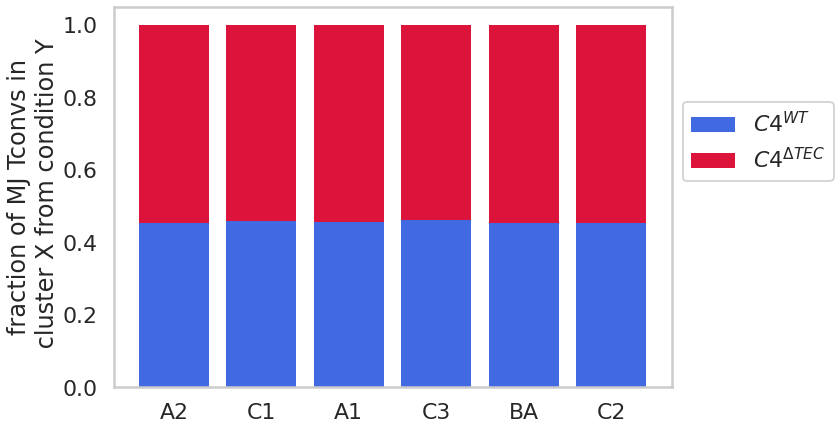

In [163]:
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)
print(np.mean(null_shuffles1,0))
print(1-np.mean(null_shuffles1,0))
ax.bar(np.arange(0,len(temp_markers)),np.mean(null_shuffles1,0), color = 'royalblue', label = r'$C4^{WT}$', edgecolor='None')
ax.bar(np.arange(0,len(temp_markers)),1-np.mean(null_shuffles1,0), color='crimson', label=r'$C4^{\Delta TEC}$',edgecolor='None', bottom = np.mean(null_shuffles1,0))

ax.set_xticks(np.arange(0,len(temp_markers)))
ax.set_xticklabels(temp_markers)

ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)
ax.set_ylabel("fraction of MJ Tconvs in\n cluster X from condition Y")

print(np.sum(tempdf_tconv['treatment']=='WT')/len(tempdf_tconv))

actual1 = []

for j in range(len(temp_markers)):
    actual1.append(np.sum(np.array(tempdf_tconv['treatment']=="WT")*np.array(tempdf_tconv['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_tconv['cluster']==temp_markers[j])))


print(len(tempdf_tconv))
print(actual1)
print('alpha = ', 0.05/6)
for i in range(len(temp_markers)):
    r1 = np.sum(null_shuffles1[:,i] >= actual1[i])
    r2 = np.sum(1-null_shuffles1[:,i] >= 1-actual1[i])
    print(temp_markers[i], (r1+1)/(niter+1), (r2+1)/(niter+1),np.log2(actual1[i]/np.mean(null_shuffles1[:,i])),np.log2((1-actual1[i])/(1-np.mean(null_shuffles1[:,i]))))


pass #plt.savefig("",bbox_inches='tight')

In [164]:
cond = "WT"
tempWT_list = []

temp_markers = ["A2", "C1", "A1", "C3", "BA", "C2"]
temp_colors =  ["goldenrod", "mediumpurple", "chocolate", "cornflowerblue", "grey","purple"]

for j in range(len(temp_markers)):
    tempWT_list.append(np.sum(np.array(tempdf_treg['treatment']==cond)*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['cluster']==temp_markers[j])))
    
cond = "dTEC"
tempdTEC_list = []
for j in range(len(temp_markers)):
    tempdTEC_list.append(np.sum(np.array(tempdf_treg['treatment']==cond)*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['cluster']==temp_markers[j])))

[0.6209813874788495, 0.9939024390243902, 0.10493827160493827, 0.35843373493975905, 0.08858603066439523, 0.33826247689463956]
[0.3790186125211506, 0.006097560975609756, 0.8950617283950617, 0.641566265060241, 0.9114139693356048, 0.6617375231053605]


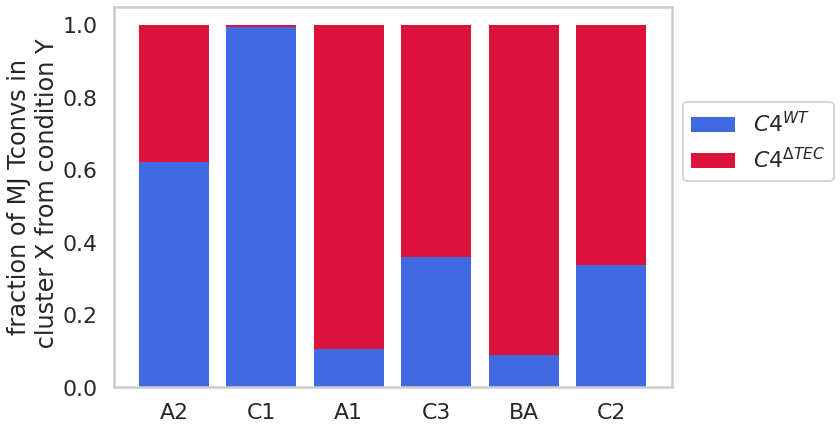

In [165]:
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)
print(tempWT_list)
print(tempdTEC_list)
ax.bar(np.arange(0,len(temp_markers)),tempWT_list, color = 'royalblue', label = r'$C4^{WT}$', edgecolor='None')
ax.bar(np.arange(0,len(temp_markers)),tempdTEC_list, color='crimson', label=r'$C4^{\Delta TEC}$',edgecolor='None', bottom = tempWT_list)

ax.set_xticks(np.arange(0,len(temp_markers)))
ax.set_xticklabels(temp_markers)

ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)
ax.set_ylabel("fraction of MJ Tconvs in\n cluster X from condition Y")

pass #plt.savefig("",bbox_inches='tight')


In [166]:
temp_markers = ["A2", "C1", "A1", "C3", "BA", "C2"][::-1]
temp_colors =  ["goldenrod", "mediumpurple", "chocolate","cornflowerblue", "grey","purple"][::-1]


cond = "WT"
tempWT_list = []
for j in range(len(temp_markers)):
    tempWT_list.append(np.sum(np.array(tempdf_treg['treatment']==cond)*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['treatment']==cond)))
    
cond = "dTEC"
tempdTEC_list = []
for j in range(len(temp_markers)):
    tempdTEC_list.append(np.sum(np.array(tempdf_treg['treatment']==cond)*np.array(tempdf_treg['cluster']==temp_markers[j]))/np.sum(np.array(tempdf_treg['treatment']==cond)))

[0.11656050955414013, 0.033121019108280254, 0.07579617834394904, 0.02165605095541401, 0.5191082802547771, 0.2337579617834395]
[0.22030769230769232, 0.3292307692307692, 0.13107692307692306, 0.17846153846153845, 0.003076923076923077, 0.13784615384615384]


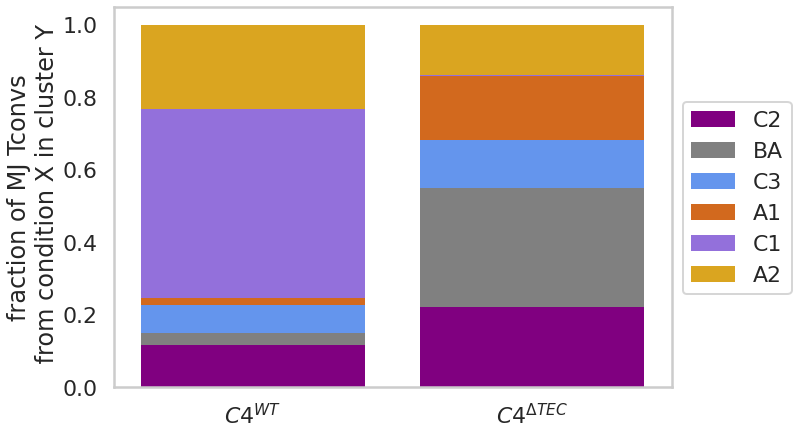

In [167]:
fig, ax = plt.subplots(figsize=(10,7))
plt.grid(False)
print(tempWT_list)
print(tempdTEC_list)

ax.bar(1,tempWT_list[0], color=temp_colors[0], edgecolor='None')
ax.bar(2,tempdTEC_list[0], label=temp_markers[0], color=temp_colors[0], edgecolor='None')

for i in range(1,len(temp_markers)):
       bottomWT = 0
       bottomdTEC = 0
       for j in range(0,i):
              bottomWT += tempWT_list[j]
              bottomdTEC += tempdTEC_list[j]
       ax.bar(1,tempWT_list[i], bottom=bottomWT,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None' )
       ax.bar(2,tempdTEC_list[i], bottom=bottomdTEC,
              color = temp_colors[i], edgecolor='None' )

ax.set_xlim([0.5,2.5])

ax.set_xticks([1,2])
ax.set_xticklabels([r'$C4^{WT}$', '$C4^{\Delta TEC}$'])
ax.set_ylabel("fraction of MJ Tconvs\n from condition X in cluster Y")


ax.legend(bbox_to_anchor=(1.02, 0.75), loc='upper left', borderaxespad=0)

pass #plt.savefig("",bbox_inches='tight')

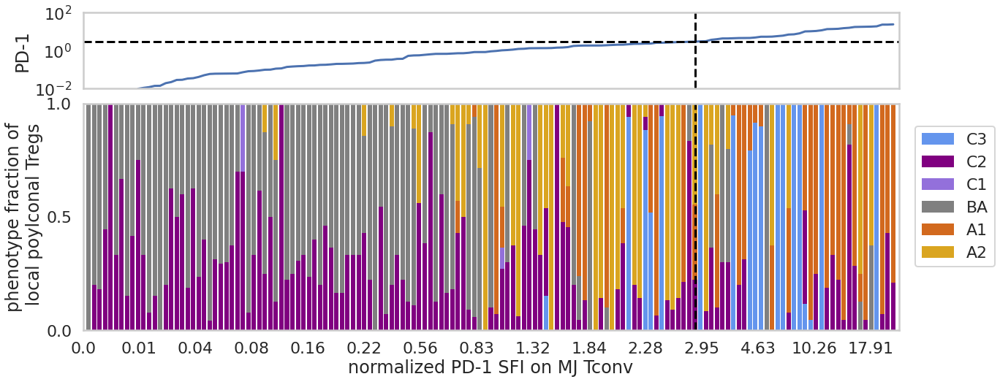

In [256]:
fig, (ax1,ax) = plt.subplots(2,figsize=(20,8),gridspec_kw={'height_ratios': [1, 3]})
plt.grid(False)

tempWT_tconv = tempdf_tconv.loc[tempdf_tconv["treatment"]=="dTEC",]
tempWT_tconv = tempWT_tconv.sort_values(by = "PD-1 SFI norm (MJ Tconv)")
tempWT_tconv.index = np.arange(len(tempWT_tconv))

temp_markers = ["C3","C2", "C1", "BA", "A1", "A2",]
temp_colors =  ["cornflowerblue", "purple", "mediumpurple","grey", "chocolate","goldenrod"]

ax.bar(tempWT_tconv.index, tempWT_tconv["Treg " +temp_markers[0]], label=temp_markers[0], color=temp_colors[0], edgecolor='None')
for i in range(1,len(temp_markers)):
       bottom = np.zeros(len(tempWT_tconv))
       for j in range(0,i):
              bottom += np.array(tempWT_tconv["Treg " +temp_markers[j]])
       ax.bar(tempWT_tconv.index, tempWT_tconv["Treg " +temp_markers[i]], bottom=bottom,
              label=temp_markers[i], color = temp_colors[i], edgecolor='None' )

ax.set_xlim([-1,len(tempWT_tconv)])

ax.set_xticks(np.linspace(-1,len(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])+1,len(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"]))[0::10])
ax.set_xticklabels(np.round(np.array(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])[0::10],2))
ax.set_xlabel("normalized PD-1 SFI on MJ Tconv")
ax.set_ylabel("phenotype fraction of\n local poylconal Tregs")
ax.axvline(np.argsort(np.abs(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")

ax.legend(bbox_to_anchor=(1.02, 0.9), loc='upper left', borderaxespad=0)

ax.set_yticks([0,0.5,1])

ax1.grid(False)
ax1.plot(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"])
#plt.xlabel("normalized Ki67 SFI on MJ Tconv index")
#plt.ylabel("normalized Ki67 SFI on MJ Tconv")
ax1.set_ylabel("PD-1")
ax1.set_ylim([1e-2,100])
ax1.set_yscale('log')
ax1.axvline(np.argsort(np.abs(tempWT_tconv["PD-1 SFI norm (MJ Tconv)"] -3))[0], c="black", linestyle="--")
ax1.axhline([3], c="black", linestyle="--")


ax1.set_xlim([-1,len(tempWT_tconv)])
ax1.set_xticks([])

plt.subplots_adjust(wspace=0, hspace=0.1)

pass #plt.savefig("",bbox_inches='tight')

In [257]:
import matplotlib
import matplotlib.colors as mcolors
tcols = ["Treg A1", "Treg A2", "Treg BA", "Treg C1", "Treg C2", "Treg C3"]
td= tempdf_tconv[tcols]
max_identity = []
for i in range(len(td)):
    max_identity.append(tcols[np.argmax(np.array(td.iloc[i,:]))])    

/tmp/ipykernel_23715/904581709.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(sc,label = "local MJ Tregs %", ticks = [10,20], norm=matplotlib.colors.LogNorm())


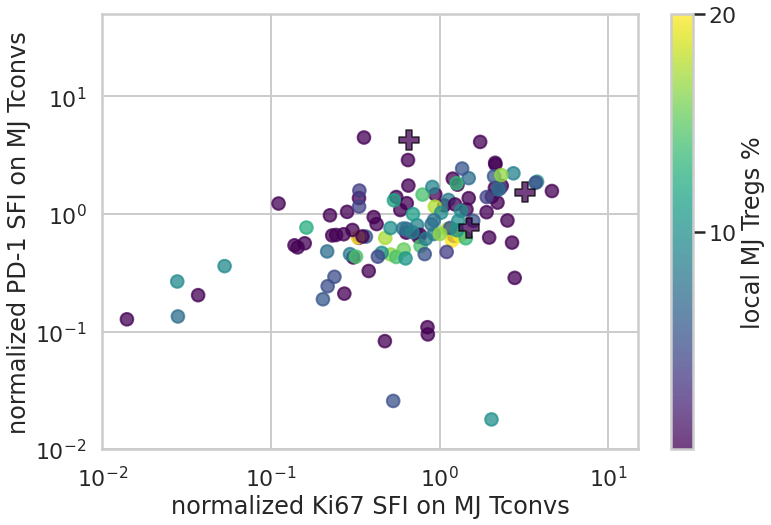

In [258]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
sscale = 160
ax.set_xlabel(None); ax.set_ylabel(None)
tx = "WT"

sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv)'],c = 100*tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx), 'local MJ Treg #']/tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'local MJ Treg + polyclonal Treg #'],cmap = 'viridis', vmax = 20,s = sscale, alpha = 0.75)
ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv)'],s = 2.5*sscale, marker='P', edgecolor='black', linewidth=1.5,c = 100*tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx), 'local MJ Treg #']/tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'local MJ Treg + polyclonal Treg #'],cmap = 'viridis', vmax = 20,alpha = 0.75)
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv)'],s = 1.5*sscale,  edgecolor='black', linewidth=1.5,c = 100*tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx), 'local MJ Treg #']/tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'local MJ Treg + polyclonal Treg #'],cmap = 'viridis', vmax = 20,alpha = 0.75)

cbar = plt.colorbar(sc,label = "local MJ Tregs %", ticks = [10,20], norm=matplotlib.colors.LogNorm())
cbar.ax.set_yticklabels(["10","20"])

plt.xscale('log'); plt.yscale('log')

plt.xlim([10**-2, 15]); plt.ylim([10**-2, 50])

ax.set_xlabel("normalized Ki67 SFI on MJ Tconvs")

ax.set_ylabel("normalized PD-1 SFI on MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

In [293]:
import statsmodels.formula.api as smf

tx = "WT"

xt = np.log10(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'])
yt = np.log10(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'])
yt[-np.inf==yt] = np.min(yt[-np.inf!=yt])
xt[-np.inf==xt] = np.min(xt[-np.inf!=xt])

temp_ind = np.argsort(xt)
xt = xt.iloc[temp_ind]
yt = yt.iloc[temp_ind]


temp = pd.DataFrame({"x":xt, 'y':yt})

#slope, intercept, r_value, p_value, std_err = stats.linregress(np.asarray(xt),np.asarray(yt))
#ci = 2.58 *std_err

model = smf.ols('y ~ x', temp)
results = model.fit()

alpha = .10

predictions = results.get_prediction(temp).summary_frame(alpha)

x = np.linspace(-4, 3)
y = results.params.Intercept + results.params.x*x

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


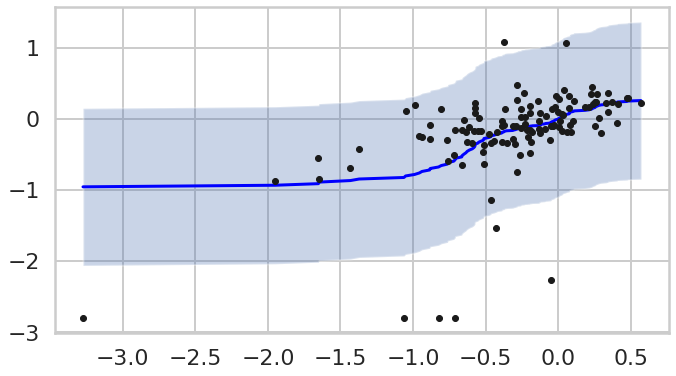

In [296]:
from tsmoothie.smoother import *
tx = "WT"

xt = np.log10(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'])
yt = np.log10(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'])
yt[-np.inf==yt] = np.min(yt[-np.inf!=yt])
xt[-np.inf==xt] = np.min(xt[-np.inf!=xt])

temp_ind = np.argsort(xt)
xt = xt.iloc[temp_ind]
yt = yt.iloc[temp_ind]

# operate smoothing
smoother = LowessSmoother(smooth_fraction=0.5, iterations=1)
smoother.smooth(np.asarray(yt))

# generate intervals
low, up = smoother.get_intervals('prediction_interval', confidence=0.05)

# plot the first smoothed timeseries with intervals
plt.figure(figsize=(11,6))
plt.plot(xt, smoother.smooth_data[0], linewidth=3, color='blue')
plt.plot(xt, yt, '.k')
plt.fill_between(xt, low[0], up[0], alpha=0.3)


/tmp/ipykernel_23715/453998327.py:18: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")


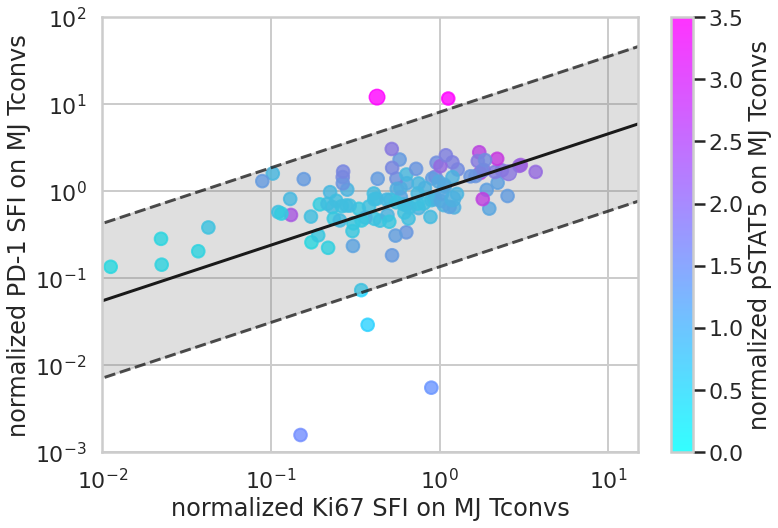

In [294]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
sscale = 160
ax.set_xlabel(None); ax.set_ylabel(None)
tx = "WT"
#ax.scatter(tempdf_tconv.loc[tempdf_tconv['cluster']!='A1', 'PD-1 SFI norm (MJ Tconv)'], tempdf_tconv.loc[tempdf_tconv['cluster']!='A1','Ki67 SFI norm (MJ Tconv)'],c = 'grey', alpha = 0.2, s = sscale)
mapkey = {"Treg A1": "chocolate", "Treg A2": "goldenrod", "Treg C1": "mediumpurple", "Treg C2":"purple",  "Treg C3":"cornflowerblue", "Treg BA": "grey"}
tcol = pd.DataFrame(np.array(max_identity))[0].map(mapkey)
#sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = sscale, alpha = 0.8)
sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = sscale, alpha = 0.8, vmax=3.5, vmin=0, cmap='cool')
#ax.plot(np.arange(1e-1,10),np.arange(1e-1,10),'--', c= 'k')
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 2.5*sscale, marker='P', alpha = 0.8, edgecolor='black', linewidth=1.5)
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 1.5*sscale, alpha = 0.8, edgecolor='black', linewidth=1.5)
ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = 1.5*sscale, alpha = 0.8, linewidth=1.5, vmax=3.5, vmin=0, cmap='cool')


plt.xscale('log'); plt.yscale('log')
plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")
#cmap, norm = mcolors.from_levels_and_colors(range(7), ["chocolate","goldenrod","grey","mediumpurple", "purple", "cornflowerblue"])
#sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
#sm.set_array([])
#cbar = plt.colorbar(sm, ticks = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
#cbar.ax.set_yticklabels(["A1", "A2", "BA", "C1", "C2", "C3"])
plt.xlim([10**-2, 15]); plt.ylim([10**-3, 100])
#plt.plot(np.logspace(-4, 2), np.logspace(-4, 2), linestyle='--', color='k')
plt.plot(10**x,10**y, color='k')
#ax.fill_between(np.exp(x), np.exp(y-ci), np.exp(y+ci), color='grey', alpha=.5)
prediction_interval = np.mean(predictions['obs_ci_upper']-predictions['obs_ci_lower'])
plt.fill_between(10**x, 10**(y-prediction_interval/2),10**(y+prediction_interval/2), alpha=.25, label='Prediction interval', color='grey')
plt.plot(10**x,10**(y-prediction_interval/2),linestyle='--', color='k', alpha=0.75)
plt.plot(10**x,10**(y+prediction_interval/2),linestyle='--', color='k', alpha =0.75)


ax.set_xlabel("normalized Ki67 SFI on MJ Tconvs")

ax.set_ylabel("normalized PD-1 SFI on MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/803873740.py:18: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")


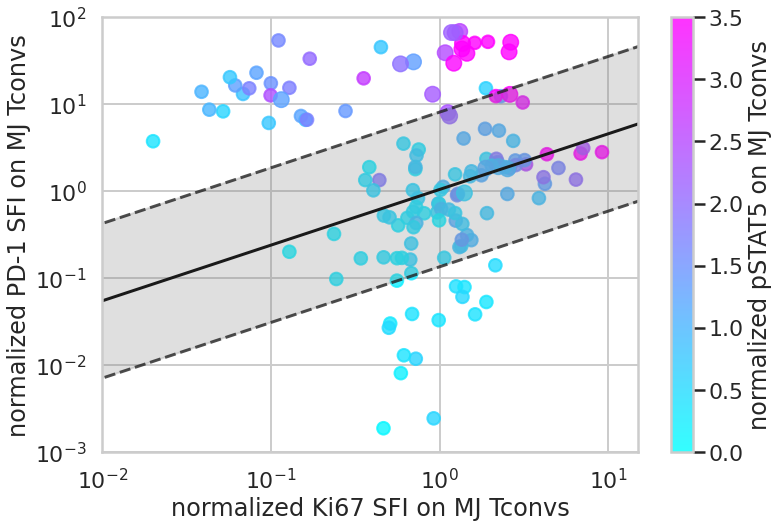

In [295]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
sscale = 160
ax.set_xlabel(None); ax.set_ylabel(None)
tx = "dTEC"
#ax.scatter(tempdf_tconv.loc[tempdf_tconv['cluster']!='A1', 'PD-1 SFI norm (MJ Tconv)'], tempdf_tconv.loc[tempdf_tconv['cluster']!='A1','Ki67 SFI norm (MJ Tconv)'],c = 'grey', alpha = 0.2, s = sscale)
mapkey = {"Treg A1": "chocolate", "Treg A2": "goldenrod", "Treg C1": "mediumpurple", "Treg C2":"purple",  "Treg C3":"cornflowerblue", "Treg BA": "grey"}
tcol = pd.DataFrame(np.array(max_identity))[0].map(mapkey)
#sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = sscale, alpha = 0.8)
sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = sscale, alpha = 0.8, vmax=3.5, vmin=0, cmap='cool')
#ax.plot(np.arange(1e-1,10),np.arange(1e-1,10),'--', c= 'k')
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 2.5*sscale, marker='P', alpha = 0.8, edgecolor='black', linewidth=1.5)
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 1.5*sscale, alpha = 0.8, edgecolor='black', linewidth=1.5)
ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = 1.5*sscale, alpha = 0.8, linewidth=1.5, vmax=3.5, vmin=0, cmap='cool')


plt.xscale('log'); plt.yscale('log')
plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")
#cmap, norm = mcolors.from_levels_and_colors(range(7), ["chocolate","goldenrod","grey","mediumpurple", "purple", "cornflowerblue"])
#sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
#sm.set_array([])
#cbar = plt.colorbar(sm, ticks = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
#cbar.ax.set_yticklabels(["A1", "A2", "BA", "C1", "C2", "C3"])
plt.xlim([10**-2, 15]); plt.ylim([10**-3, 100])
#plt.plot(np.logspace(-4, 2), np.logspace(-4, 2), linestyle='--', color='k')
plt.plot(10**x,10**y, color='k')
#ax.fill_between(np.exp(x), np.exp(y-ci), np.exp(y+ci), color='grey', alpha=.5)
prediction_interval = np.mean(predictions['obs_ci_upper']-predictions['obs_ci_lower'])
plt.fill_between(10**x, 10**(y-prediction_interval/2),10**(y+prediction_interval/2), alpha=.25, label='Prediction interval', color='grey')
plt.plot(10**x,10**(y-prediction_interval/2),linestyle='--', color='k', alpha=0.75)
plt.plot(10**x,10**(y+prediction_interval/2),linestyle='--', color='k', alpha =0.75)


ax.set_xlabel("normalized Ki67 SFI on MJ Tconvs")

ax.set_ylabel("normalized PD-1 SFI on MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

In [297]:
import scipy
f = scipy.interpolate.interp1d(xt, smoother.smooth_data[0], fill_value='extrapolate')
flow = scipy.interpolate.interp1d(xt, low[0], fill_value='extrapolate')
fup = scipy.interpolate.interp1d(xt, up[0], fill_value='extrapolate')

/tmp/ipykernel_23715/1175561971.py:17: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")


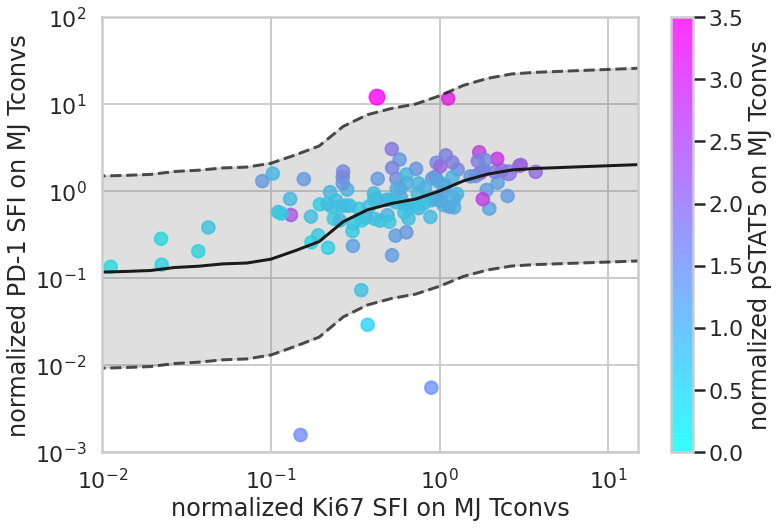

In [298]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
sscale = 160
ax.set_xlabel(None); ax.set_ylabel(None)
tx = "WT"
#ax.scatter(tempdf_tconv.loc[tempdf_tconv['cluster']!='A1', 'PD-1 SFI norm (MJ Tconv)'], tempdf_tconv.loc[tempdf_tconv['cluster']!='A1','Ki67 SFI norm (MJ Tconv)'],c = 'grey', alpha = 0.2, s = sscale)
mapkey = {"Treg A1": "chocolate", "Treg A2": "goldenrod", "Treg C1": "mediumpurple", "Treg C2":"purple",  "Treg C3":"cornflowerblue", "Treg BA": "grey"}
tcol = pd.DataFrame(np.array(max_identity))[0].map(mapkey)
#sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = sscale, alpha = 0.8)
sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = sscale, alpha = 0.8, vmax=3.5, vmin=0, cmap='cool')
#ax.plot(np.arange(1e-1,10),np.arange(1e-1,10),'--', c= 'k')
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 1.5*sscale, alpha = 0.8, edgecolor='black', linewidth=1.5)
ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = 1.5*sscale, alpha = 0.8, linewidth=1.5, vmax=3.5, vmin=0, cmap='cool')


plt.xscale('log'); plt.yscale('log')
plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")
#cmap, norm = mcolors.from_levels_and_colors(range(7), ["chocolate","goldenrod","grey","mediumpurple", "purple", "cornflowerblue"])
#sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
#sm.set_array([])
#cbar = plt.colorbar(sm, ticks = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
#cbar.ax.set_yticklabels(["A1", "A2", "BA", "C1", "C2", "C3"])
plt.xlim([10**-2, 15]); plt.ylim([10**-3, 100])
#plt.plot(np.logspace(-4, 2), np.logspace(-4, 2), linestyle='--', color='k')
plt.plot(10**x, 10**f(x), linewidth=3, color='k')
plt.fill_between(10**x, 10**flow(x), 10**fup(x), alpha=.25, label='Prediction interval', color='grey')
plt.plot(10**x,10**flow(x),linestyle='--', color='k', alpha=0.75)
plt.plot(10**x,10**fup(x),linestyle='--', color='k', alpha =0.75)

ax.set_xlabel("normalized Ki67 SFI on MJ Tconvs")

ax.set_ylabel("normalized PD-1 SFI on MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/776188503.py:17: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")


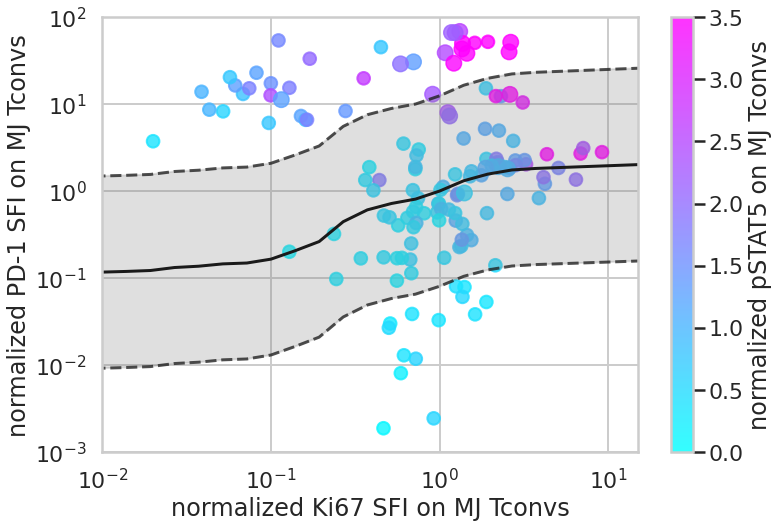

In [299]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
sscale = 160
ax.set_xlabel(None); ax.set_ylabel(None)
tx = "dTEC"
#ax.scatter(tempdf_tconv.loc[tempdf_tconv['cluster']!='A1', 'PD-1 SFI norm (MJ Tconv)'], tempdf_tconv.loc[tempdf_tconv['cluster']!='A1','Ki67 SFI norm (MJ Tconv)'],c = 'grey', alpha = 0.2, s = sscale)
mapkey = {"Treg A1": "chocolate", "Treg A2": "goldenrod", "Treg C1": "mediumpurple", "Treg C2":"purple",  "Treg C3":"cornflowerblue", "Treg BA": "grey"}
tcol = pd.DataFrame(np.array(max_identity))[0].map(mapkey)
#sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = sscale, alpha = 0.8)
sc = ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']!='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = sscale, alpha = 0.8, vmax=3.5, vmin=0, cmap='cool')
#ax.plot(np.arange(1e-1,10),np.arange(1e-1,10),'--', c= 'k')
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 1.5*sscale, alpha = 0.8, edgecolor='black', linewidth=1.5)
ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv + MJ Treg)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv + MJ Treg)'],c =tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'pSTAT5 SFI norm (MJ Tconv + MJ Treg)'],s = 1.5*sscale, alpha = 0.8, linewidth=1.5, vmax=3.5, vmin=0, cmap='cool')


plt.xscale('log'); plt.yscale('log')
plt.colorbar(sc, label="normalized pSTAT5 on MJ Tconvs")
#cmap, norm = mcolors.from_levels_and_colors(range(7), ["chocolate","goldenrod","grey","mediumpurple", "purple", "cornflowerblue"])
#sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
#sm.set_array([])
#cbar = plt.colorbar(sm, ticks = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
#cbar.ax.set_yticklabels(["A1", "A2", "BA", "C1", "C2", "C3"])
plt.xlim([10**-2, 15]); plt.ylim([10**-3, 100])
#plt.plot(np.logspace(-4, 2), np.logspace(-4, 2), linestyle='--', color='k')
plt.plot(10**x, 10**f(x), linewidth=3, color='k')
plt.fill_between(10**x, 10**flow(x), 10**fup(x), alpha=.25, label='Prediction interval', color='grey')
plt.plot(10**x,10**flow(x),linestyle='--', color='k', alpha=0.75)
plt.plot(10**x,10**fup(x),linestyle='--', color='k', alpha =0.75)

ax.set_xlabel("normalized Ki67 SFI on MJ Tconvs")

ax.set_ylabel("normalized PD-1 SFI on MJ Tconvs")

pass #plt.savefig("",bbox_inches='tight')

In [267]:
temptx = np.asarray(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']=="dTEC"),'Ki67 SFI norm (MJ Tconv + MJ Treg)'])
tempty = np.asarray(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']=="dTEC"),'PD-1 SFI norm (MJ Tconv + MJ Treg)'])

counter = 0 
for i in range(len(temptx)):
    for j in range(len(x)):
        if temptx[i]<=10**x[j]:
            tempind = j-1
            break
    if tempty[i] >= 10**flow(x[tempind]) and tempty[i] <= 10**fup(x[tempind]):
        counter += 1

In [268]:
counter/len(tempty)

0.6258503401360545

In [269]:
temptx = np.asarray(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']=="dTEC"),'Ki67 SFI norm (MJ Tconv + MJ Treg)'])
tempty = np.asarray(tempdf_tconv.loc[np.asarray(tempdf_tconv['treatment']=="dTEC"),'PD-1 SFI norm (MJ Tconv + MJ Treg)'])

counter = 0 
for i in range(len(temptx)):
    for j in range(len(x)):
        if temptx[i]<=10**x[j]:
            tempind = j-1
            break
    if tempty[i] >= 10**(y[tempind]-prediction_interval/2) and tempty[i] <= 10**(y[tempind]+prediction_interval/2):
        counter += 1

In [270]:
counter/len(tempty)

0.5918367346938775

In [ ]:
from matplotlib import colors


/tmp/ipykernel_23715/1126302655.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = plt.colorbar(sm, ticks = [0.5, 1.5])


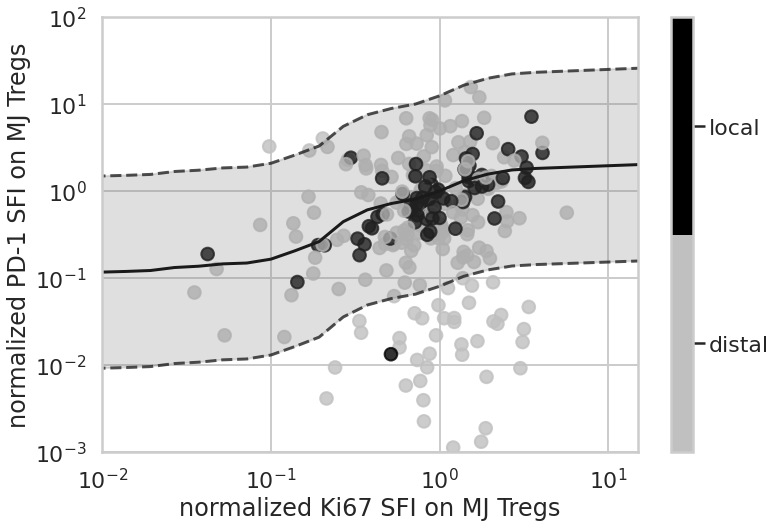

In [272]:
distal_treg = df.loc[df['cell']=="MJ Treg", "MJ Tconv index"].isnull()


fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
sscale = 160
ax.set_xlabel(None); ax.set_ylabel(None)
tx = "WT"
#ax.scatter(tempdf_tconv.loc[tempdf_tconv['cluster']!='A1', 'PD-1 SFI norm (MJ Tconv)'], tempdf_tconv.loc[tempdf_tconv['cluster']!='A1','Ki67 SFI norm (MJ Tconv)'],c = 'grey', alpha = 0.2, s = sscale)
mapkey = {True: "silver", False:"black"}
sc = ax.scatter(df.loc[df['cell']=="MJ Treg", "Ki67 SFI norm (MJ Tconv + MJ Treg)"], df.loc[df['cell']=="MJ Treg", "PD-1 SFI norm (MJ Tconv + MJ Treg)"],c =distal_treg.map(mapkey),s = sscale, alpha = 0.8)
#ax.plot(np.arange(1e-1,10),np.arange(1e-1,10),'--', c= 'k')
#ax.scatter(tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'Ki67 SFI norm (MJ Tconv)'], tempdf_tconv.loc[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx),'PD-1 SFI norm (MJ Tconv)'],c =np.asarray(tcol)[np.asarray(tempdf_tconv['cluster']=='A1') * np.asarray(tempdf_tconv['treatment']==tx)],s = 2.5*sscale, marker='P', alpha = 0.8, edgecolor='black', linewidth=1.5)
#plt.xlim([10**-1, 100]); plt.ylim([10**-2, 50])
plt.xlim([10**-2, 15]); plt.ylim([10**-3, 100])

#plt.plot(np.logspace(-4, 2), np.logspace(-4, 2), linestyle='--', color='k')
plt.plot(10**x, 10**f(x), linewidth=3, color='k')
plt.fill_between(10**x, 10**flow(x), 10**fup(x), alpha=.25, label='Prediction interval', color='grey')
plt.plot(10**x,10**flow(x),linestyle='--', color='k', alpha=0.75)
plt.plot(10**x,10**fup(x),linestyle='--', color='k', alpha =0.75)

plt.xscale('log'); plt.yscale('log')

ax.set_xlabel("normalized Ki67 SFI on MJ Tregs")

ax.set_ylabel("normalized PD-1 SFI on MJ Tregs")

cmap, norm = mcolors.from_levels_and_colors(range(3), ["silver", "black"])
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks = [0.5, 1.5])
cbar.ax.set_yticklabels(["distal", "local"])

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_23715/1609765263.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.hist2d(temp_data['PD-1 SFI norm (polyclonal Treg + MJ Treg)'],temp_data['Ki67 SFI norm (polyclonal Treg + MJ Treg)'], bins  = [np.logspace(-3,2),np.logspace(-3,2)],norm = colors.LogNorm(), cmap  = 'Greys')


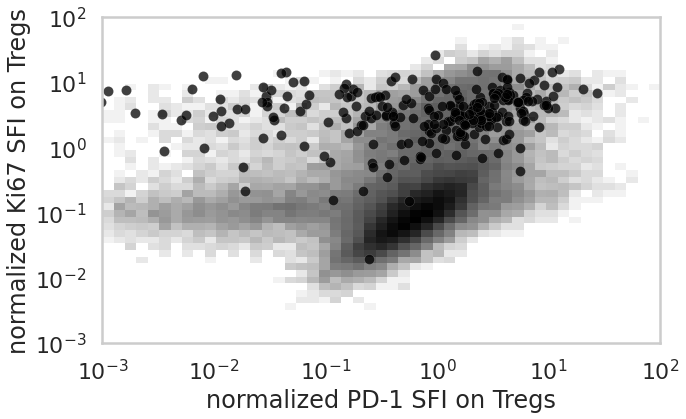

In [291]:
plt.figure(figsize=(10,6))


temp_data = df.loc[np.asarray(df['cell']=='MJ Treg') + np.asarray(df['cell']=='polyclonal Treg')]
#sns.kdeplot(temp_treg['PD-1 SFI normalized'], temp_treg['Ki67 SFI normalized'], color='grey', alpha = 0.5, shade=True, thresh=0.01)
plt.hist2d(temp_data['PD-1 SFI norm (polyclonal Treg + MJ Treg)'],temp_data['Ki67 SFI norm (polyclonal Treg + MJ Treg)'], bins  = [np.logspace(-3,2),np.logspace(-3,2)],norm = colors.LogNorm(), cmap  = 'Greys')
#sns.kdeplot(temp_data['PD-1 SFI norm (polyclonal Treg + MJ Treg)'], temp_data['Ki67 SFI norm (polyclonal Treg + MJ Treg)'], color='grey')
#plt.xscale("log"); plt.yscale('log')
#plt.colorbar()

plt.scatter(temp_data.loc[ temp_data['cell']=='MJ Treg','PD-1 SFI norm (polyclonal Treg + MJ Treg)'], temp_data.loc[ temp_data['cell']=='MJ Treg','Ki67 SFI norm (polyclonal Treg + MJ Treg)'], c='black', s=100, marker='o', alpha = 0.75, edgecolor='white', linewidth=0.15)
#plt.colorbar(label="normalized pSTAT5 SFI on Tregs")
plt.xscale("log"); plt.yscale('log')

#plt.ylim([10**-2, 20]); plt.xlim([10**-2, 110])

plt.ylabel("normalized Ki67 SFI on Tregs")

plt.xlabel("normalized PD-1 SFI on Tregs")

pass #plt.savefig("",bbox_inches='tight')

/tmp/ipykernel_11730/3517902419.py:14: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


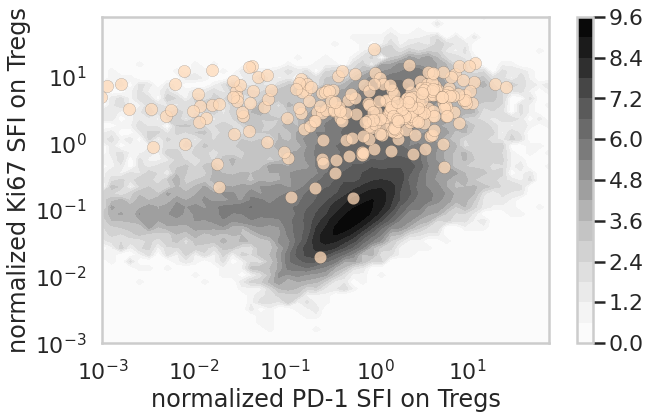

In [ ]:
plt.figure(figsize=(10,6))


temp_data = df.loc[np.asarray(df['cell']=='MJ Treg') + np.asarray(df['cell']=='polyclonal Treg')]
#sns.kdeplot(temp_treg['PD-1 SFI normalized'], temp_treg['Ki67 SFI normalized'], color='grey', alpha = 0.5, shade=True, thresh=0.01)
H, X, Y = np.histogram2d(temp_data['PD-1 SFI norm (polyclonal Treg + MJ Treg)'],temp_data['Ki67 SFI norm (polyclonal Treg + MJ Treg)'], bins  = [np.logspace(-3,2),np.logspace(-3,2)])
#sns.kdeplot(temp_data['PD-1 SFI norm (polyclonal Treg + MJ Treg)'], temp_data['Ki67 SFI norm (polyclonal Treg + MJ Treg)'], color='grey')
#plt.xscale("log"); plt.yscale('log')
#plt.colorbar()
temp = np.log2(H+1)
plt.contourf(X[:-1], Y[:-1], np.transpose(temp), 15, cmap='Greys')


plt.colorbar()
plt.scatter(temp_data.loc[ temp_data['cell']=='MJ Treg','PD-1 SFI norm (polyclonal Treg + MJ Treg)'], temp_data.loc[ temp_data['cell']=='MJ Treg','Ki67 SFI norm (polyclonal Treg + MJ Treg)'], c='peachpuff', s=150, marker='o', alpha = 0.75, edgecolor='black', linewidth=0.15)
#plt.colorbar(label="normalized pSTAT5 SFI on Tregs")
plt.xscale("log"); plt.yscale('log')

#plt.ylim([10**-2, 20]); plt.xlim([5*10**-3, 30])

plt.ylabel("normalized Ki67 SFI on Tregs")

plt.xlabel("normalized PD-1 SFI on Tregs")


plt.savefig("figs/forDave/A+D+D2_MJTconv/MJTregs_signs_of_activation/PD1.VS.Ki67.pdf",bbox_inches='tight')

In [279]:
cols = ["treatment", "Ki67 SFI norm (polyclonal Treg + MJ Treg)", "PD-1 SFI norm (polyclonal Treg + MJ Treg)", "pSTAT5 SFI norm (polyclonal Treg + MJ Treg)"]

# make new dataframe with just mjtregs near mj tconvs
tempdf_mjtreg = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="MJ Treg") * np.asarray(~df['MJ Tconv index'].isnull()),cols])
tempdf_mjtreg['condition'] = "MJ Tregs near MJ Tconvs"

# mj tregs not near mj tconvs
temp = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="MJ Treg") * np.asarray(df['MJ Tconv index'].isnull()),cols])
temp['condition'] = "MJ Tregs NOT near MJ Tconvs"
tempdf_mjtreg = tempdf_mjtreg.append(temp, ignore_index=True)

# polyclonal tregs near mj tconvs + MJ tregs 
temp = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="polyclonal Treg") * np.asarray(~df['MJ Tconv index'].isnull()),cols])
temp['condition'] = 'polyclonal Tregs near MJ Tconvs + MJ Tregs'
subsamp = np.random.randint(len(temp),size=np.sum(df['cell']=="MJ Treg"))
tempdf_mjtreg = tempdf_mjtreg.append(temp.iloc[subsamp,], ignore_index=True)

# polyclonal tregs not near mj tconvs + MJ tregs 
temp = pd.DataFrame.copy(df.loc[np.asarray(df['cell']=="polyclonal Treg") * np.asarray(~df['MJ Tconv index'].isnull()),cols])
temp['condition'] = 'polyclonal Tregs NOT near MJ Tconvs'
subsamp = np.random.randint(len(temp),size=np.sum(df['cell']=="MJ Treg"))
tempdf_mjtreg = tempdf_mjtreg.append(temp.iloc[subsamp,], ignore_index=True)

/tmp/ipykernel_23715/937865716.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tempdf_mjtreg = tempdf_mjtreg.append(temp, ignore_index=True)
/tmp/ipykernel_23715/937865716.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tempdf_mjtreg = tempdf_mjtreg.append(temp.iloc[subsamp,], ignore_index=True)
/tmp/ipykernel_23715/937865716.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tempdf_mjtreg = tempdf_mjtreg.append(temp.iloc[subsamp,], ignore_index=True)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

MJ Tregs near MJ Tconvs vs. MJ Tregs NOT near MJ Tconvs: Mann-Whitney-Wilcoxon test greater, P_val:2.377e-07 U_stat=1.382e+04
MJ Tregs near MJ Tconvs vs. polyclonal Tregs near MJ Tconvs + MJ Tregs: Mann-Whitney-Wilcoxon test greater, P_val:2.824e-27 U_stat=2.299e+04
MJ Tregs near MJ Tconvs vs. polyclonal Tregs NOT near MJ Tconvs: Mann-Whitney-Wilcoxon test greater, P_val:1.123e-26 U_stat=2.287e+04


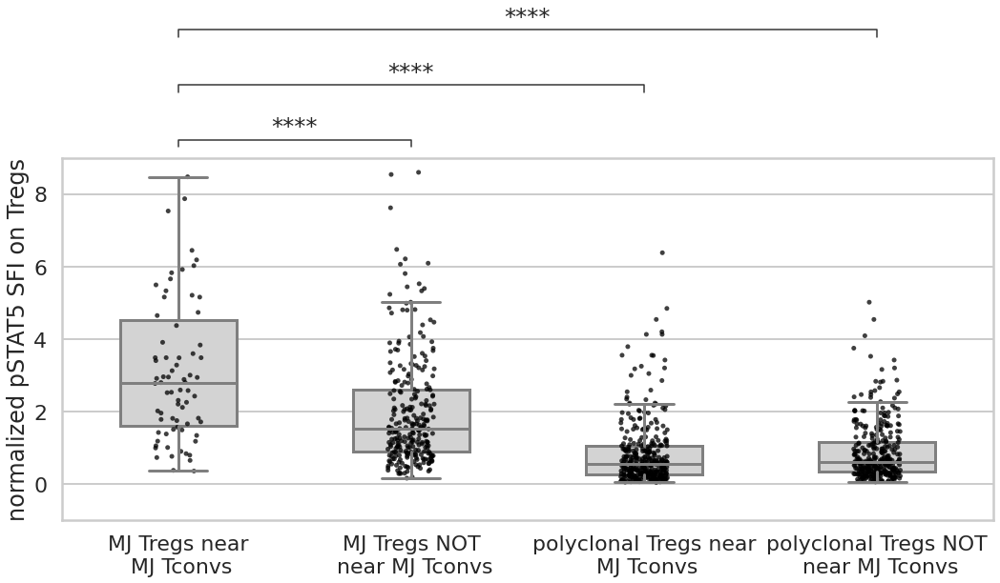

In [290]:
sns.set_context('poster')
plt.figure(figsize=(17.5,7))

temp_data = tempdf_mjtreg
x = "condition"
y = "pSTAT5 SFI norm (polyclonal Treg + MJ Treg)"
order = ('MJ Tregs near MJ Tconvs','MJ Tregs NOT near MJ Tconvs','polyclonal Tregs near MJ Tconvs + MJ Tregs', 'polyclonal Tregs NOT near MJ Tconvs')

temp_data[y + ' log2'] = np.log2(temp_data[y])
#y += ' log2'

ax = sns.boxplot(data = temp_data, x=x, y=y, color = "lightgrey", showfliers = False, order = order, width=0.5)
sns.stripplot(data = temp_data, x=x, y=y, jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order = order, alpha = 0.75)
plt.ylim([-1,9])

annotator = Annotator(
    ax,
    (('MJ Tregs near MJ Tconvs','MJ Tregs NOT near MJ Tconvs'),('MJ Tregs near MJ Tconvs','polyclonal Tregs near MJ Tconvs + MJ Tregs'), 
      ('MJ Tregs near MJ Tconvs','polyclonal Tregs NOT near MJ Tconvs')),
    order = order,
    data=temp_data,
    x=x,
    y=y)

annotator.configure(
    test="Mann-Whitney-gt",
    text_format="star",
    loc="outside",
)
annotator.apply_test(nan_policy='omit')
annotator.annotate()
plt.xlabel('')
plt.ylabel("normalized pSTAT5 SFI on Tregs")
plt.gca().set_xticklabels(('MJ Tregs near\n MJ Tconvs','MJ Tregs NOT\n near MJ Tconvs','polyclonal Tregs near\n MJ Tconvs', 'polyclonal Tregs NOT\n near MJ Tconvs')
)

pass #plt.savefig("",bbox_inches='tight')

/home/nicolepagane/anaconda3/envs/analysis/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

MJ Tregs near MJ Tconvs vs. MJ Tregs NOT near MJ Tconvs: Mann-Whitney-Wilcoxon test greater, P_val:3.818e-14 U_stat=1.564e+04
MJ Tregs near MJ Tconvs vs. polyclonal Tregs near MJ Tconvs + MJ Tregs: Mann-Whitney-Wilcoxon test greater, P_val:5.741e-27 U_stat=2.288e+04
MJ Tregs near MJ Tconvs vs. polyclonal Tregs NOT near MJ Tconvs: Mann-Whitney-Wilcoxon test greater, P_val:6.164e-25 U_stat=2.249e+04


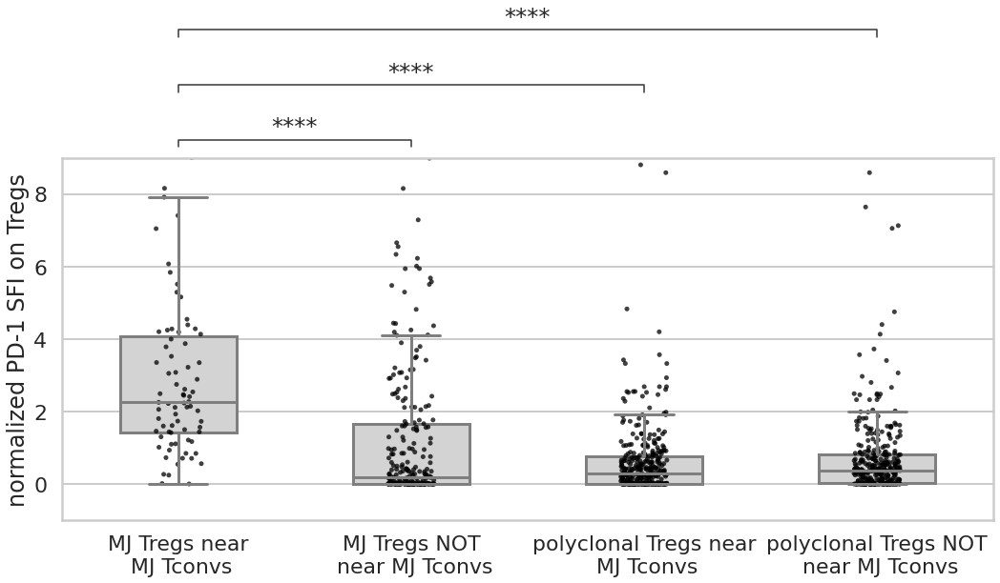

In [288]:
#sns.set_context('poster')
plt.figure(figsize=(17.5,7))

temp_data = tempdf_mjtreg
x = "condition"
y = "PD-1 SFI norm (polyclonal Treg + MJ Treg)"
order = ('MJ Tregs near MJ Tconvs','MJ Tregs NOT near MJ Tconvs','polyclonal Tregs near MJ Tconvs + MJ Tregs', 'polyclonal Tregs NOT near MJ Tconvs')

temp_data[y + ' log2'] = np.log2(temp_data[y])
#y += ' log2'

ax = sns.boxplot(data = temp_data, x=x, y=y, color = "lightgrey", showfliers = False, order = order, width=0.5)
sns.stripplot(data = temp_data, x=x, y=y, jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order = order, alpha = 0.75)
plt.ylim([-1,9])

annotator = Annotator(
    ax,
    (('MJ Tregs near MJ Tconvs','MJ Tregs NOT near MJ Tconvs'),('MJ Tregs near MJ Tconvs','polyclonal Tregs near MJ Tconvs + MJ Tregs'), 
      ('MJ Tregs near MJ Tconvs','polyclonal Tregs NOT near MJ Tconvs')),
    order = order,
    data=temp_data,
    x=x,
    y=y)

annotator.configure(
    test="Mann-Whitney-gt",
    text_format="star",
    loc="outside",
)
annotator.apply_test(nan_policy='omit')
annotator.annotate()
plt.ylabel("normalized PD-1 SFI on Tregs")
plt.xlabel('')
plt.gca().set_xticklabels(('MJ Tregs near\n MJ Tconvs','MJ Tregs NOT\n near MJ Tconvs','polyclonal Tregs near\n MJ Tconvs', 'polyclonal Tregs NOT\n near MJ Tconvs')
)

pass #plt.savefig("",bbox_inches='tight')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

MJ Tregs near MJ Tconvs vs. MJ Tregs NOT near MJ Tconvs: Mann-Whitney-Wilcoxon test greater, P_val:7.142e-01 U_stat=9.585e+03
MJ Tregs near MJ Tconvs vs. polyclonal Tregs near MJ Tconvs + MJ Tregs: Mann-Whitney-Wilcoxon test greater, P_val:6.670e-28 U_stat=2.312e+04
MJ Tregs near MJ Tconvs vs. polyclonal Tregs NOT near MJ Tconvs: Mann-Whitney-Wilcoxon test greater, P_val:3.796e-26 U_stat=2.276e+04


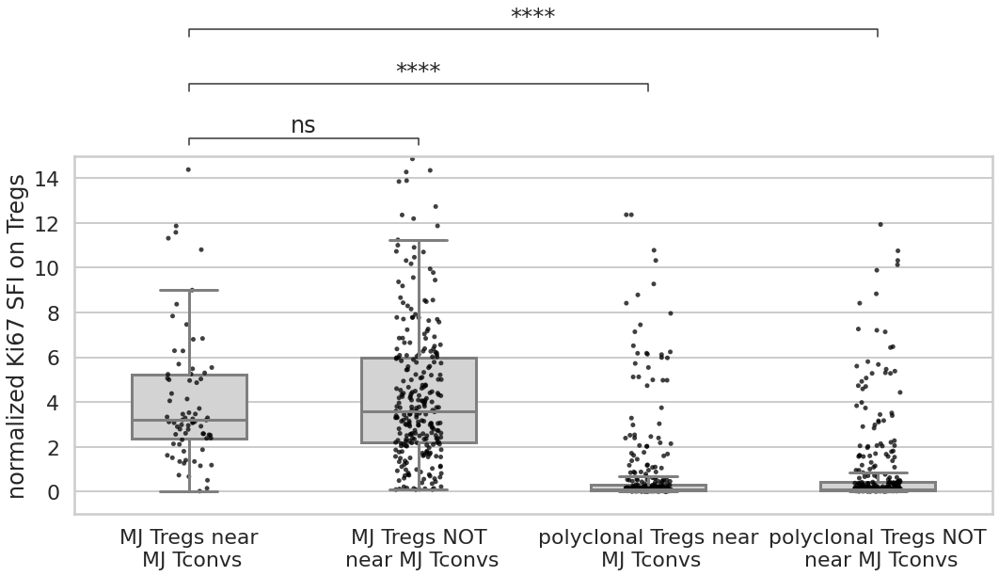

In [289]:
#sns.set_context('poster')
plt.figure(figsize=(17.5,7))

temp_data = tempdf_mjtreg
x = "condition"
y = "Ki67 SFI norm (polyclonal Treg + MJ Treg)"
order = ('MJ Tregs near MJ Tconvs','MJ Tregs NOT near MJ Tconvs','polyclonal Tregs near MJ Tconvs + MJ Tregs', 'polyclonal Tregs NOT near MJ Tconvs')

temp_data[y + ' log2'] = np.log2(temp_data[y])
#y += ' log2'

ax = sns.boxplot(data = temp_data, x=x, y=y, color = "lightgrey", showfliers = False, order = order, width=0.5)
sns.stripplot(data = temp_data, x=x, y=y, jitter=True, zorder=1, ax = ax, dodge = True, color = "black", order = order, alpha = 0.75)
plt.ylim([-1,15])

annotator = Annotator(
    ax,
    (('MJ Tregs near MJ Tconvs','MJ Tregs NOT near MJ Tconvs'),('MJ Tregs near MJ Tconvs','polyclonal Tregs near MJ Tconvs + MJ Tregs'), 
      ('MJ Tregs near MJ Tconvs','polyclonal Tregs NOT near MJ Tconvs')),
    order = order,
    data=temp_data,
    x=x,
    y=y)

annotator.configure(
    test="Mann-Whitney-gt",
    text_format="star",
    loc="outside",
)
annotator.apply_test(nan_policy='omit')
annotator.annotate()
plt.ylabel("normalized Ki67 SFI on Tregs")
plt.xlabel('')
plt.gca().set_xticklabels(('MJ Tregs near\n MJ Tconvs','MJ Tregs NOT\n near MJ Tconvs','polyclonal Tregs near\n MJ Tconvs', 'polyclonal Tregs NOT\n near MJ Tconvs')
)

pass #plt.savefig("",bbox_inches='tight')